## In the wild Dataset preprocessing

- A ROI was first detected using the MaskRCNN. Information about cut areas is saved to adjust landmark annotations.
- Black area was added to make images squared. Information about added areas is saved to adjust landmarks annotations.
- Images are resize to 96 x 96 and reduce to one channel. (OC landmarks were also adjusted)
- Data augmentation??? How?



## Resize and Rescale images

In [1]:
import os
import csv
import pandas as pd
import numpy as np
import skimage
import matplotlib.pyplot as plt

from skimage import io
from skimage.transform import rescale
#from glob import glob

In [2]:
ROOT_DIR = os.path.abspath("../../../")
TEST_DIR = os.path.join(ROOT_DIR, "AllDatasets/InTheWildDataset/ROI/train/") # test or train files path

In [3]:
def preprocessrois (cset="test_", img_size=96):
    #cset = "test_"
    #img_size = 96 #all images will be rescaled to 96 * 96
    for path,folders,u_files in os.walk(TEST_DIR):
        files = [x for x in u_files if '.png' in x]  #only .png files
        files = sorted(files)
        for j in range (0,len(files)):
            #file name should be like this -> roi_0000_125_543.png -> translation y:125 x:543
            info = files[j][9:-4]
            #print(info)
            i = info.find('_')
            trasy = info[:i]     # Y translation value 
            trasx = info[i+1:]   # X translation value 
            print("Y_tras: {} - X_tras: {}".format(trasy, trasx))
            idimage = files[j][4:8]    # get id image from file name
            print("Id_image: {}".format(idimage))

            # validate translation values
            if np.int(trasx) == 0 or np.int(trasy) == 0:
                print('file {} has no value translations'.format(idimage))

            # Get landmarks from csv file, 2 columns (X,Y)
            csvfile = cset + str(idimage) + '.csv'   
            print("csvfile: {}".format(csvfile))
            csvfile = os.path.join(path,csvfile)

            # Validate file exist 
            if not os.path.exists(csvfile):
                print("CSV File does not exist")

            marks = pd.read_csv(csvfile, sep=',')
            xs = marks['X'].values - np.int(trasx)                 
            ys = marks['Y'].values - np.int(trasy)

            # load ROI image
            imgfile = os.path.join(path,files[j])
            img_grey = io.imread(imgfile, as_gray=True) # load image as gray
            # make image squared, adding black pixels
            if img_grey.shape[0] > img_grey.shape[1]:
                # high is bigger than width
                adda = img_grey.shape[0] - img_grey.shape[1]
                adda = np.int(np.ceil(adda / 2))
                new_img = np.zeros((img_grey.shape[0], img_grey.shape[0]), dtype=img_grey.dtype)
                new_img[:img_grey.shape[0],adda:adda + img_grey.shape[1]] = img_grey
                xs = xs + adda 
            else: 
                #width is bigger than high
                adda = img_grey.shape[1] - img_grey.shape[0]
                adda = np.int(np.ceil(adda / 2))
                new_img = np.zeros((img_grey.shape[1], img_grey.shape[1]), dtype=img_grey.dtype)
                new_img[adda:adda+img_grey.shape[0],:img_grey.shape[1]] = img_grey
                ys = ys + adda
            #print(img_grey.shape, new_img.shape)
            rs_img_fact = img_size/new_img.shape[0]
            rs_marks_fact = new_img.shape[0]/img_size
            # rescale image and adjust landmarks
            img_rescaled = rescale(new_img,rs_img_fact, anti_aliasing=False)
            xs = xs / rs_marks_fact
            ys = ys / rs_marks_fact

            # Directory "output" must be exist in path
            # Save csv file
            if not os.path.exists(os.path.join(path, 'output')):
                os.makedirs(os.path.join(path, 'output'))
            newcsvfilename = os.path.join(path, 'output')
            newcsvfilename = os.path.join(newcsvfilename, str(idimage + '.csv'))        
            with open(newcsvfilename, 'w') as csvFile:
                writer = csv.writer(csvFile)
                writer.writerows([['X','Y']])
                for i in range(0,len(xs)):                
                    writer.writerows([[str(xs[i]),str(ys[i])]])
            csvFile.close()

            # Save gray image        
            newpngfilename = os.path.join(path, 'output')
            newpngfilename = os.path.join(newpngfilename, str(idimage + '.png'))        
            plt.imsave(newpngfilename, img_rescaled, cmap = plt.cm.gray)

            # Show image        
            fig = plt.figure(figsize=(5, 5))
            plt.scatter(xs, ys, s=8)
            imgplot = plt.imshow(img_rescaled, cmap = plt.cm.gray)
            plt.show()
        break

Y_tras: 178 - X_tras: 358
Id_image: 0000
csvfile: test_0000.csv


/home/sol/.virtualenvs/maskrcnn/lib/python3.6/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


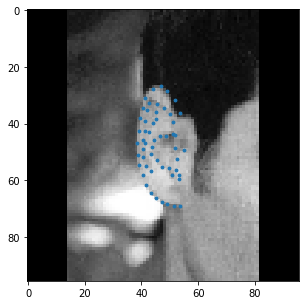

Y_tras: 110 - X_tras: 241
Id_image: 0001
csvfile: test_0001.csv


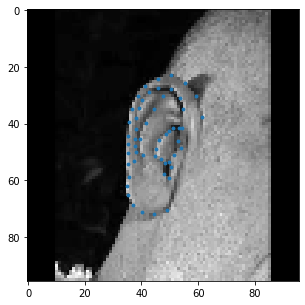

Y_tras: 243 - X_tras: 31
Id_image: 0002
csvfile: test_0002.csv


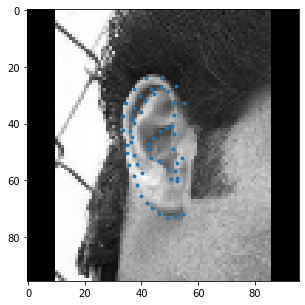

Y_tras: 389 - X_tras: 93
Id_image: 0003
csvfile: test_0003.csv


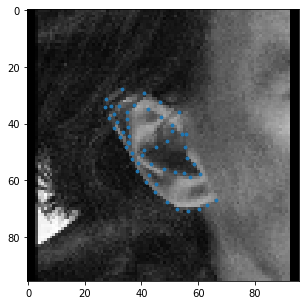

Y_tras: 210 - X_tras: 417
Id_image: 0004
csvfile: test_0004.csv


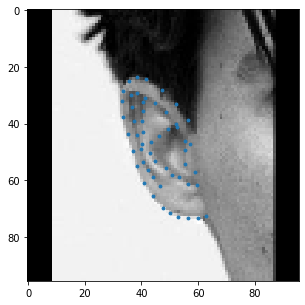

Y_tras: 230 - X_tras: 6
Id_image: 0005
csvfile: test_0005.csv


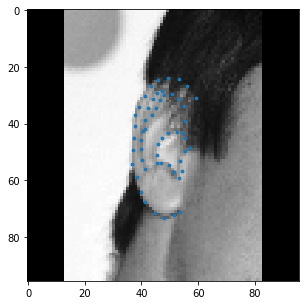

Y_tras: 334 - X_tras: 323
Id_image: 0006
csvfile: test_0006.csv


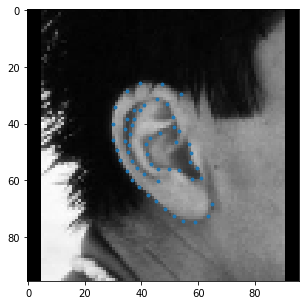

Y_tras: 168 - X_tras: 263
Id_image: 0007
csvfile: test_0007.csv


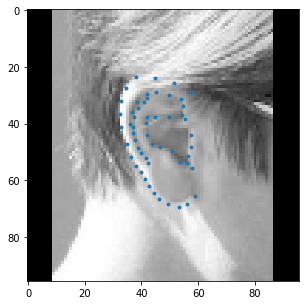

Y_tras: 339 - X_tras: 0
Id_image: 0008
file 0008 has no value translations
csvfile: test_0008.csv


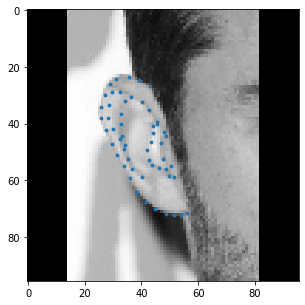

Y_tras: 260 - X_tras: 151
Id_image: 0009
csvfile: test_0009.csv


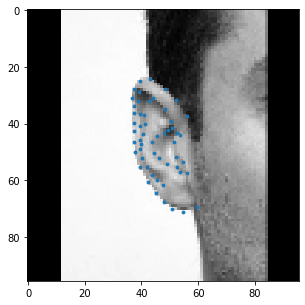

Y_tras: 128 - X_tras: 235
Id_image: 0010
csvfile: test_0010.csv


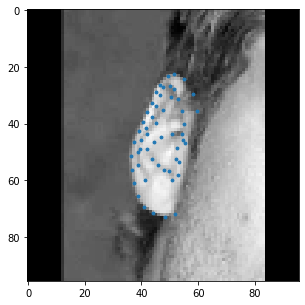

Y_tras: 259 - X_tras: 28
Id_image: 0011
csvfile: test_0011.csv


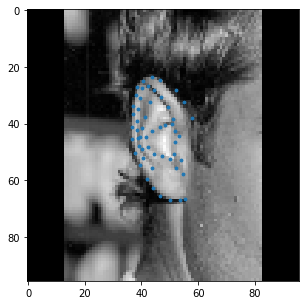

Y_tras: 263 - X_tras: 173
Id_image: 0012
csvfile: test_0012.csv


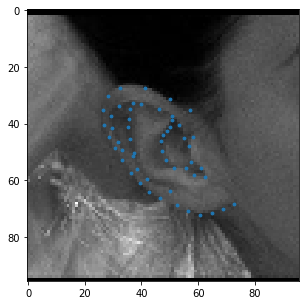

Y_tras: 198 - X_tras: 300
Id_image: 0013
csvfile: test_0013.csv


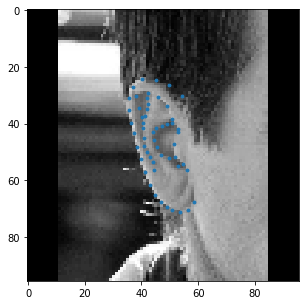

Y_tras: 194 - X_tras: 245
Id_image: 0014
csvfile: test_0014.csv


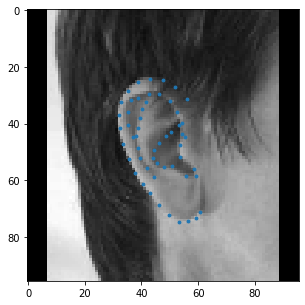

Y_tras: 420 - X_tras: 482
Id_image: 0015
csvfile: test_0015.csv


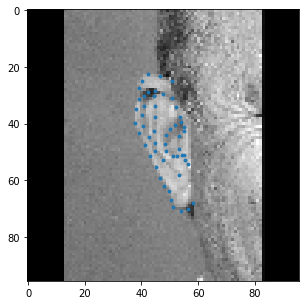

Y_tras: 38 - X_tras: 99
Id_image: 0016
csvfile: test_0016.csv


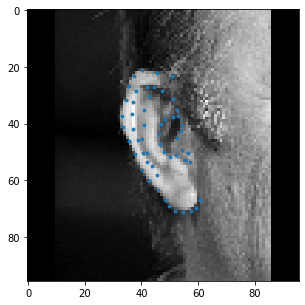

Y_tras: 242 - X_tras: 150
Id_image: 0017
csvfile: test_0017.csv


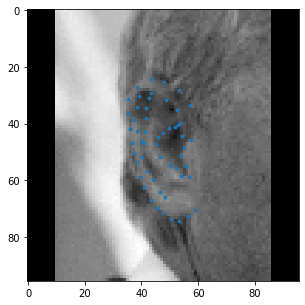

Y_tras: 254 - X_tras: 171
Id_image: 0018
csvfile: test_0018.csv


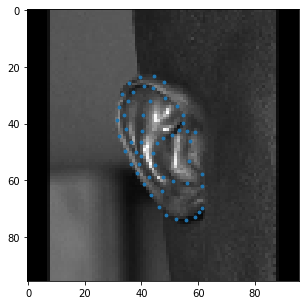

Y_tras: 175 - X_tras: 56
Id_image: 0019
csvfile: test_0019.csv


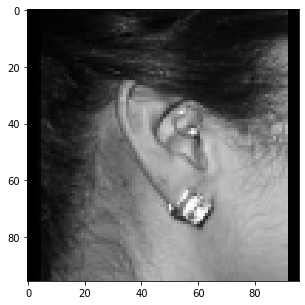

Y_tras: 246 - X_tras: 211
Id_image: 0020
csvfile: test_0020.csv


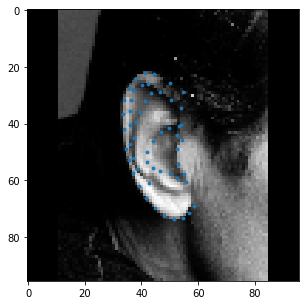

Y_tras: 145 - X_tras: 93
Id_image: 0021
csvfile: test_0021.csv


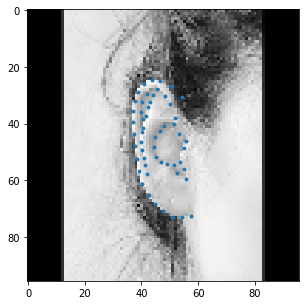

Y_tras: 140 - X_tras: 210
Id_image: 0022
csvfile: test_0022.csv


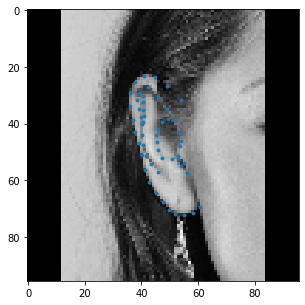

Y_tras: 280 - X_tras: 0
Id_image: 0023
file 0023 has no value translations
csvfile: test_0023.csv


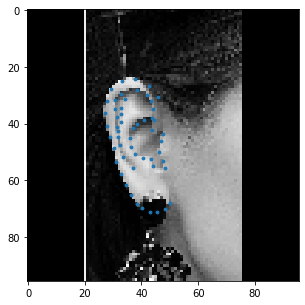

Y_tras: 581 - X_tras: 373
Id_image: 0024
csvfile: test_0024.csv


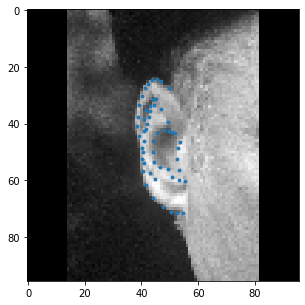

Y_tras: 447 - X_tras: 707
Id_image: 0025
csvfile: test_0025.csv


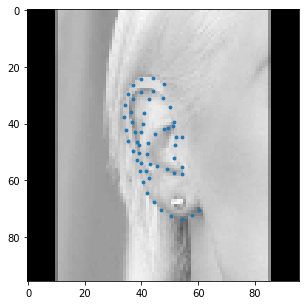

Y_tras: 190 - X_tras: 50
Id_image: 0026
csvfile: test_0026.csv


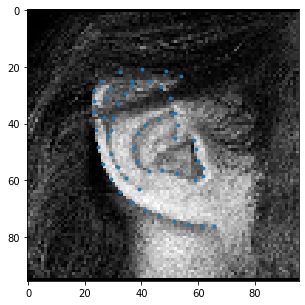

Y_tras: 93 - X_tras: 352
Id_image: 0027
csvfile: test_0027.csv


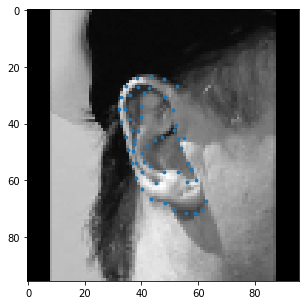

Y_tras: 213 - X_tras: 247
Id_image: 0028
csvfile: test_0028.csv


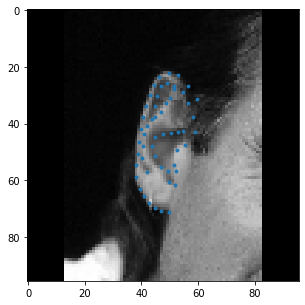

Y_tras: 90 - X_tras: 341
Id_image: 0029
csvfile: test_0029.csv


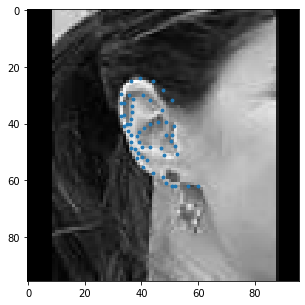

Y_tras: 186 - X_tras: 607
Id_image: 0030
csvfile: test_0030.csv


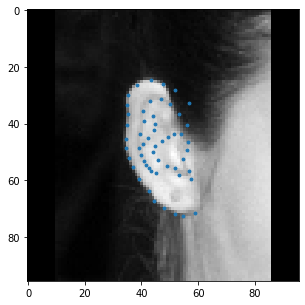

Y_tras: 210 - X_tras: 298
Id_image: 0031
csvfile: test_0031.csv


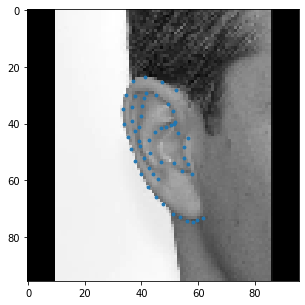

Y_tras: 143 - X_tras: 407
Id_image: 0032
csvfile: test_0032.csv


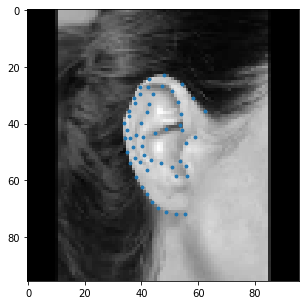

Y_tras: 238 - X_tras: 558
Id_image: 0033
csvfile: test_0033.csv


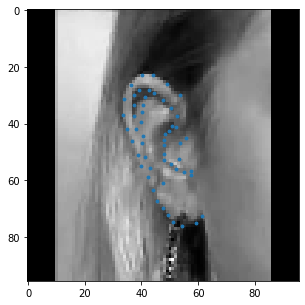

Y_tras: 109 - X_tras: 33
Id_image: 0034
csvfile: test_0034.csv


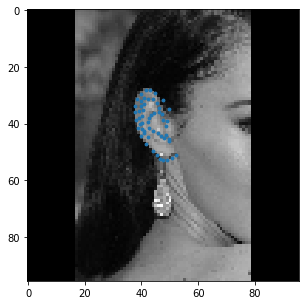

Y_tras: 201 - X_tras: 274
Id_image: 0035
csvfile: test_0035.csv


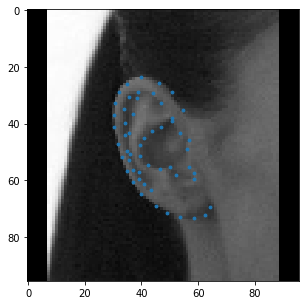

Y_tras: 348 - X_tras: 151
Id_image: 0036
csvfile: test_0036.csv


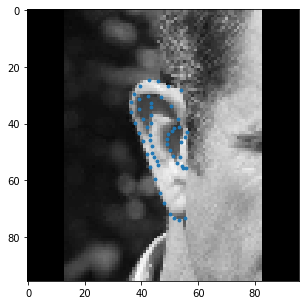

Y_tras: 616 - X_tras: 753
Id_image: 0037
csvfile: test_0037.csv


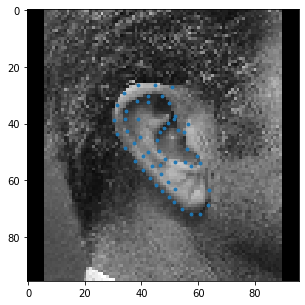

Y_tras: 503 - X_tras: 40
Id_image: 0038
csvfile: test_0038.csv


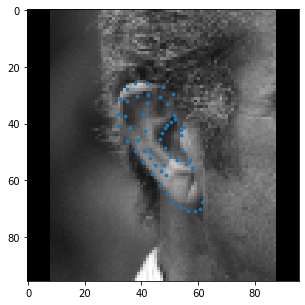

Y_tras: 74 - X_tras: 70
Id_image: 0039
csvfile: test_0039.csv


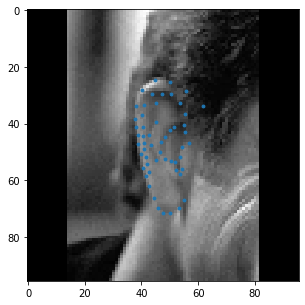

Y_tras: 146 - X_tras: 464
Id_image: 0040
csvfile: test_0040.csv


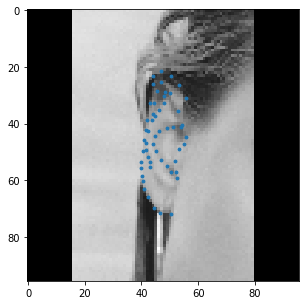

Y_tras: 548 - X_tras: 0
Id_image: 0041
file 0041 has no value translations
csvfile: test_0041.csv


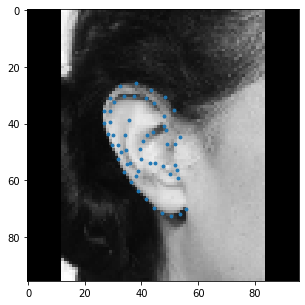

Y_tras: 413 - X_tras: 180
Id_image: 0042
csvfile: test_0042.csv


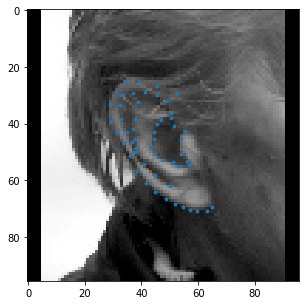

Y_tras: 154 - X_tras: 145
Id_image: 0043
csvfile: test_0043.csv


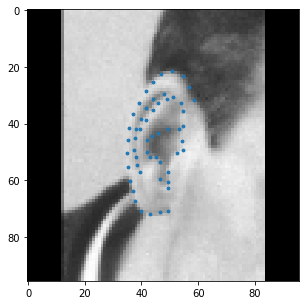

Y_tras: 215 - X_tras: 0
Id_image: 0044
file 0044 has no value translations
csvfile: test_0044.csv


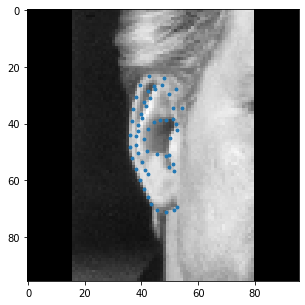

Y_tras: 264 - X_tras: 186
Id_image: 0045
csvfile: test_0045.csv


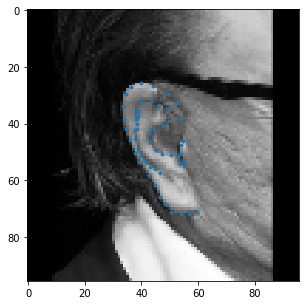

Y_tras: 177 - X_tras: 26
Id_image: 0046
csvfile: test_0046.csv


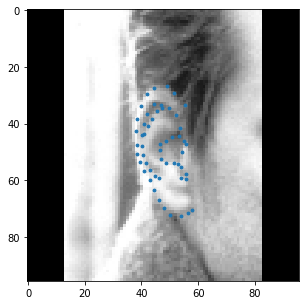

Y_tras: 179 - X_tras: 355
Id_image: 0047
csvfile: test_0047.csv


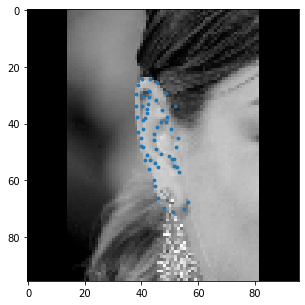

Y_tras: 123 - X_tras: 135
Id_image: 0048
csvfile: test_0048.csv


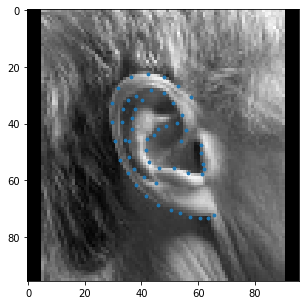

Y_tras: 147 - X_tras: 325
Id_image: 0049
csvfile: test_0049.csv


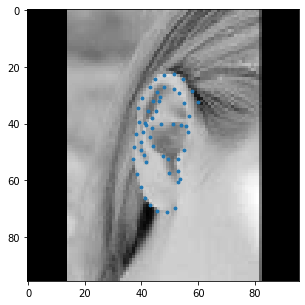

Y_tras: 558 - X_tras: 21
Id_image: 0050
csvfile: test_0050.csv


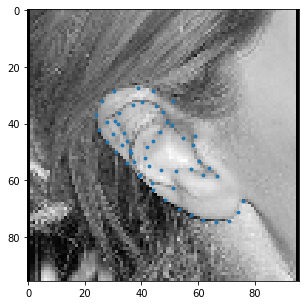

Y_tras: 54 - X_tras: 0
Id_image: 0051
file 0051 has no value translations
csvfile: test_0051.csv


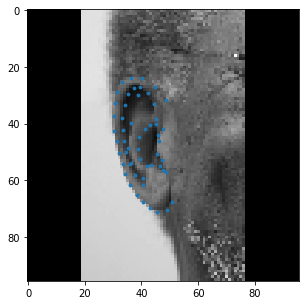

Y_tras: 0 - X_tras: 46
Id_image: 0052
file 0052 has no value translations
csvfile: test_0052.csv


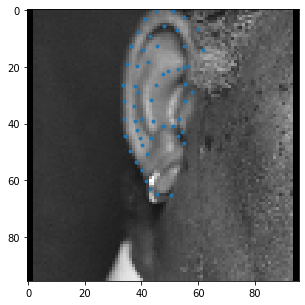

Y_tras: 246 - X_tras: 701
Id_image: 0053
csvfile: test_0053.csv


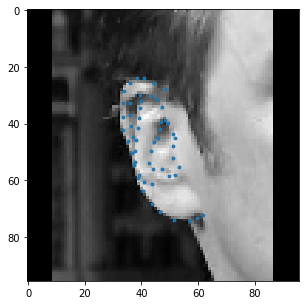

Y_tras: 314 - X_tras: 161
Id_image: 0054
csvfile: test_0054.csv


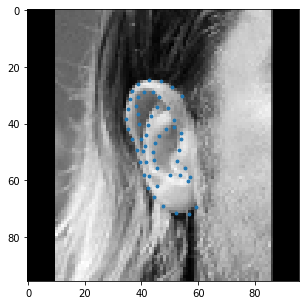

Y_tras: 386 - X_tras: 679
Id_image: 0055
csvfile: test_0055.csv


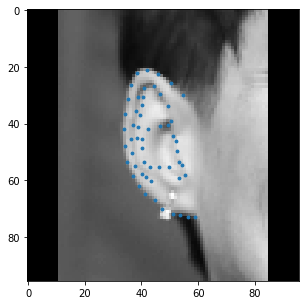

Y_tras: 136 - X_tras: 547
Id_image: 0056
csvfile: test_0056.csv


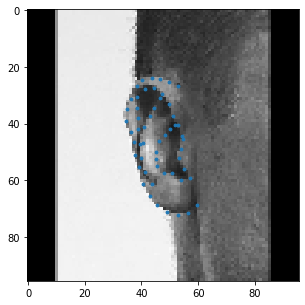

Y_tras: 414 - X_tras: 516
Id_image: 0057
csvfile: test_0057.csv


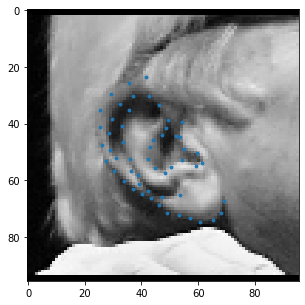

Y_tras: 37 - X_tras: 0
Id_image: 0058
file 0058 has no value translations
csvfile: test_0058.csv


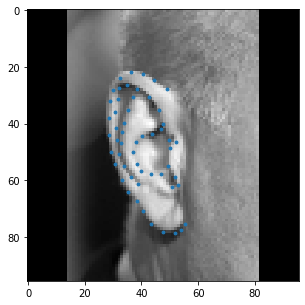

Y_tras: 210 - X_tras: 578
Id_image: 0059
csvfile: test_0059.csv


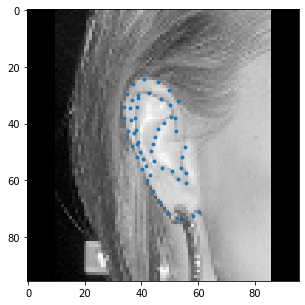

Y_tras: 252 - X_tras: 427
Id_image: 0060
csvfile: test_0060.csv


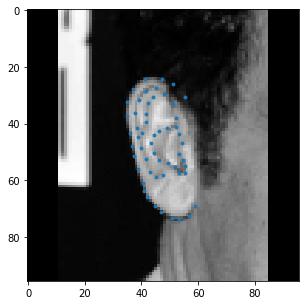

Y_tras: 389 - X_tras: 199
Id_image: 0061
csvfile: test_0061.csv


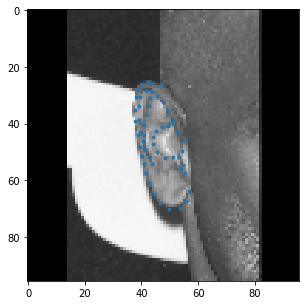

Y_tras: 53 - X_tras: 171
Id_image: 0062
csvfile: test_0062.csv


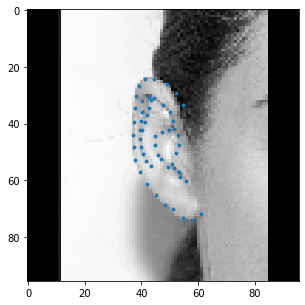

Y_tras: 430 - X_tras: 51
Id_image: 0063
csvfile: test_0063.csv


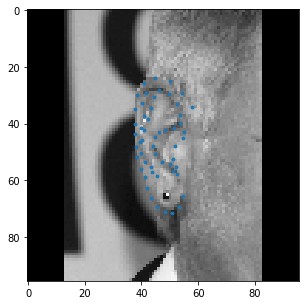

Y_tras: 94 - X_tras: 36
Id_image: 0064
csvfile: test_0064.csv


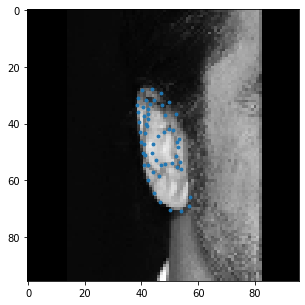

Y_tras: 187 - X_tras: 449
Id_image: 0065
csvfile: test_0065.csv


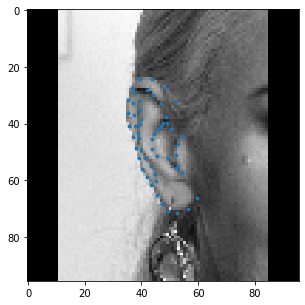

Y_tras: 298 - X_tras: 156
Id_image: 0066
csvfile: test_0066.csv


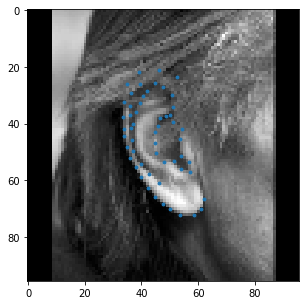

Y_tras: 269 - X_tras: 299
Id_image: 0067
csvfile: test_0067.csv


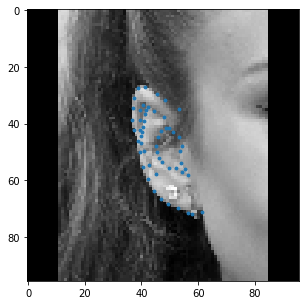

Y_tras: 243 - X_tras: 336
Id_image: 0068
csvfile: test_0068.csv


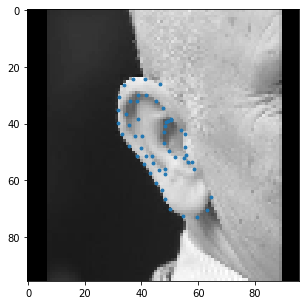

Y_tras: 505 - X_tras: 344
Id_image: 0069
csvfile: test_0069.csv


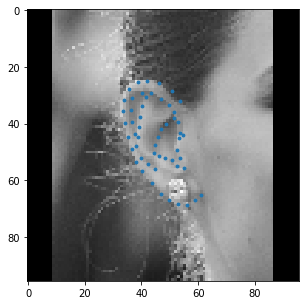

Y_tras: 172 - X_tras: 498
Id_image: 0070
csvfile: test_0070.csv


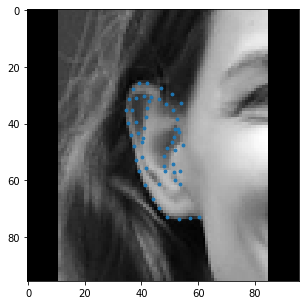

Y_tras: 328 - X_tras: 386
Id_image: 0071
csvfile: test_0071.csv


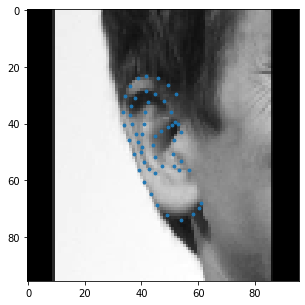

Y_tras: 216 - X_tras: 554
Id_image: 0072
csvfile: test_0072.csv


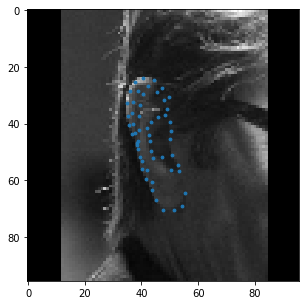

Y_tras: 233 - X_tras: 194
Id_image: 0073
csvfile: test_0073.csv


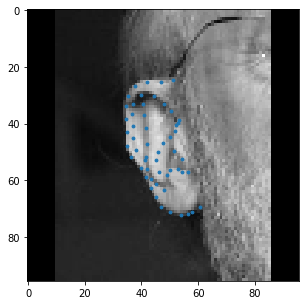

Y_tras: 182 - X_tras: 249
Id_image: 0074
csvfile: test_0074.csv


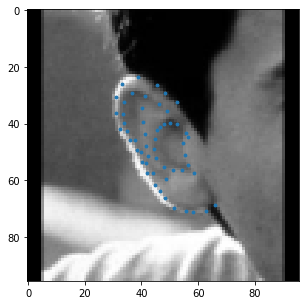

Y_tras: 189 - X_tras: 478
Id_image: 0075
csvfile: test_0075.csv


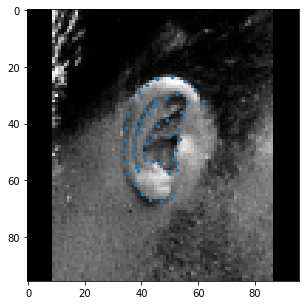

Y_tras: 129 - X_tras: 56
Id_image: 0076
csvfile: test_0076.csv


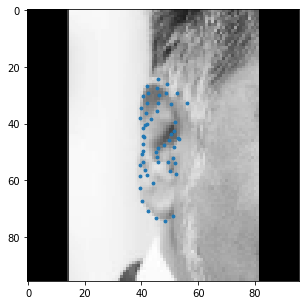

Y_tras: 246 - X_tras: 104
Id_image: 0077
csvfile: test_0077.csv


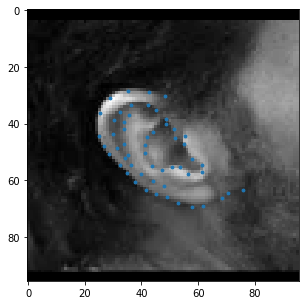

Y_tras: 274 - X_tras: 335
Id_image: 0078
csvfile: test_0078.csv


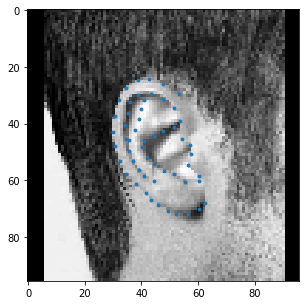

Y_tras: 605 - X_tras: 71
Id_image: 0079
csvfile: test_0079.csv


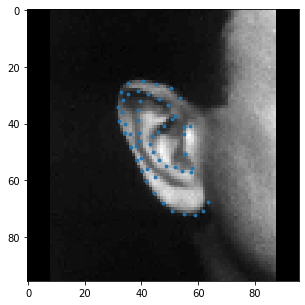

Y_tras: 530 - X_tras: 372
Id_image: 0080
csvfile: test_0080.csv


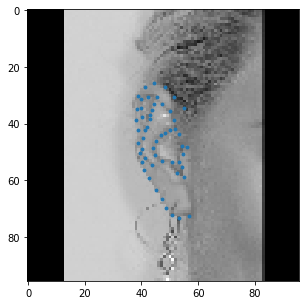

Y_tras: 180 - X_tras: 378
Id_image: 0081
csvfile: test_0081.csv


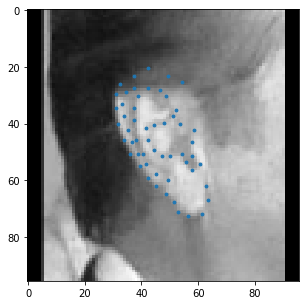

Y_tras: 253 - X_tras: 40
Id_image: 0082
csvfile: test_0082.csv


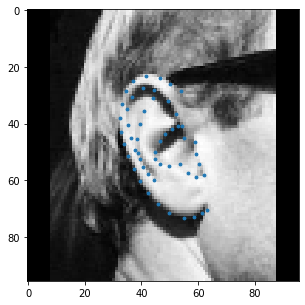

Y_tras: 264 - X_tras: 226
Id_image: 0083
csvfile: test_0083.csv


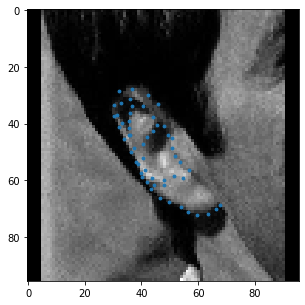

Y_tras: 139 - X_tras: 321
Id_image: 0084
csvfile: test_0084.csv


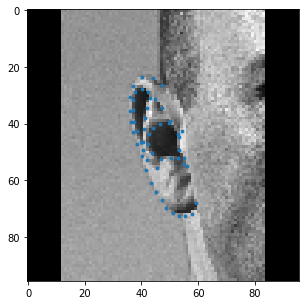

Y_tras: 609 - X_tras: 898
Id_image: 0085
csvfile: test_0085.csv


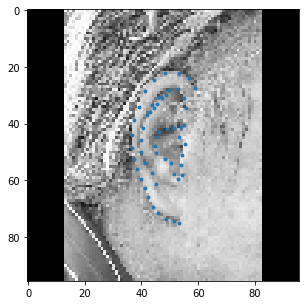

Y_tras: 182 - X_tras: 265
Id_image: 0086
csvfile: test_0086.csv


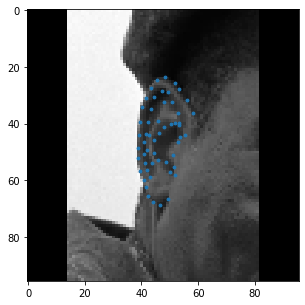

Y_tras: 584 - X_tras: 1106
Id_image: 0087
csvfile: test_0087.csv


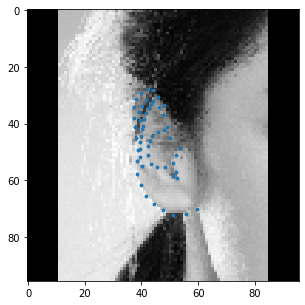

Y_tras: 833 - X_tras: 235
Id_image: 0088
csvfile: test_0088.csv


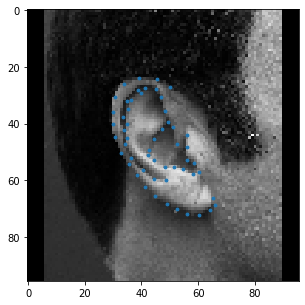

Y_tras: 117 - X_tras: 390
Id_image: 0089
csvfile: test_0089.csv


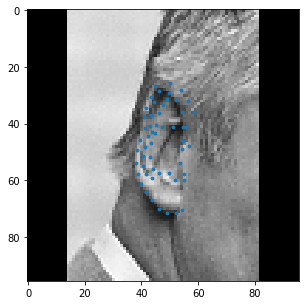

Y_tras: 178 - X_tras: 258
Id_image: 0090
csvfile: test_0090.csv


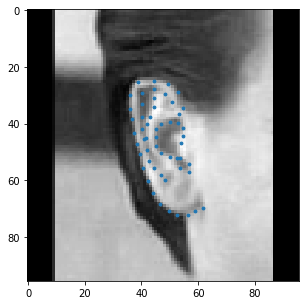

Y_tras: 180 - X_tras: 172
Id_image: 0091
csvfile: test_0091.csv


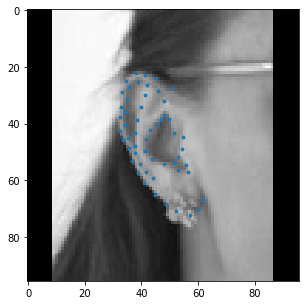

Y_tras: 481 - X_tras: 124
Id_image: 0092
csvfile: test_0092.csv


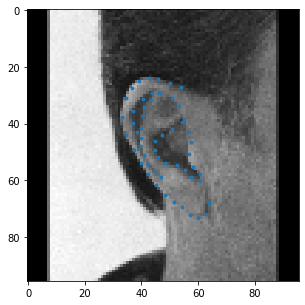

Y_tras: 259 - X_tras: 666
Id_image: 0093
csvfile: test_0093.csv


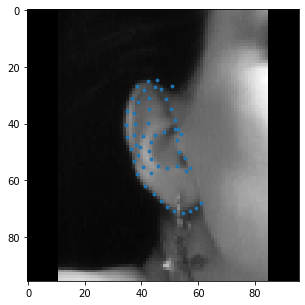

Y_tras: 606 - X_tras: 400
Id_image: 0094
csvfile: test_0094.csv


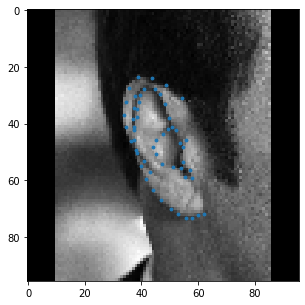

Y_tras: 194 - X_tras: 721
Id_image: 0095
csvfile: test_0095.csv


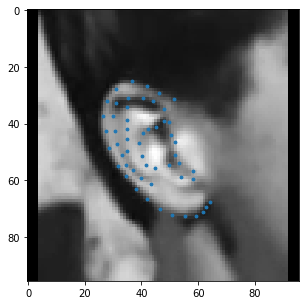

Y_tras: 272 - X_tras: 22
Id_image: 0096
csvfile: test_0096.csv


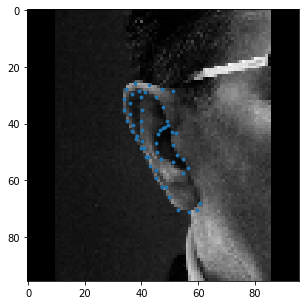

Y_tras: 512 - X_tras: 456
Id_image: 0097
csvfile: test_0097.csv


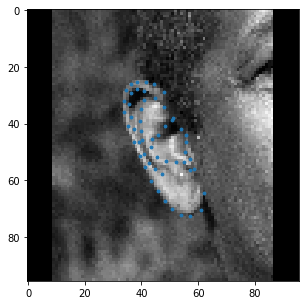

Y_tras: 381 - X_tras: 501
Id_image: 0098
csvfile: test_0098.csv


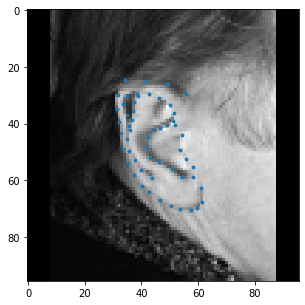

Y_tras: 172 - X_tras: 0
Id_image: 0099
file 0099 has no value translations
csvfile: test_0099.csv


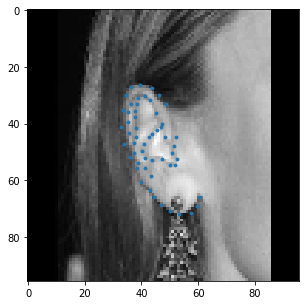

Y_tras: 76 - X_tras: 361
Id_image: 0100
csvfile: test_0100.csv


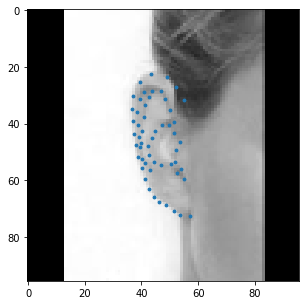

Y_tras: 730 - X_tras: 243
Id_image: 0101
csvfile: test_0101.csv


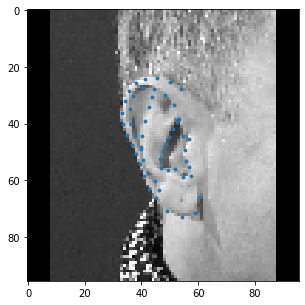

Y_tras: 174 - X_tras: 402
Id_image: 0102
csvfile: test_0102.csv


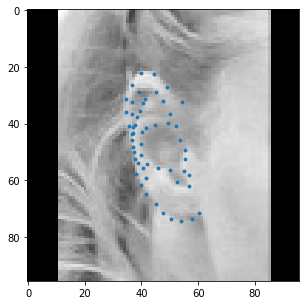

Y_tras: 242 - X_tras: 363
Id_image: 0103
csvfile: test_0103.csv


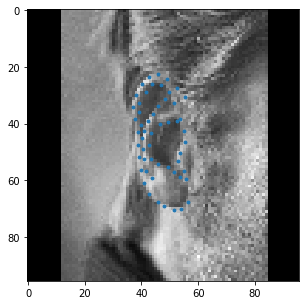

Y_tras: 467 - X_tras: 822
Id_image: 0104
csvfile: test_0104.csv


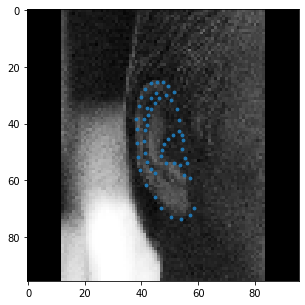

In [4]:
preprocessrois("test_", 96)

Y_tras: 125 - X_tras: 543
Id_image: 0000
csvfile: train_0000.csv


/home/sol/.virtualenvs/maskrcnn/lib/python3.6/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '


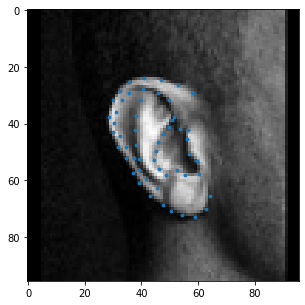

Y_tras: 227 - X_tras: 546
Id_image: 0001
csvfile: train_0001.csv


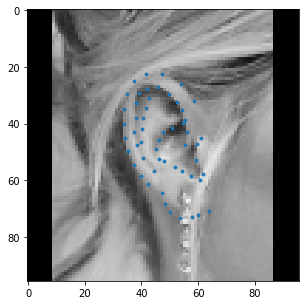

Y_tras: 291 - X_tras: 431
Id_image: 0002
csvfile: train_0002.csv


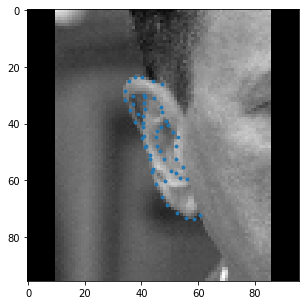

Y_tras: 154 - X_tras: 607
Id_image: 0003
csvfile: train_0003.csv


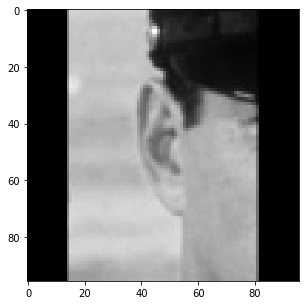

Y_tras: 634 - X_tras: 305
Id_image: 0004
csvfile: train_0004.csv


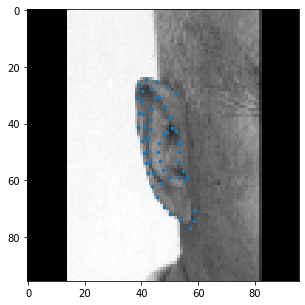

Y_tras: 52 - X_tras: 460
Id_image: 0005
csvfile: train_0005.csv


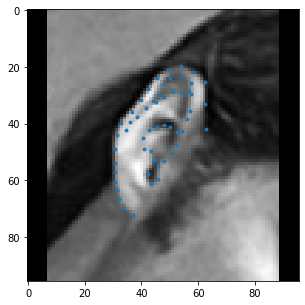

Y_tras: 234 - X_tras: 176
Id_image: 0006
csvfile: train_0006.csv


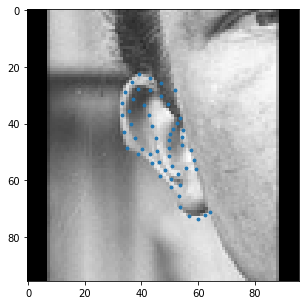

Y_tras: 163 - X_tras: 115
Id_image: 0007
csvfile: train_0007.csv


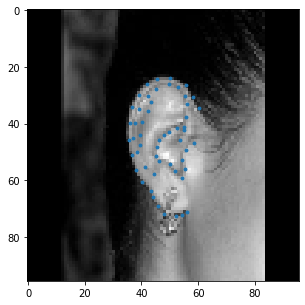

Y_tras: 231 - X_tras: 231
Id_image: 0008
csvfile: train_0008.csv


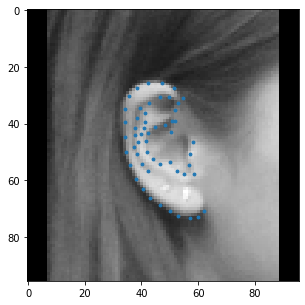

Y_tras: 258 - X_tras: 62
Id_image: 0009
csvfile: train_0009.csv


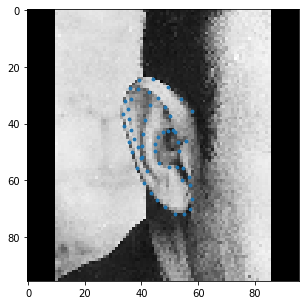

Y_tras: 85 - X_tras: 0
Id_image: 0010
file 0010 has no value translations
csvfile: train_0010.csv


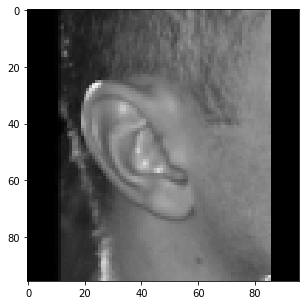

Y_tras: 217 - X_tras: 642
Id_image: 0011
csvfile: train_0011.csv


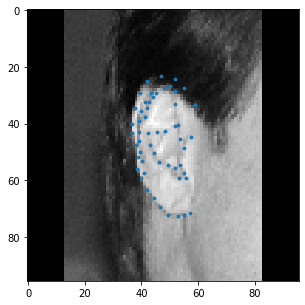

Y_tras: 1171 - X_tras: 468
Id_image: 0012
csvfile: train_0012.csv


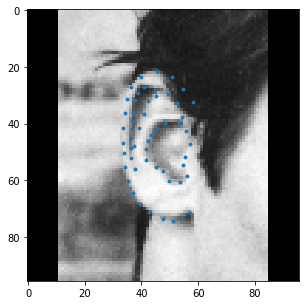

Y_tras: 342 - X_tras: 145
Id_image: 0013
csvfile: train_0013.csv


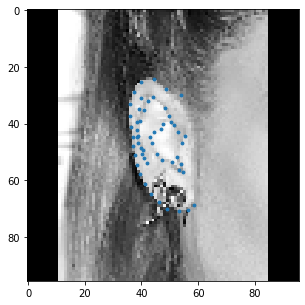

Y_tras: 109 - X_tras: 396
Id_image: 0014
csvfile: train_0014.csv


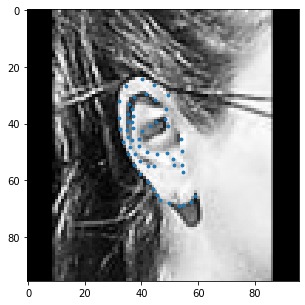

Y_tras: 463 - X_tras: 0
Id_image: 0015
file 0015 has no value translations
csvfile: train_0015.csv


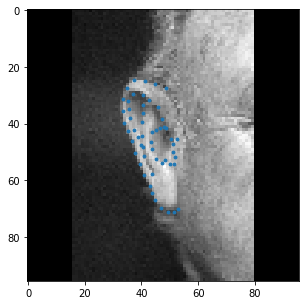

Y_tras: 1082 - X_tras: 518
Id_image: 0016
csvfile: train_0016.csv


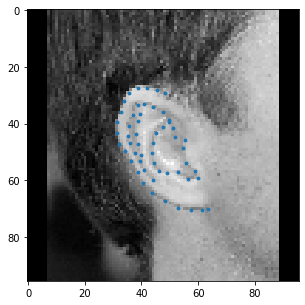

Y_tras: 28 - X_tras: 484
Id_image: 0017
csvfile: train_0017.csv


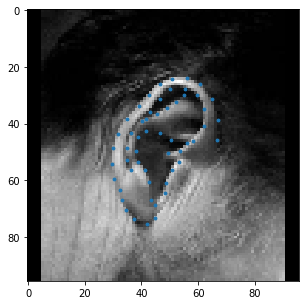

Y_tras: 77 - X_tras: 120
Id_image: 0018
csvfile: train_0018.csv


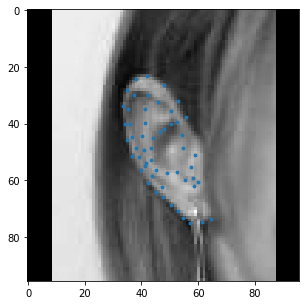

Y_tras: 646 - X_tras: 368
Id_image: 0019
csvfile: train_0019.csv


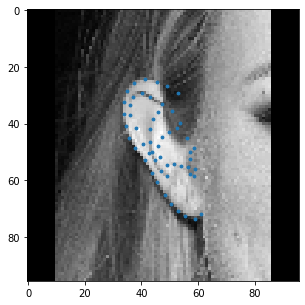

Y_tras: 107 - X_tras: 214
Id_image: 0020
csvfile: train_0020.csv


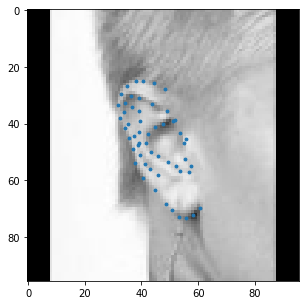

Y_tras: 904 - X_tras: 0
Id_image: 0021
file 0021 has no value translations
csvfile: train_0021.csv


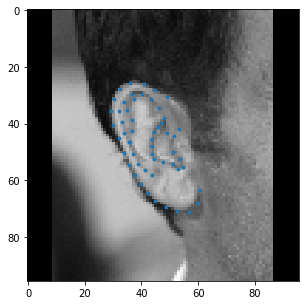

Y_tras: 632 - X_tras: 282
Id_image: 0022
csvfile: train_0022.csv


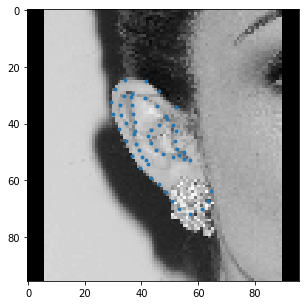

Y_tras: 320 - X_tras: 351
Id_image: 0023
csvfile: train_0023.csv


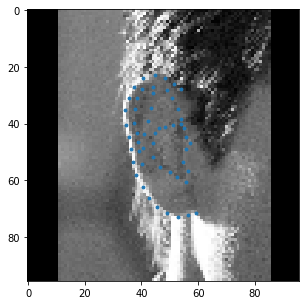

Y_tras: 297 - X_tras: 0
Id_image: 0024
file 0024 has no value translations
csvfile: train_0024.csv


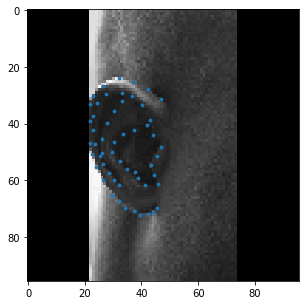

Y_tras: 16 - X_tras: 113
Id_image: 0025
csvfile: train_0025.csv


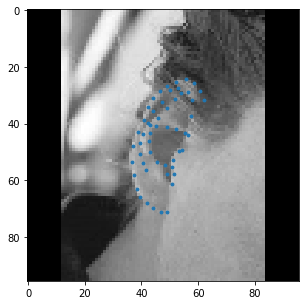

Y_tras: 159 - X_tras: 448
Id_image: 0026
csvfile: train_0026.csv


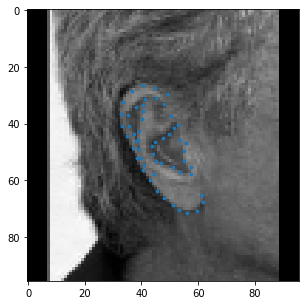

Y_tras: 870 - X_tras: 383
Id_image: 0027
csvfile: train_0027.csv


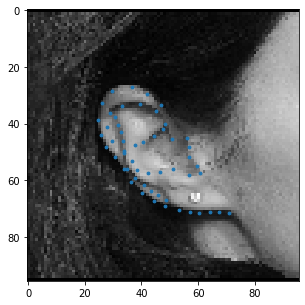

Y_tras: 38 - X_tras: 92
Id_image: 0028
csvfile: train_0028.csv


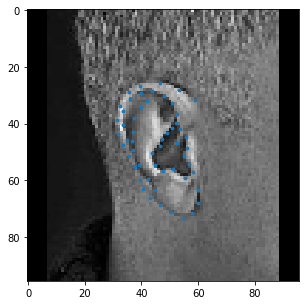

Y_tras: 230 - X_tras: 193
Id_image: 0029
csvfile: train_0029.csv


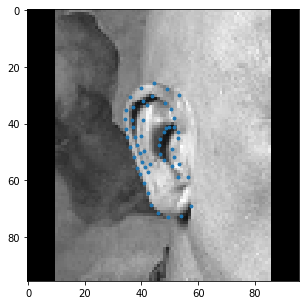

Y_tras: 286 - X_tras: 137
Id_image: 0030
csvfile: train_0030.csv


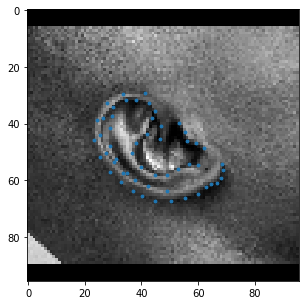

Y_tras: 620 - X_tras: 252
Id_image: 0031
csvfile: train_0031.csv


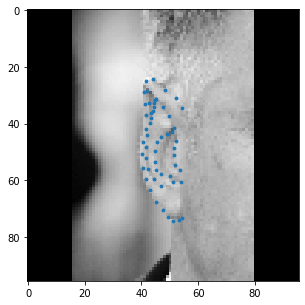

Y_tras: 539 - X_tras: 22
Id_image: 0032
csvfile: train_0032.csv


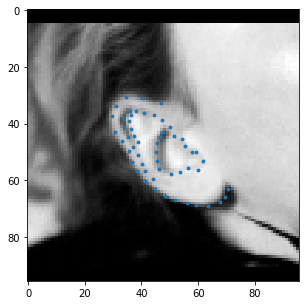

Y_tras: 197 - X_tras: 143
Id_image: 0033
csvfile: train_0033.csv


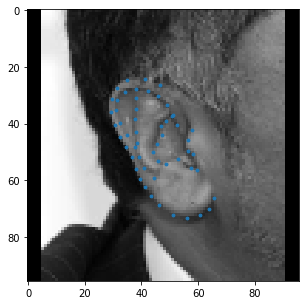

Y_tras: 61 - X_tras: 33
Id_image: 0034
csvfile: train_0034.csv


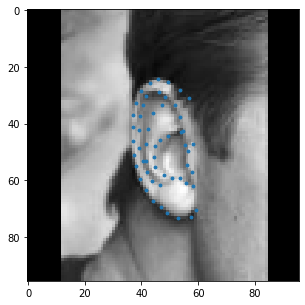

Y_tras: 229 - X_tras: 196
Id_image: 0035
csvfile: train_0035.csv


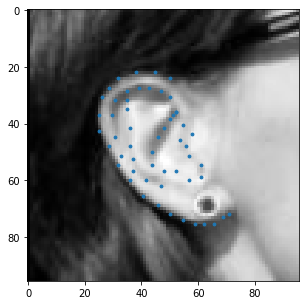

Y_tras: 186 - X_tras: 87
Id_image: 0036
csvfile: train_0036.csv


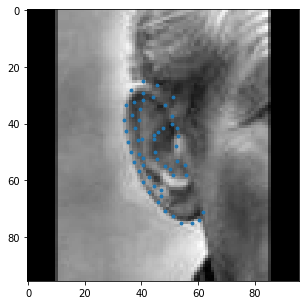

Y_tras: 233 - X_tras: 788
Id_image: 0037
csvfile: train_0037.csv


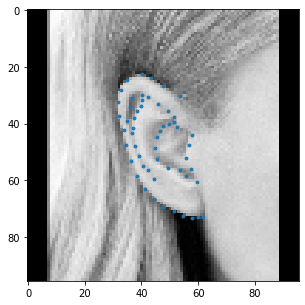

Y_tras: 331 - X_tras: 0
Id_image: 0038
file 0038 has no value translations
csvfile: train_0038.csv


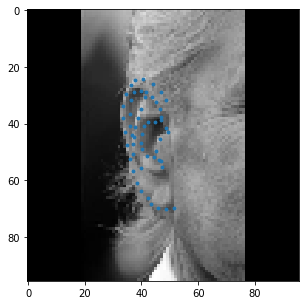

Y_tras: 213 - X_tras: 329
Id_image: 0039
csvfile: train_0039.csv


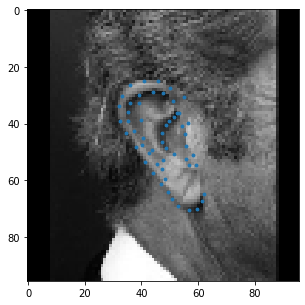

Y_tras: 200 - X_tras: 393
Id_image: 0040
csvfile: train_0040.csv


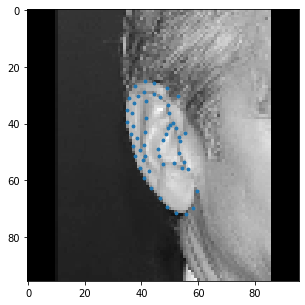

Y_tras: 108 - X_tras: 718
Id_image: 0041
csvfile: train_0041.csv


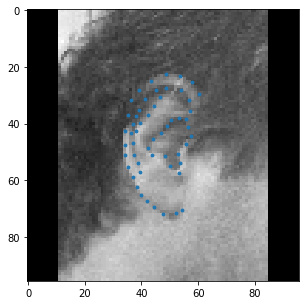

Y_tras: 287 - X_tras: 236
Id_image: 0042
csvfile: train_0042.csv


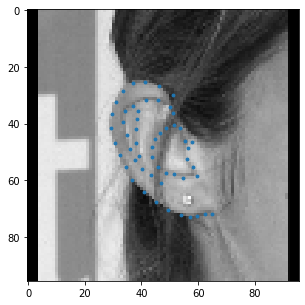

Y_tras: 182 - X_tras: 55
Id_image: 0043
csvfile: train_0043.csv


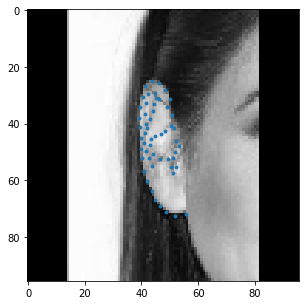

Y_tras: 185 - X_tras: 175
Id_image: 0044
csvfile: train_0044.csv


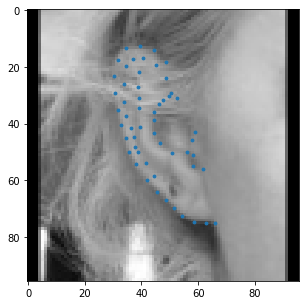

Y_tras: 186 - X_tras: 50
Id_image: 0045
csvfile: train_0045.csv


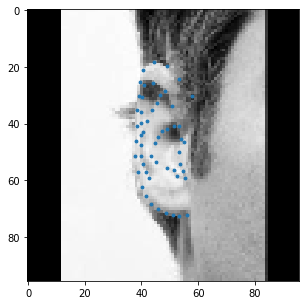

Y_tras: 163 - X_tras: 79
Id_image: 0046
csvfile: train_0046.csv


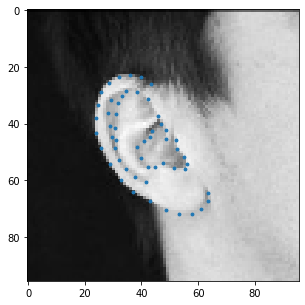

Y_tras: 136 - X_tras: 50
Id_image: 0047
csvfile: train_0047.csv


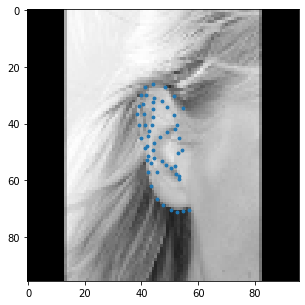

Y_tras: 248 - X_tras: 178
Id_image: 0048
csvfile: train_0048.csv


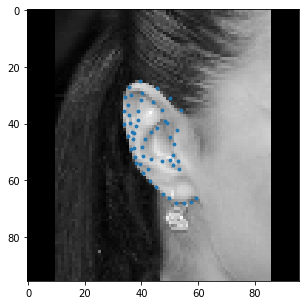

Y_tras: 229 - X_tras: 154
Id_image: 0049
csvfile: train_0049.csv


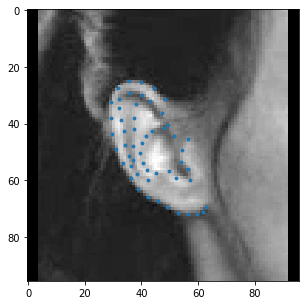

Y_tras: 264 - X_tras: 133
Id_image: 0050
csvfile: train_0050.csv


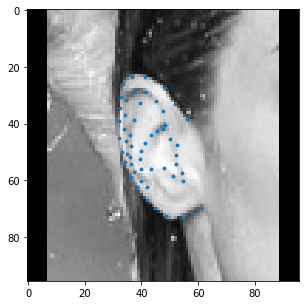

Y_tras: 316 - X_tras: 277
Id_image: 0051
csvfile: train_0051.csv


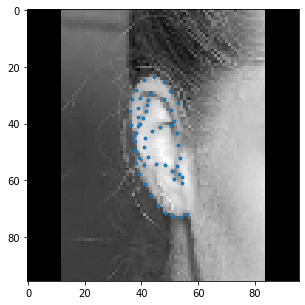

Y_tras: 157 - X_tras: 389
Id_image: 0052
csvfile: train_0052.csv


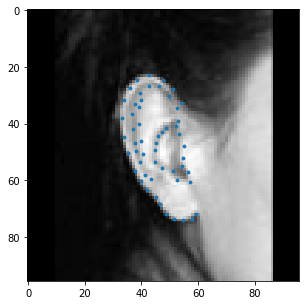

Y_tras: 239 - X_tras: 0
Id_image: 0053
file 0053 has no value translations
csvfile: train_0053.csv


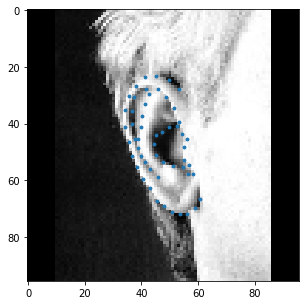

Y_tras: 263 - X_tras: 92
Id_image: 0054
csvfile: train_0054.csv


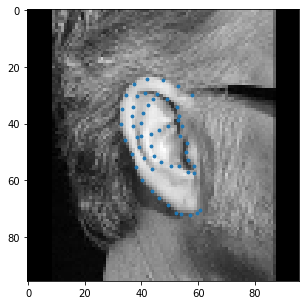

Y_tras: 336 - X_tras: 1335
Id_image: 0055
csvfile: train_0055.csv


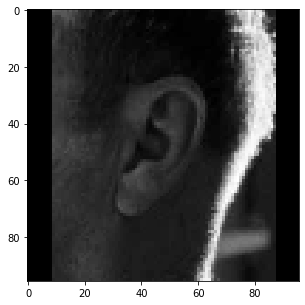

Y_tras: 1000 - X_tras: 399
Id_image: 0056
csvfile: train_0056.csv


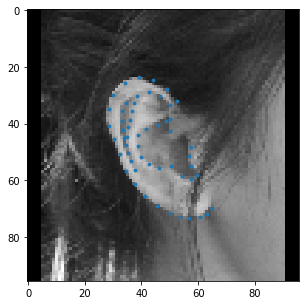

Y_tras: 119 - X_tras: 479
Id_image: 0057
csvfile: train_0057.csv


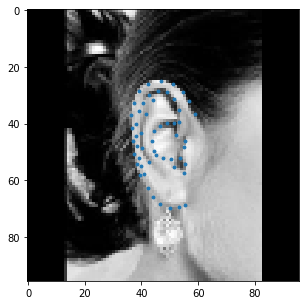

Y_tras: 243 - X_tras: 218
Id_image: 0058
csvfile: train_0058.csv


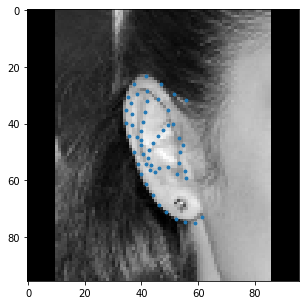

Y_tras: 127 - X_tras: 344
Id_image: 0059
csvfile: train_0059.csv


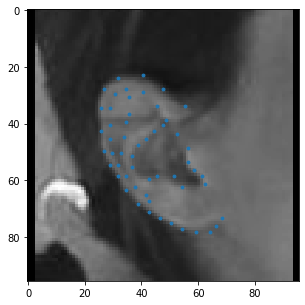

Y_tras: 201 - X_tras: 141
Id_image: 0060
csvfile: train_0060.csv


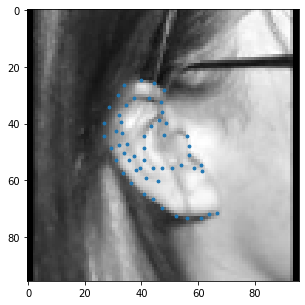

Y_tras: 242 - X_tras: 0
Id_image: 0061
file 0061 has no value translations
csvfile: train_0061.csv


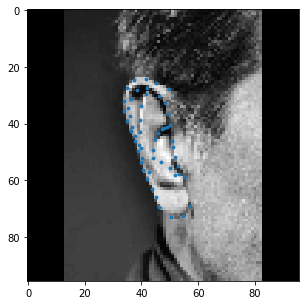

Y_tras: 327 - X_tras: 71
Id_image: 0062
csvfile: train_0062.csv


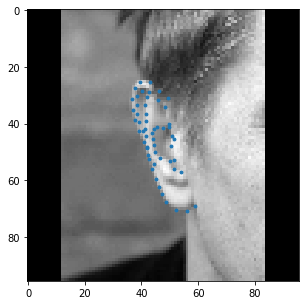

Y_tras: 225 - X_tras: 1
Id_image: 0063
csvfile: train_0063.csv


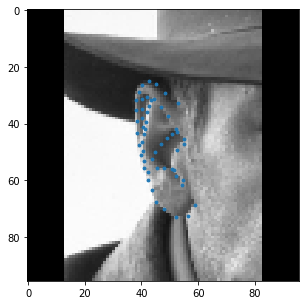

Y_tras: 121 - X_tras: 301
Id_image: 0064
csvfile: train_0064.csv


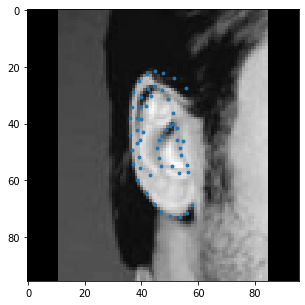

Y_tras: 159 - X_tras: 281
Id_image: 0065
csvfile: train_0065.csv


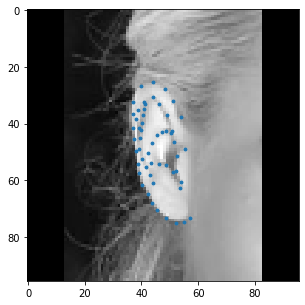

Y_tras: 208 - X_tras: 329
Id_image: 0066
csvfile: train_0066.csv


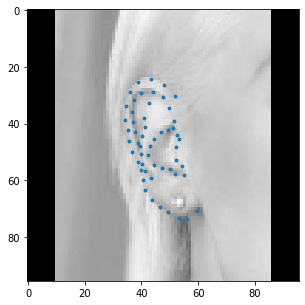

Y_tras: 240 - X_tras: 110
Id_image: 0067
csvfile: train_0067.csv


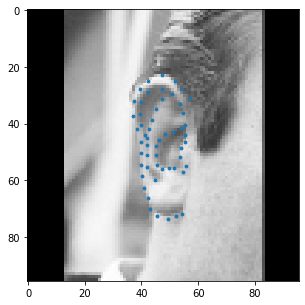

Y_tras: 152 - X_tras: 803
Id_image: 0068
csvfile: train_0068.csv


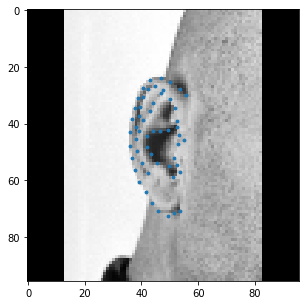

Y_tras: 130 - X_tras: 177
Id_image: 0069
csvfile: train_0069.csv


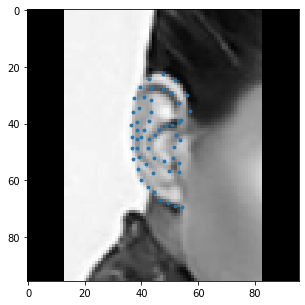

Y_tras: 267 - X_tras: 191
Id_image: 0070
csvfile: train_0070.csv


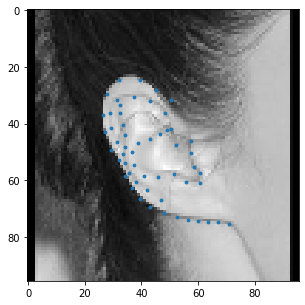

Y_tras: 771 - X_tras: 65
Id_image: 0071
csvfile: train_0071.csv


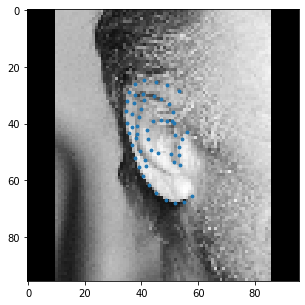

Y_tras: 290 - X_tras: 396
Id_image: 0072
csvfile: train_0072.csv


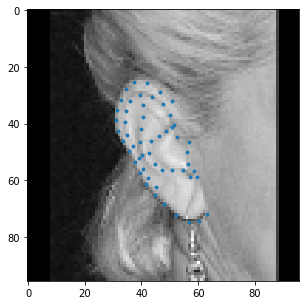

Y_tras: 340 - X_tras: 321
Id_image: 0073
csvfile: train_0073.csv


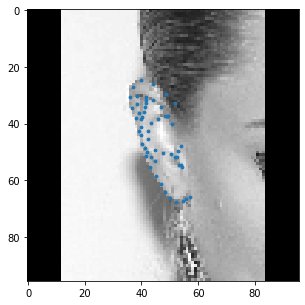

Y_tras: 872 - X_tras: 1900
Id_image: 0074
csvfile: train_0074.csv


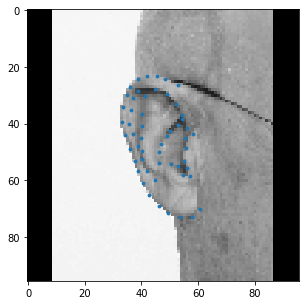

Y_tras: 269 - X_tras: 80
Id_image: 0075
csvfile: train_0075.csv


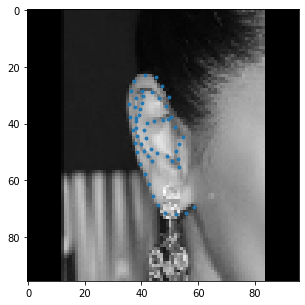

Y_tras: 446 - X_tras: 306
Id_image: 0076
csvfile: train_0076.csv


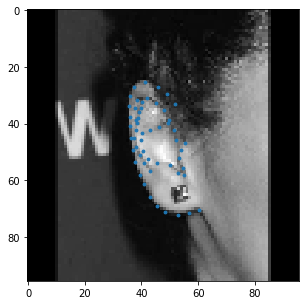

Y_tras: 520 - X_tras: 163
Id_image: 0077
csvfile: train_0077.csv


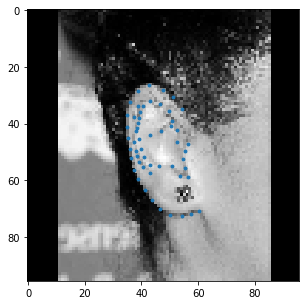

Y_tras: 122 - X_tras: 978
Id_image: 0078
csvfile: train_0078.csv


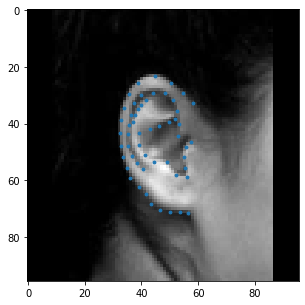

Y_tras: 228 - X_tras: 44
Id_image: 0079
csvfile: train_0079.csv


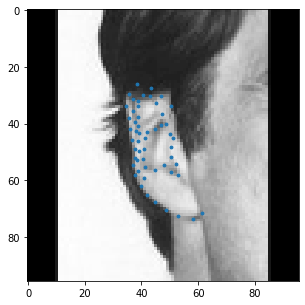

Y_tras: 70 - X_tras: 58
Id_image: 0080
csvfile: train_0080.csv


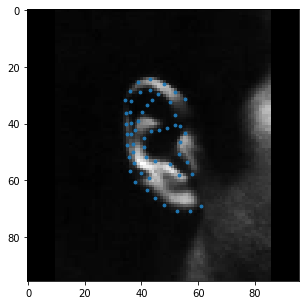

Y_tras: 282 - X_tras: 295
Id_image: 0081
csvfile: train_0081.csv


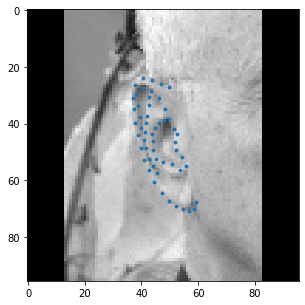

Y_tras: 129 - X_tras: 430
Id_image: 0082
csvfile: train_0082.csv


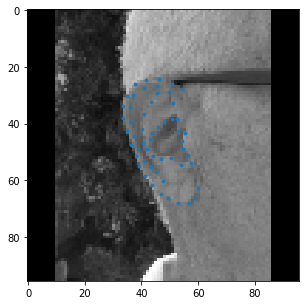

Y_tras: 653 - X_tras: 289
Id_image: 0083
csvfile: train_0083.csv


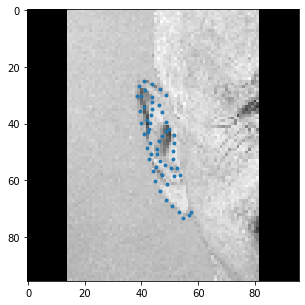

Y_tras: 234 - X_tras: 715
Id_image: 0084
csvfile: train_0084.csv


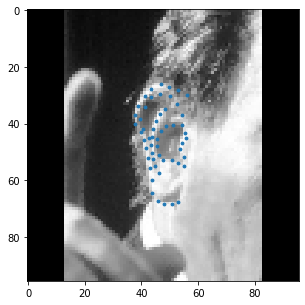

Y_tras: 678 - X_tras: 45
Id_image: 0085
csvfile: train_0085.csv


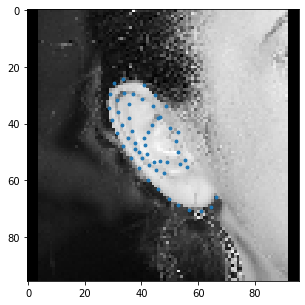

Y_tras: 199 - X_tras: 325
Id_image: 0086
csvfile: train_0086.csv


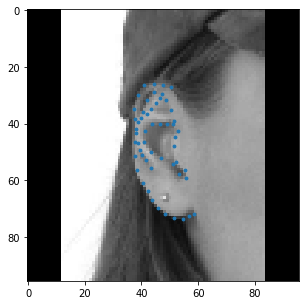

Y_tras: 0 - X_tras: 269
Id_image: 0087
file 0087 has no value translations
csvfile: train_0087.csv


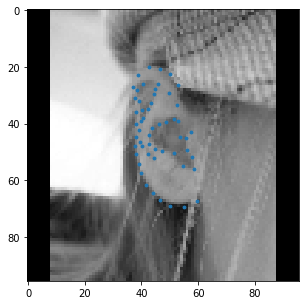

Y_tras: 167 - X_tras: 849
Id_image: 0088
csvfile: train_0088.csv


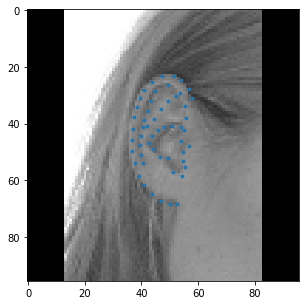

Y_tras: 88 - X_tras: 529
Id_image: 0089
csvfile: train_0089.csv


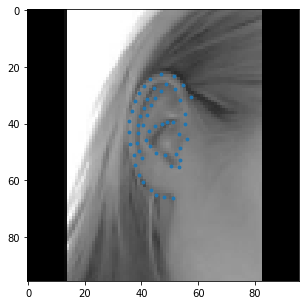

Y_tras: 329 - X_tras: 75
Id_image: 0090
csvfile: train_0090.csv


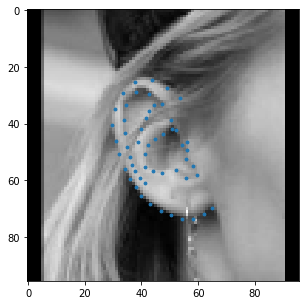

Y_tras: 195 - X_tras: 679
Id_image: 0091
csvfile: train_0091.csv


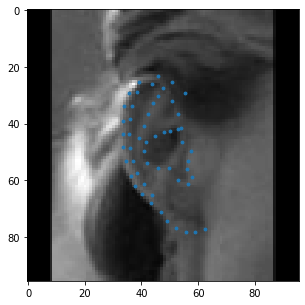

Y_tras: 186 - X_tras: 109
Id_image: 0092
csvfile: train_0092.csv


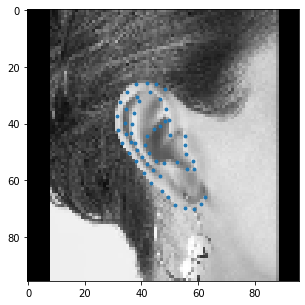

Y_tras: 321 - X_tras: 138
Id_image: 0093
csvfile: train_0093.csv


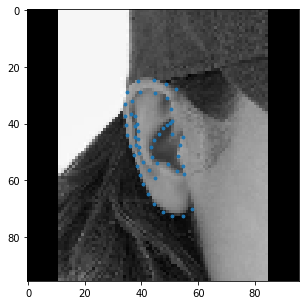

Y_tras: 154 - X_tras: 330
Id_image: 0094
csvfile: train_0094.csv


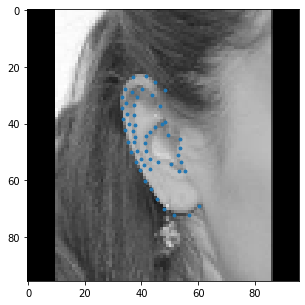

Y_tras: 357 - X_tras: 258
Id_image: 0095
csvfile: train_0095.csv


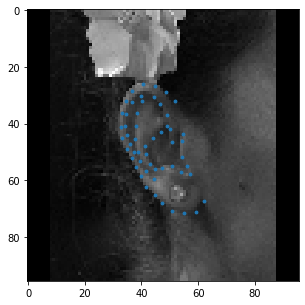

Y_tras: 218 - X_tras: 279
Id_image: 0096
csvfile: train_0096.csv


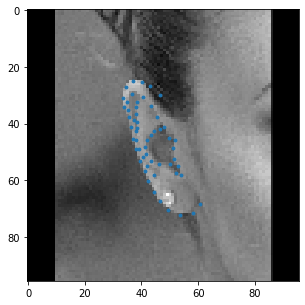

Y_tras: 0 - X_tras: 127
Id_image: 0097
file 0097 has no value translations
csvfile: train_0097.csv


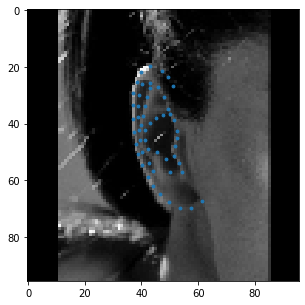

Y_tras: 447 - X_tras: 354
Id_image: 0098
csvfile: train_0098.csv


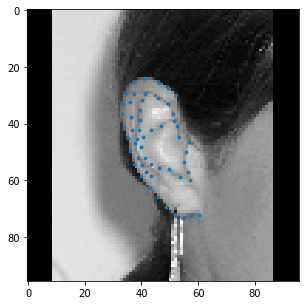

Y_tras: 588 - X_tras: 299
Id_image: 0099
csvfile: train_0099.csv


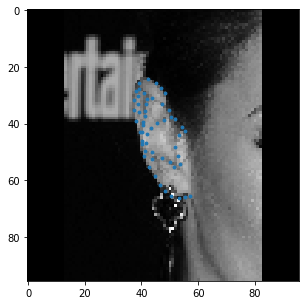

Y_tras: 136 - X_tras: 144
Id_image: 0100
csvfile: train_0100.csv


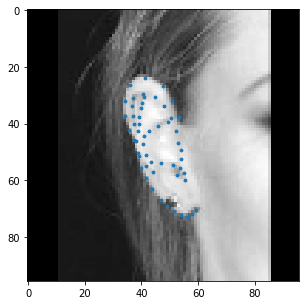

Y_tras: 329 - X_tras: 199
Id_image: 0101
csvfile: train_0101.csv


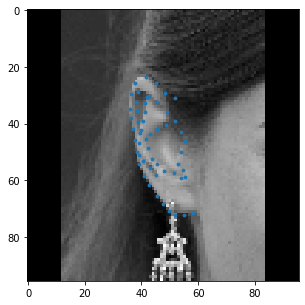

Y_tras: 0 - X_tras: 162
Id_image: 0102
file 0102 has no value translations
csvfile: train_0102.csv


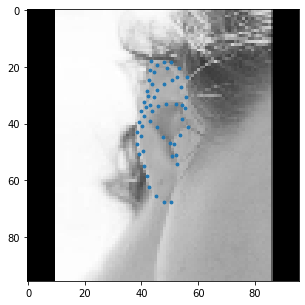

Y_tras: 823 - X_tras: 136
Id_image: 0103
csvfile: train_0103.csv


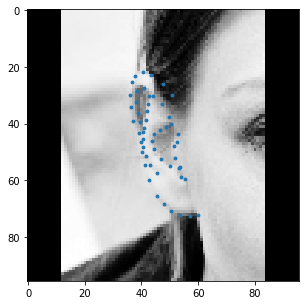

Y_tras: 514 - X_tras: 114
Id_image: 0104
csvfile: train_0104.csv


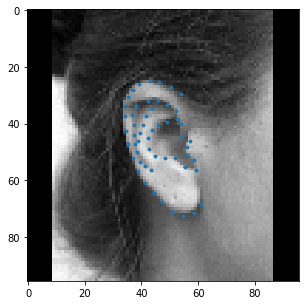

Y_tras: 611 - X_tras: 22
Id_image: 0105
csvfile: train_0105.csv


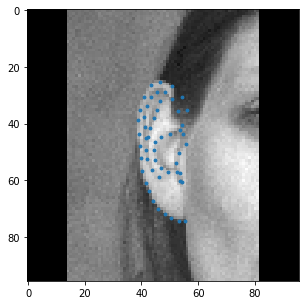

Y_tras: 0 - X_tras: 161
Id_image: 0106
file 0106 has no value translations
csvfile: train_0106.csv


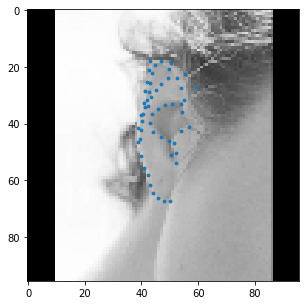

Y_tras: 151 - X_tras: 118
Id_image: 0107
csvfile: train_0107.csv


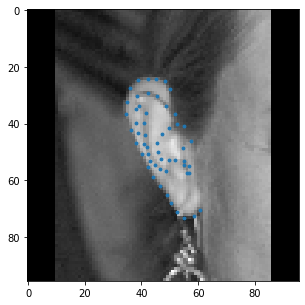

Y_tras: 380 - X_tras: 229
Id_image: 0108
csvfile: train_0108.csv


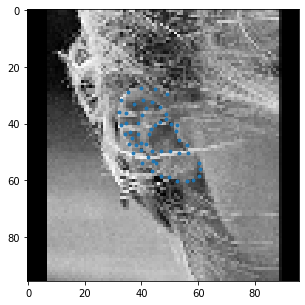

Y_tras: 325 - X_tras: 951
Id_image: 0109
csvfile: train_0109.csv


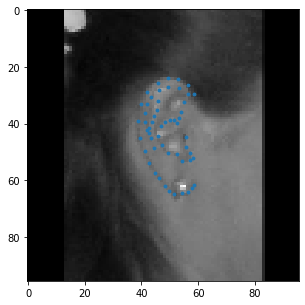

Y_tras: 887 - X_tras: 751
Id_image: 0110
csvfile: train_0110.csv


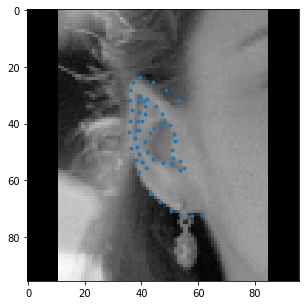

Y_tras: 162 - X_tras: 536
Id_image: 0111
csvfile: train_0111.csv


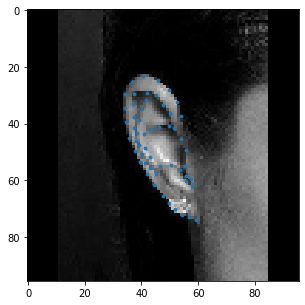

Y_tras: 352 - X_tras: 320
Id_image: 0112
csvfile: train_0112.csv


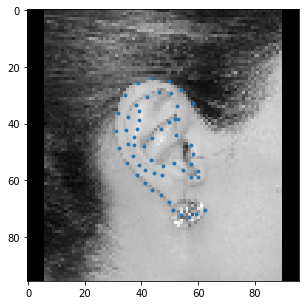

Y_tras: 289 - X_tras: 76
Id_image: 0113
csvfile: train_0113.csv


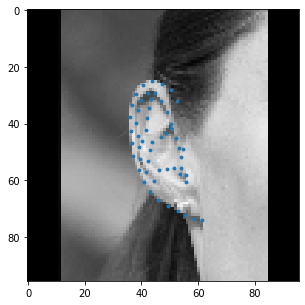

Y_tras: 344 - X_tras: 621
Id_image: 0114
csvfile: train_0114.csv


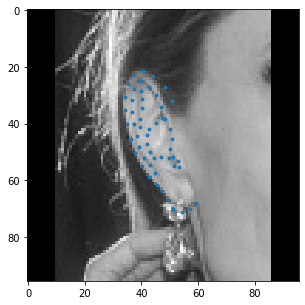

Y_tras: 305 - X_tras: 320
Id_image: 0115
csvfile: train_0115.csv


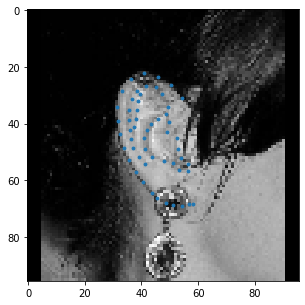

Y_tras: 260 - X_tras: 89
Id_image: 0116
csvfile: train_0116.csv


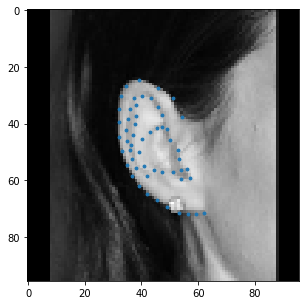

Y_tras: 355 - X_tras: 302
Id_image: 0117
csvfile: train_0117.csv


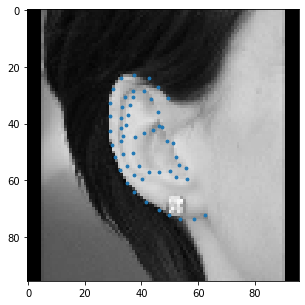

Y_tras: 550 - X_tras: 18
Id_image: 0118
csvfile: train_0118.csv


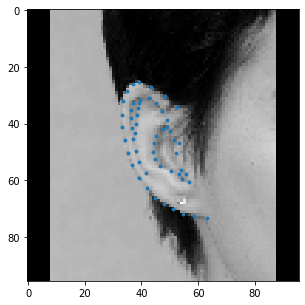

Y_tras: 203 - X_tras: 433
Id_image: 0119
csvfile: train_0119.csv


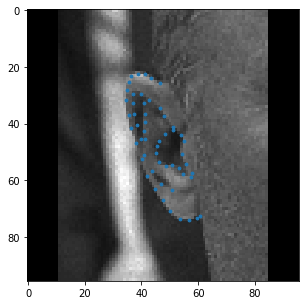

Y_tras: 632 - X_tras: 184
Id_image: 0120
csvfile: train_0120.csv


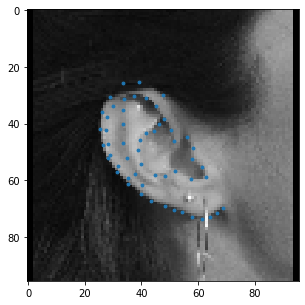

Y_tras: 152 - X_tras: 194
Id_image: 0121
csvfile: train_0121.csv


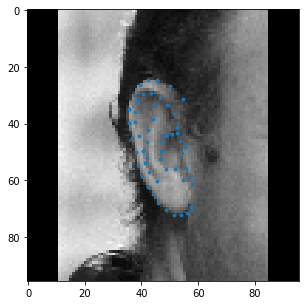

Y_tras: 763 - X_tras: 411
Id_image: 0122
csvfile: train_0122.csv


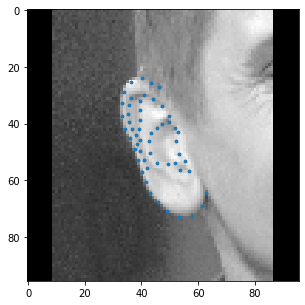

Y_tras: 1011 - X_tras: 979
Id_image: 0123
csvfile: train_0123.csv


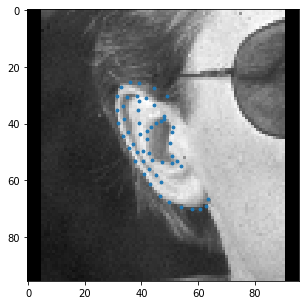

Y_tras: 555 - X_tras: 1215
Id_image: 0124
csvfile: train_0124.csv


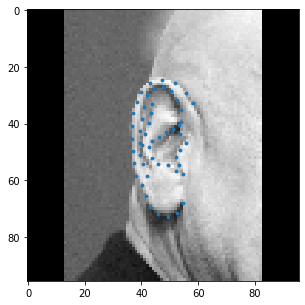

Y_tras: 488 - X_tras: 0
Id_image: 0125
file 0125 has no value translations
csvfile: train_0125.csv


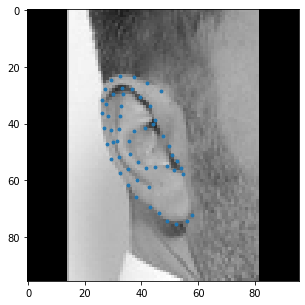

Y_tras: 428 - X_tras: 390
Id_image: 0126
csvfile: train_0126.csv


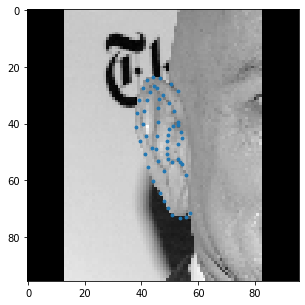

Y_tras: 470 - X_tras: 0
Id_image: 0127
file 0127 has no value translations
csvfile: train_0127.csv


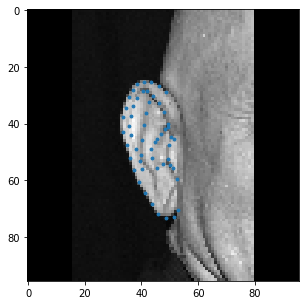

Y_tras: 18 - X_tras: 449
Id_image: 0128
csvfile: train_0128.csv


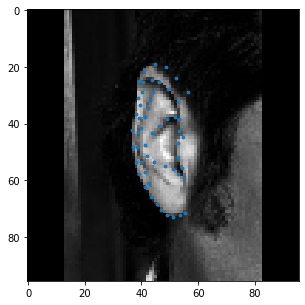

Y_tras: 126 - X_tras: 262
Id_image: 0129
csvfile: train_0129.csv


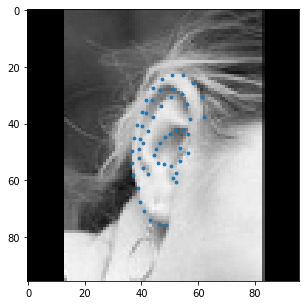

Y_tras: 186 - X_tras: 186
Id_image: 0130
csvfile: train_0130.csv


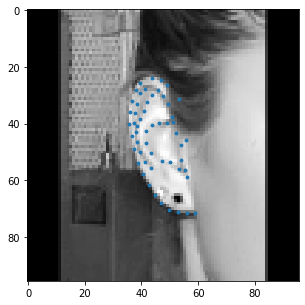

Y_tras: 258 - X_tras: 212
Id_image: 0131
csvfile: train_0131.csv


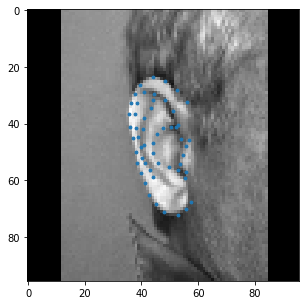

Y_tras: 268 - X_tras: 118
Id_image: 0132
csvfile: train_0132.csv


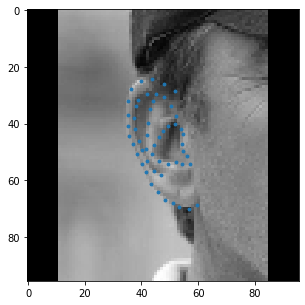

Y_tras: 421 - X_tras: 0
Id_image: 0133
file 0133 has no value translations
csvfile: train_0133.csv


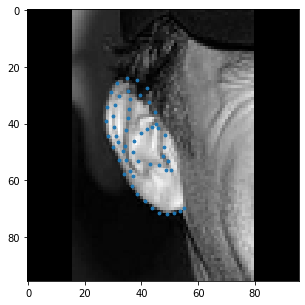

Y_tras: 526 - X_tras: 75
Id_image: 0134
csvfile: train_0134.csv


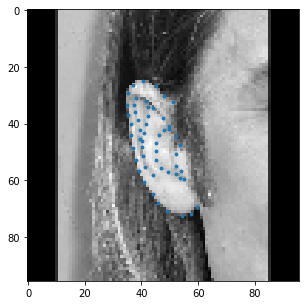

Y_tras: 298 - X_tras: 30
Id_image: 0135
csvfile: train_0135.csv


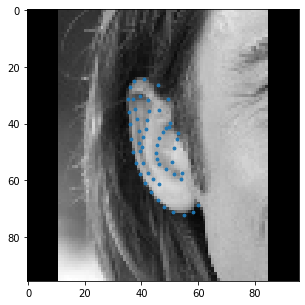

Y_tras: 565 - X_tras: 68
Id_image: 0136
csvfile: train_0136.csv


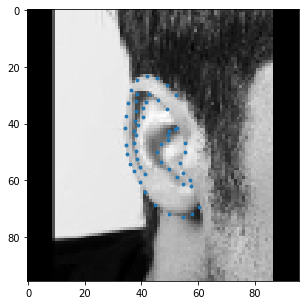

Y_tras: 657 - X_tras: 818
Id_image: 0137
csvfile: train_0137.csv


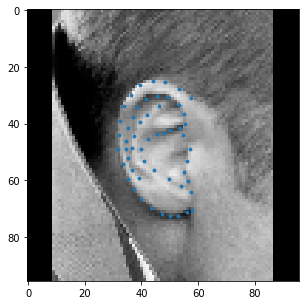

Y_tras: 170 - X_tras: 266
Id_image: 0138
csvfile: train_0138.csv


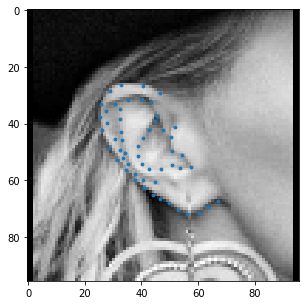

Y_tras: 225 - X_tras: 479
Id_image: 0139
csvfile: train_0139.csv


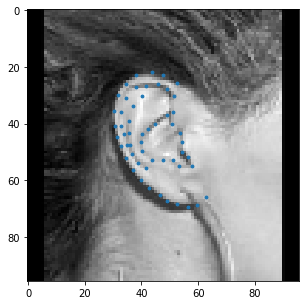

Y_tras: 256 - X_tras: 325
Id_image: 0140
csvfile: train_0140.csv


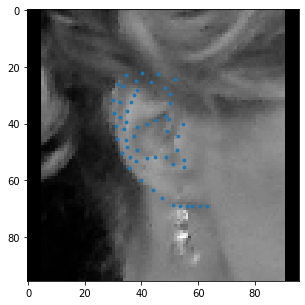

Y_tras: 0 - X_tras: 0
Id_image: 0141
file 0141 has no value translations
csvfile: train_0141.csv


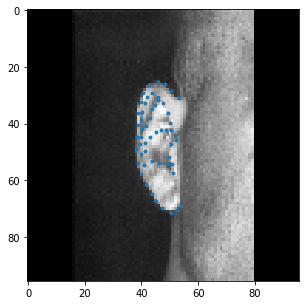

Y_tras: 650 - X_tras: 1086
Id_image: 0142
csvfile: train_0142.csv


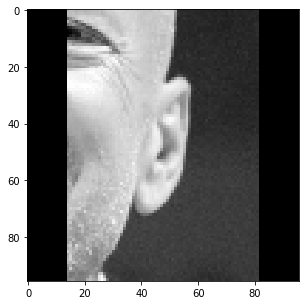

Y_tras: 82 - X_tras: 297
Id_image: 0143
csvfile: train_0143.csv


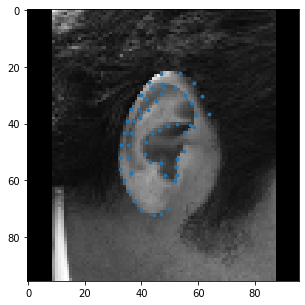

Y_tras: 627 - X_tras: 278
Id_image: 0144
csvfile: train_0144.csv


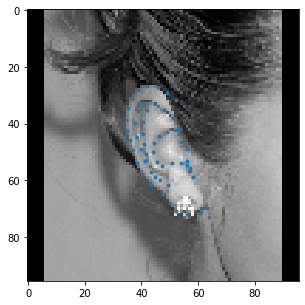

Y_tras: 298 - X_tras: 757
Id_image: 0145
csvfile: train_0145.csv


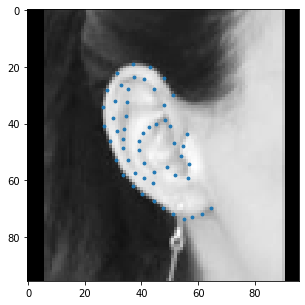

Y_tras: 294 - X_tras: 334
Id_image: 0146
csvfile: train_0146.csv


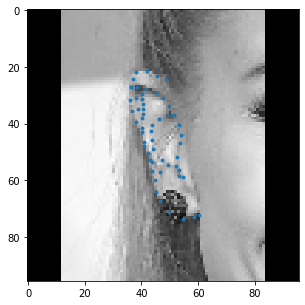

Y_tras: 583 - X_tras: 457
Id_image: 0147
csvfile: train_0147.csv


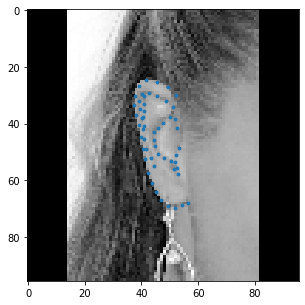

Y_tras: 572 - X_tras: 325
Id_image: 0148
csvfile: train_0148.csv


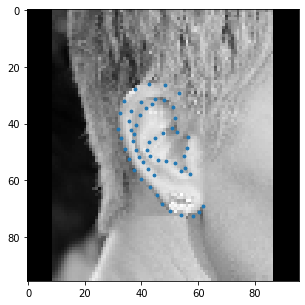

Y_tras: 455 - X_tras: 0
Id_image: 0149
file 0149 has no value translations
csvfile: train_0149.csv


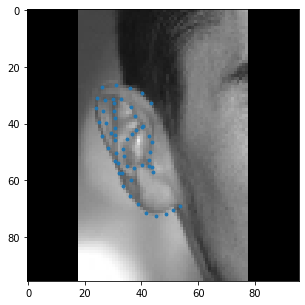

Y_tras: 168 - X_tras: 241
Id_image: 0150
csvfile: train_0150.csv


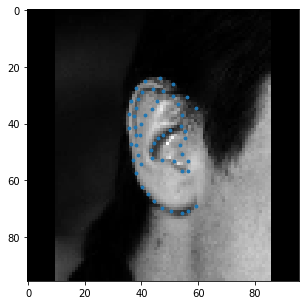

Y_tras: 580 - X_tras: 558
Id_image: 0151
csvfile: train_0151.csv


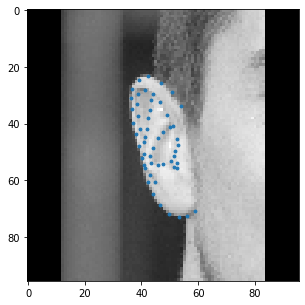

Y_tras: 974 - X_tras: 0
Id_image: 0152
file 0152 has no value translations
csvfile: train_0152.csv


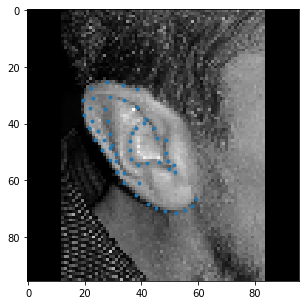

Y_tras: 311 - X_tras: 93
Id_image: 0153
csvfile: train_0153.csv


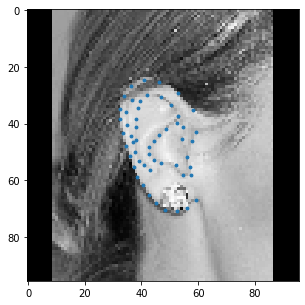

Y_tras: 169 - X_tras: 235
Id_image: 0154
csvfile: train_0154.csv


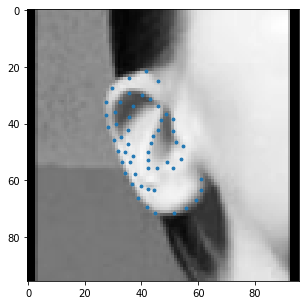

Y_tras: 377 - X_tras: 276
Id_image: 0155
csvfile: train_0155.csv


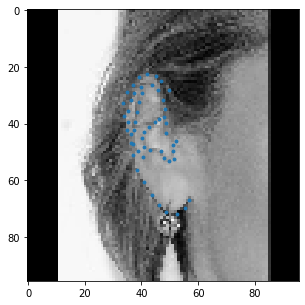

Y_tras: 168 - X_tras: 241
Id_image: 0156
csvfile: train_0156.csv


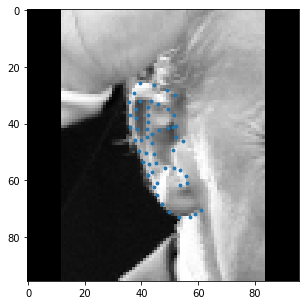

Y_tras: 457 - X_tras: 0
Id_image: 0157
file 0157 has no value translations
csvfile: train_0157.csv


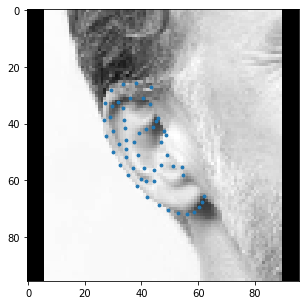

Y_tras: 340 - X_tras: 31
Id_image: 0158
csvfile: train_0158.csv


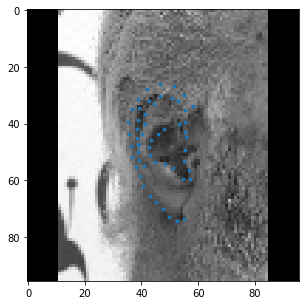

Y_tras: 446 - X_tras: 176
Id_image: 0159
csvfile: train_0159.csv


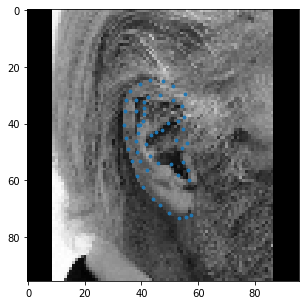

Y_tras: 231 - X_tras: 91
Id_image: 0160
csvfile: train_0160.csv


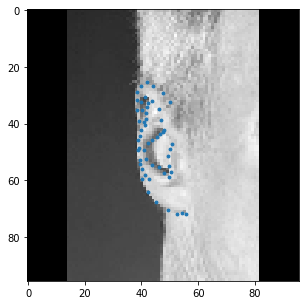

Y_tras: 387 - X_tras: 164
Id_image: 0161
csvfile: train_0161.csv


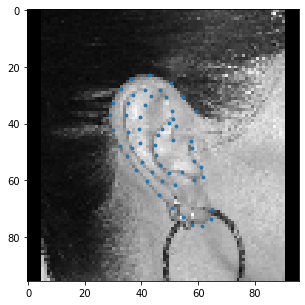

Y_tras: 117 - X_tras: 693
Id_image: 0162
csvfile: train_0162.csv


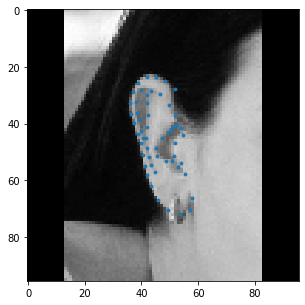

Y_tras: 331 - X_tras: 1254
Id_image: 0163
csvfile: train_0163.csv


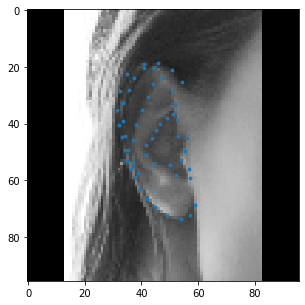

Y_tras: 478 - X_tras: 0
Id_image: 0164
file 0164 has no value translations
csvfile: train_0164.csv


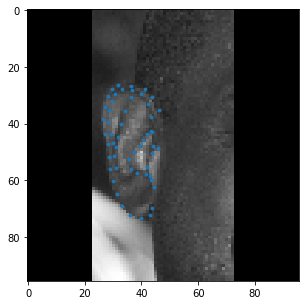

Y_tras: 180 - X_tras: 179
Id_image: 0165
csvfile: train_0165.csv


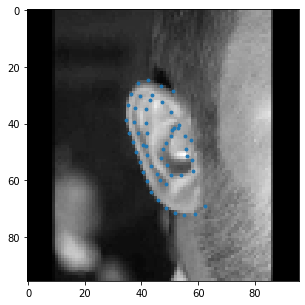

Y_tras: 245 - X_tras: 200
Id_image: 0166
csvfile: train_0166.csv


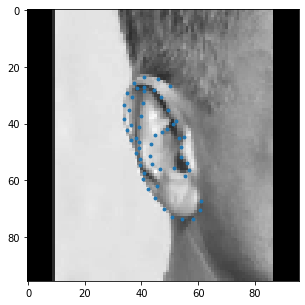

Y_tras: 107 - X_tras: 58
Id_image: 0167
csvfile: train_0167.csv


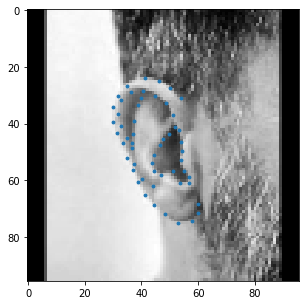

Y_tras: 357 - X_tras: 199
Id_image: 0168
csvfile: train_0168.csv


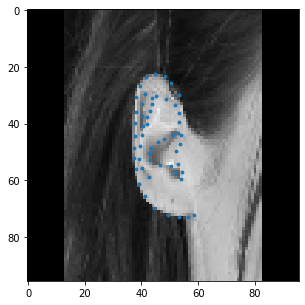

Y_tras: 160 - X_tras: 0
Id_image: 0169
file 0169 has no value translations
csvfile: train_0169.csv


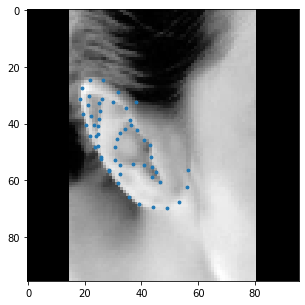

Y_tras: 541 - X_tras: 281
Id_image: 0171
csvfile: train_0171.csv


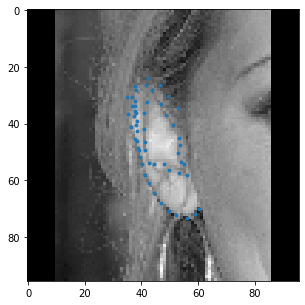

Y_tras: 115 - X_tras: 0
Id_image: 0172
file 0172 has no value translations
csvfile: train_0172.csv


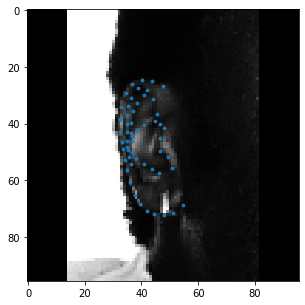

Y_tras: 67 - X_tras: 428
Id_image: 0173
csvfile: train_0173.csv


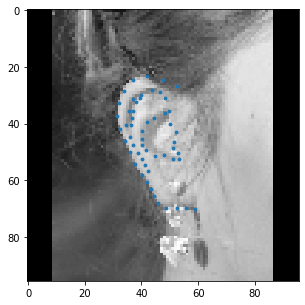

Y_tras: 382 - X_tras: 199
Id_image: 0174
csvfile: train_0174.csv


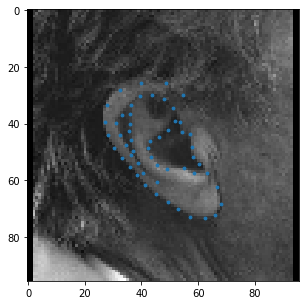

Y_tras: 223 - X_tras: 220
Id_image: 0175
csvfile: train_0175.csv


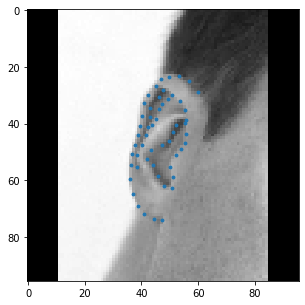

Y_tras: 422 - X_tras: 616
Id_image: 0176
csvfile: train_0176.csv


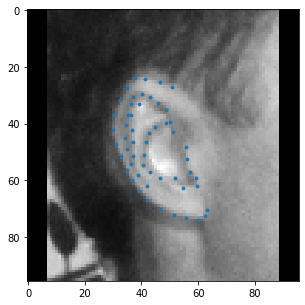

Y_tras: 213 - X_tras: 0
Id_image: 0177
file 0177 has no value translations
csvfile: train_0177.csv


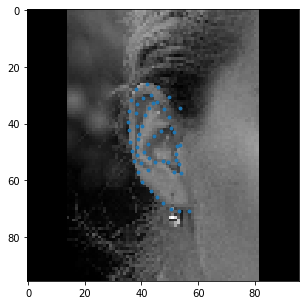

Y_tras: 251 - X_tras: 162
Id_image: 0178
csvfile: train_0178.csv


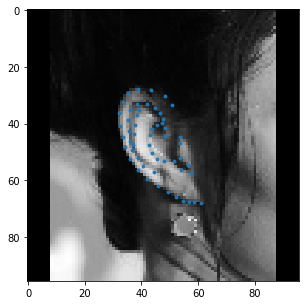

Y_tras: 368 - X_tras: 160
Id_image: 0179
csvfile: train_0179.csv


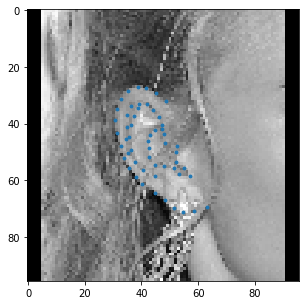

Y_tras: 170 - X_tras: 238
Id_image: 0180
csvfile: train_0180.csv


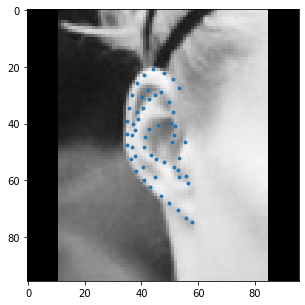

Y_tras: 291 - X_tras: 299
Id_image: 0181
csvfile: train_0181.csv


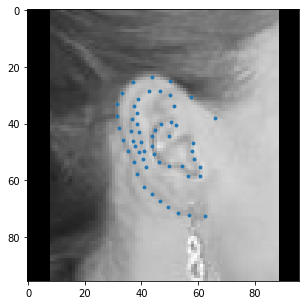

Y_tras: 572 - X_tras: 264
Id_image: 0182
csvfile: train_0182.csv


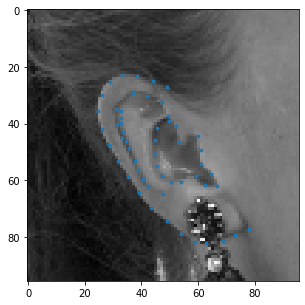

Y_tras: 546 - X_tras: 602
Id_image: 0183
csvfile: train_0183.csv


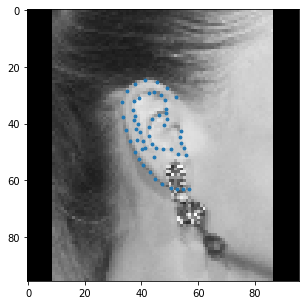

Y_tras: 388 - X_tras: 163
Id_image: 0184
csvfile: train_0184.csv


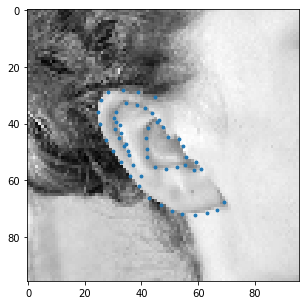

Y_tras: 373 - X_tras: 0
Id_image: 0185
file 0185 has no value translations
csvfile: train_0185.csv


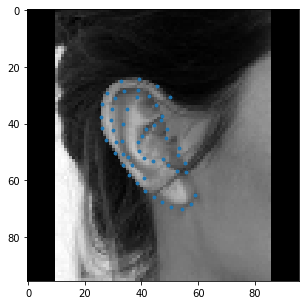

Y_tras: 784 - X_tras: 572
Id_image: 0186
csvfile: train_0186.csv


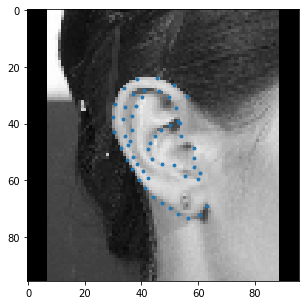

Y_tras: 608 - X_tras: 372
Id_image: 0187
csvfile: train_0187.csv


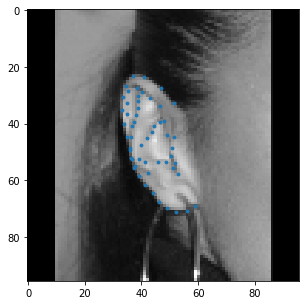

Y_tras: 425 - X_tras: 136
Id_image: 0188
csvfile: train_0188.csv


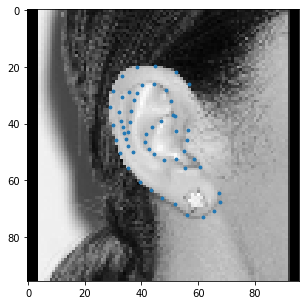

Y_tras: 301 - X_tras: 173
Id_image: 0189
csvfile: train_0189.csv


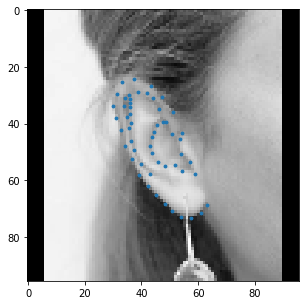

Y_tras: 118 - X_tras: 306
Id_image: 0190
csvfile: train_0190.csv


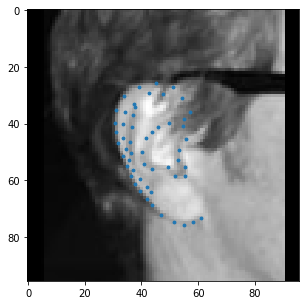

Y_tras: 275 - X_tras: 79
Id_image: 0191
csvfile: train_0191.csv


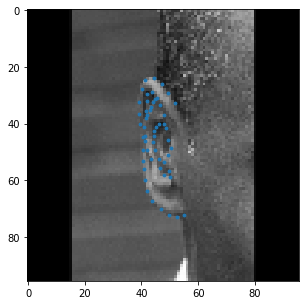

Y_tras: 370 - X_tras: 943
Id_image: 0192
csvfile: train_0192.csv


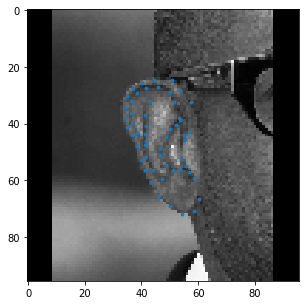

Y_tras: 265 - X_tras: 223
Id_image: 0193
csvfile: train_0193.csv


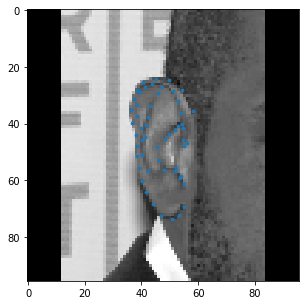

Y_tras: 173 - X_tras: 95
Id_image: 0194
csvfile: train_0194.csv


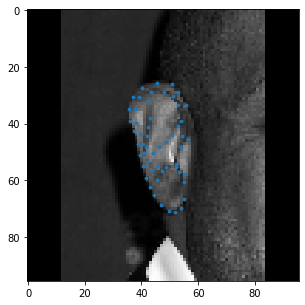

Y_tras: 354 - X_tras: 311
Id_image: 0195
csvfile: train_0195.csv


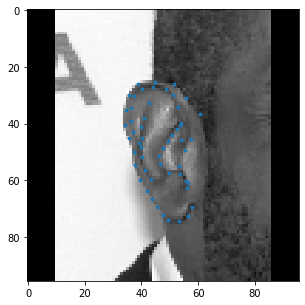

Y_tras: 302 - X_tras: 592
Id_image: 0196
csvfile: train_0196.csv


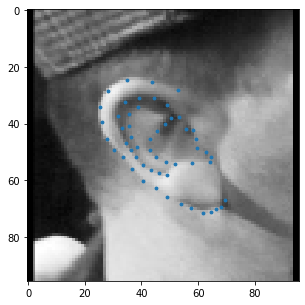

Y_tras: 240 - X_tras: 302
Id_image: 0197
csvfile: train_0197.csv


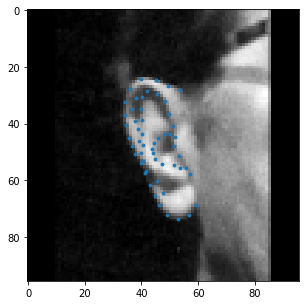

Y_tras: 751 - X_tras: 216
Id_image: 0198
csvfile: train_0198.csv


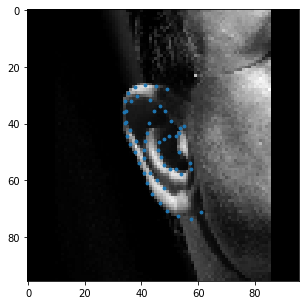

Y_tras: 231 - X_tras: 0
Id_image: 0199
file 0199 has no value translations
csvfile: train_0199.csv


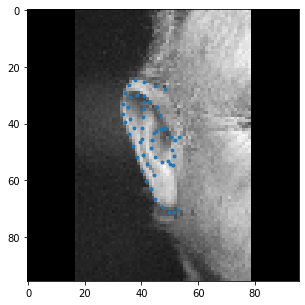

Y_tras: 57 - X_tras: 11
Id_image: 0200
csvfile: train_0200.csv


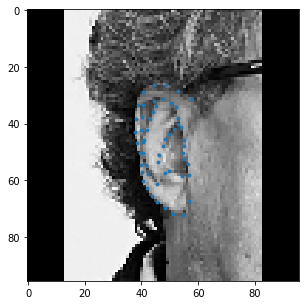

Y_tras: 658 - X_tras: 371
Id_image: 0201
csvfile: train_0201.csv


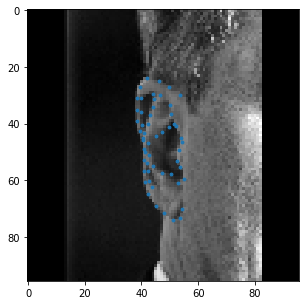

Y_tras: 134 - X_tras: 159
Id_image: 0202
csvfile: train_0202.csv


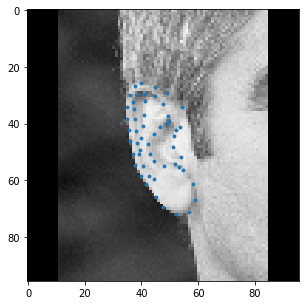

Y_tras: 441 - X_tras: 0
Id_image: 0203
file 0203 has no value translations
csvfile: train_0203.csv


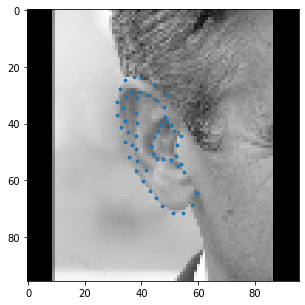

Y_tras: 163 - X_tras: 255
Id_image: 0204
csvfile: train_0204.csv


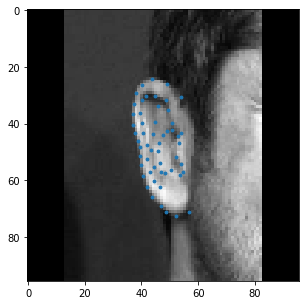

Y_tras: 667 - X_tras: 192
Id_image: 0205
csvfile: train_0205.csv


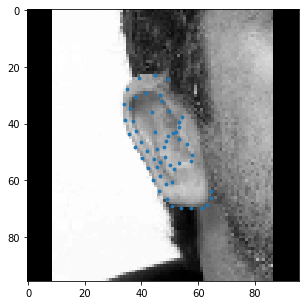

Y_tras: 30 - X_tras: 119
Id_image: 0206
csvfile: train_0206.csv


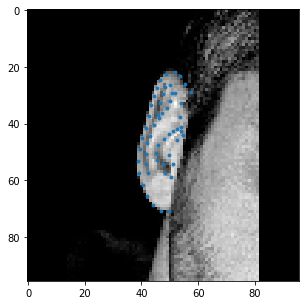

Y_tras: 231 - X_tras: 304
Id_image: 0207
csvfile: train_0207.csv


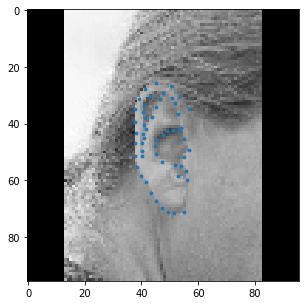

Y_tras: 405 - X_tras: 88
Id_image: 0208
csvfile: train_0208.csv


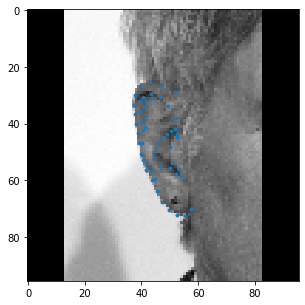

Y_tras: 246 - X_tras: 90
Id_image: 0209
csvfile: train_0209.csv


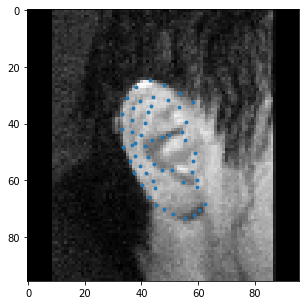

Y_tras: 58 - X_tras: 282
Id_image: 0210
csvfile: train_0210.csv


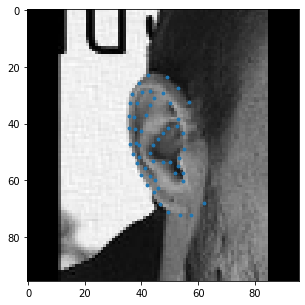

Y_tras: 135 - X_tras: 145
Id_image: 0211
csvfile: train_0211.csv


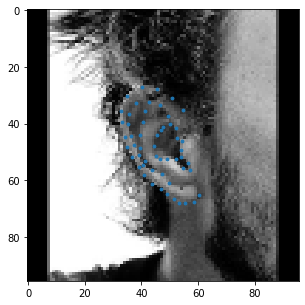

Y_tras: 115 - X_tras: 266
Id_image: 0212
csvfile: train_0212.csv


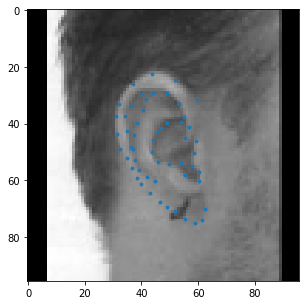

Y_tras: 493 - X_tras: 230
Id_image: 0213
csvfile: train_0213.csv


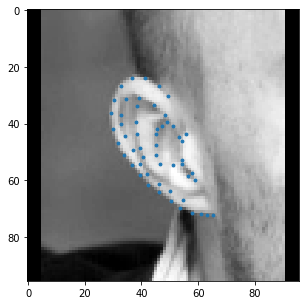

Y_tras: 508 - X_tras: 136
Id_image: 0214
csvfile: train_0214.csv


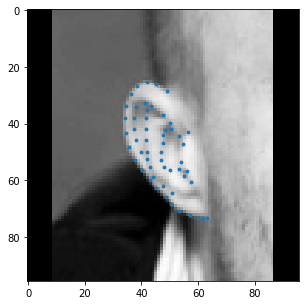

Y_tras: 428 - X_tras: 1032
Id_image: 0215
csvfile: train_0215.csv


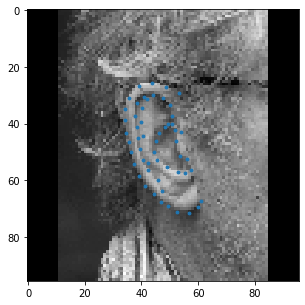

Y_tras: 447 - X_tras: 291
Id_image: 0216
csvfile: train_0216.csv


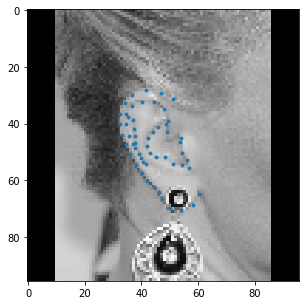

Y_tras: 582 - X_tras: 904
Id_image: 0217
csvfile: train_0217.csv


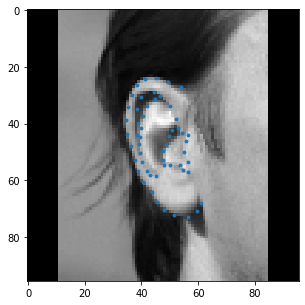

Y_tras: 475 - X_tras: 297
Id_image: 0218
csvfile: train_0218.csv


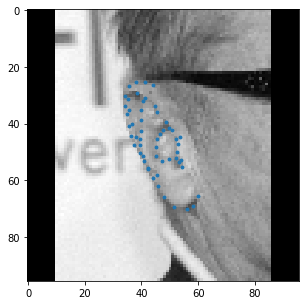

Y_tras: 170 - X_tras: 434
Id_image: 0219
csvfile: train_0219.csv


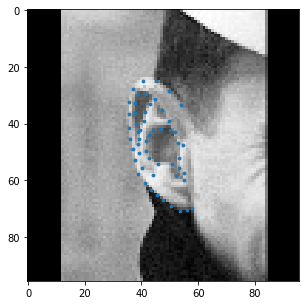

Y_tras: 213 - X_tras: 91
Id_image: 0220
csvfile: train_0220.csv


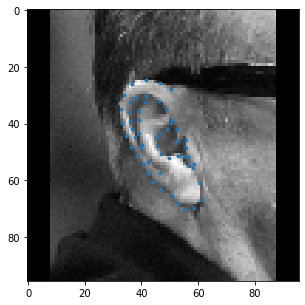

Y_tras: 498 - X_tras: 358
Id_image: 0221
csvfile: train_0221.csv


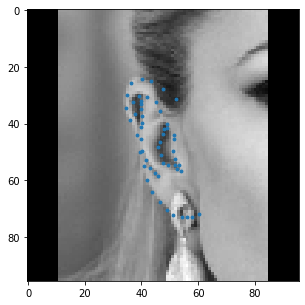

Y_tras: 488 - X_tras: 620
Id_image: 0222
csvfile: train_0222.csv


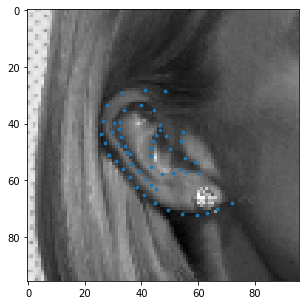

Y_tras: 673 - X_tras: 0
Id_image: 0223
file 0223 has no value translations
csvfile: train_0223.csv


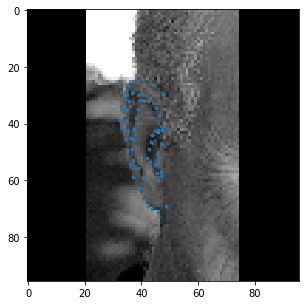

Y_tras: 602 - X_tras: 240
Id_image: 0224
csvfile: train_0224.csv


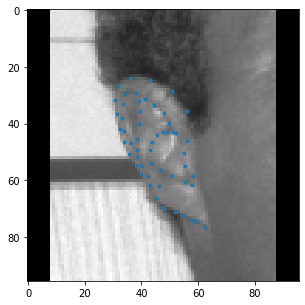

Y_tras: 323 - X_tras: 774
Id_image: 0225
csvfile: train_0225.csv


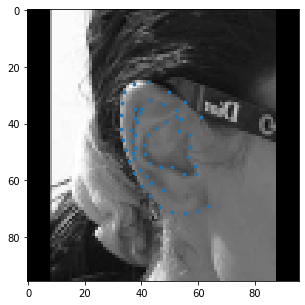

Y_tras: 462 - X_tras: 178
Id_image: 0226
csvfile: train_0226.csv


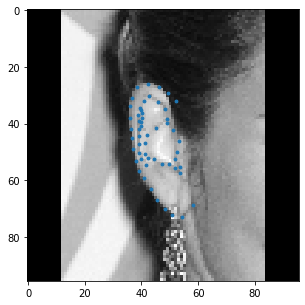

Y_tras: 324 - X_tras: 366
Id_image: 0227
csvfile: train_0227.csv


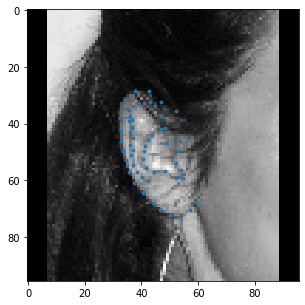

Y_tras: 161 - X_tras: 319
Id_image: 0228
csvfile: train_0228.csv


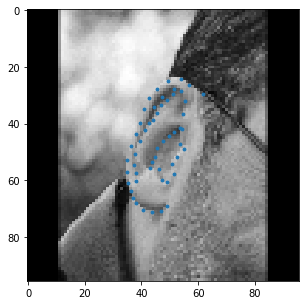

Y_tras: 225 - X_tras: 94
Id_image: 0229
csvfile: train_0229.csv


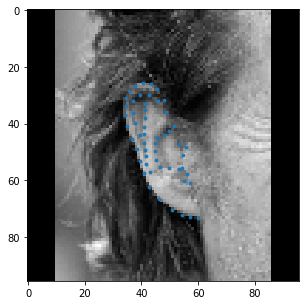

Y_tras: 317 - X_tras: 537
Id_image: 0230
csvfile: train_0230.csv


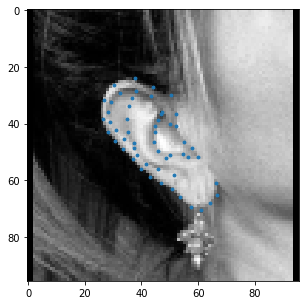

Y_tras: 880 - X_tras: 0
Id_image: 0231
file 0231 has no value translations
csvfile: train_0231.csv


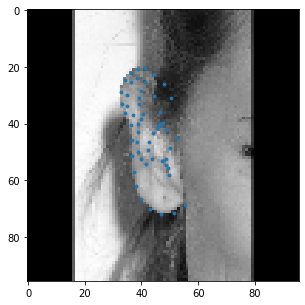

Y_tras: 539 - X_tras: 403
Id_image: 0232
csvfile: train_0232.csv


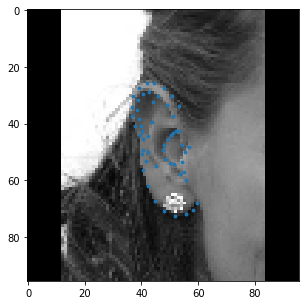

Y_tras: 325 - X_tras: 113
Id_image: 0233
csvfile: train_0233.csv


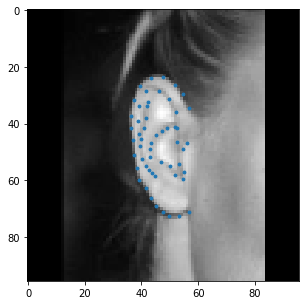

Y_tras: 263 - X_tras: 359
Id_image: 0234
csvfile: train_0234.csv


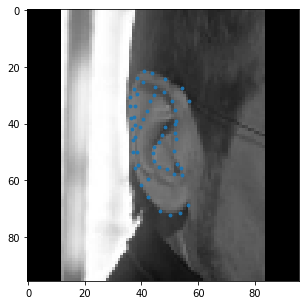

Y_tras: 525 - X_tras: 158
Id_image: 0235
csvfile: train_0235.csv


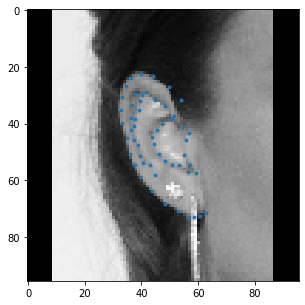

Y_tras: 370 - X_tras: 508
Id_image: 0236
csvfile: train_0236.csv


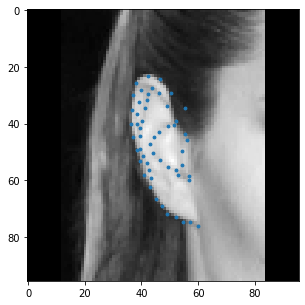

Y_tras: 806 - X_tras: 109
Id_image: 0237
csvfile: train_0237.csv


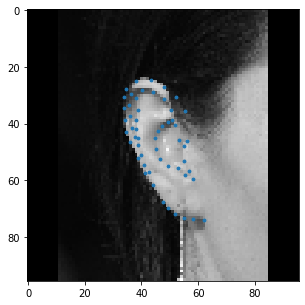

Y_tras: 524 - X_tras: 161
Id_image: 0238
csvfile: train_0238.csv


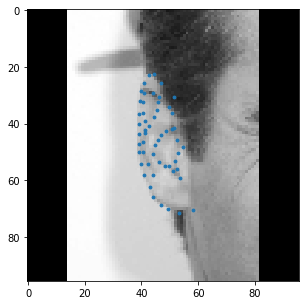

Y_tras: 278 - X_tras: 399
Id_image: 0239
csvfile: train_0239.csv


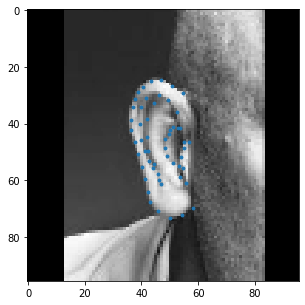

Y_tras: 342 - X_tras: 0
Id_image: 0240
file 0240 has no value translations
csvfile: train_0240.csv


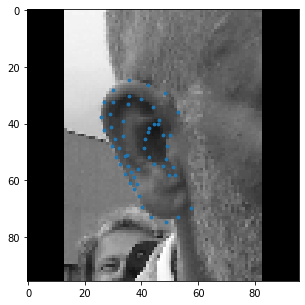

Y_tras: 212 - X_tras: 219
Id_image: 0241
csvfile: train_0241.csv


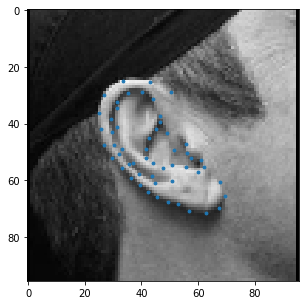

Y_tras: 224 - X_tras: 586
Id_image: 0242
csvfile: train_0242.csv


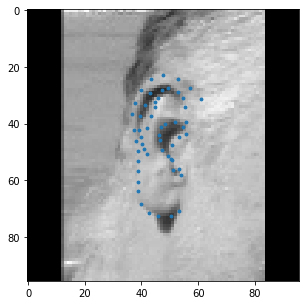

Y_tras: 346 - X_tras: 50
Id_image: 0243
csvfile: train_0243.csv


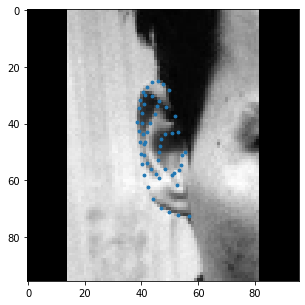

Y_tras: 277 - X_tras: 74
Id_image: 0244
csvfile: train_0244.csv


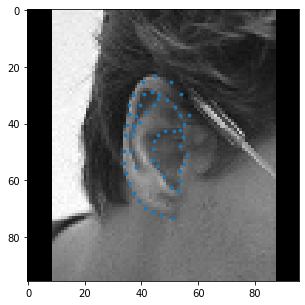

Y_tras: 308 - X_tras: 439
Id_image: 0245
csvfile: train_0245.csv


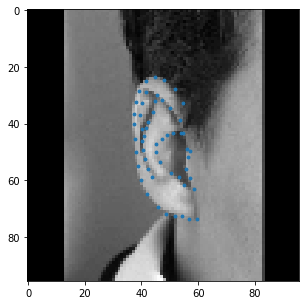

Y_tras: 146 - X_tras: 340
Id_image: 0246
csvfile: train_0246.csv


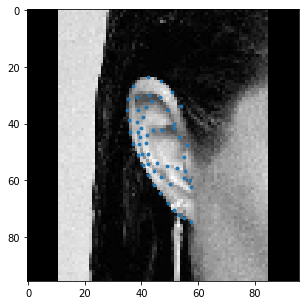

Y_tras: 195 - X_tras: 438
Id_image: 0247
csvfile: train_0247.csv


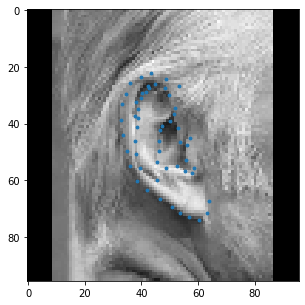

Y_tras: 200 - X_tras: 162
Id_image: 0248
csvfile: train_0248.csv


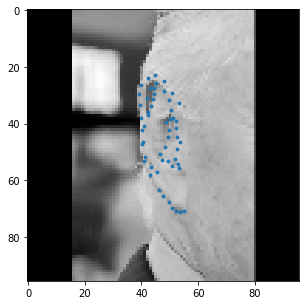

Y_tras: 4 - X_tras: 0
Id_image: 0249
file 0249 has no value translations
csvfile: train_0249.csv


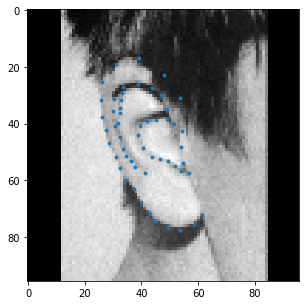

Y_tras: 169 - X_tras: 230
Id_image: 0250
csvfile: train_0250.csv


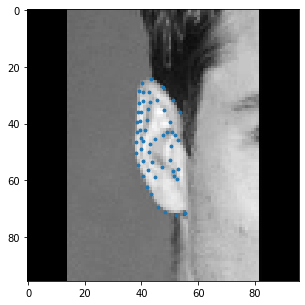

Y_tras: 162 - X_tras: 391
Id_image: 0251
csvfile: train_0251.csv


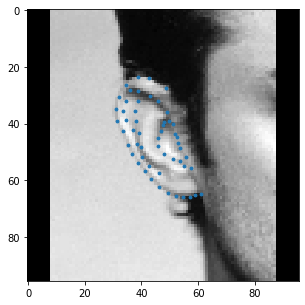

Y_tras: 311 - X_tras: 123
Id_image: 0252
csvfile: train_0252.csv


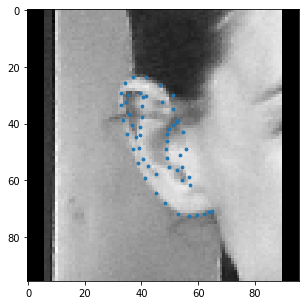

Y_tras: 192 - X_tras: 322
Id_image: 0253
csvfile: train_0253.csv


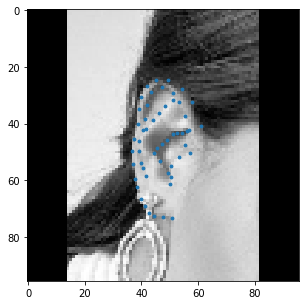

Y_tras: 308 - X_tras: 234
Id_image: 0254
csvfile: train_0254.csv


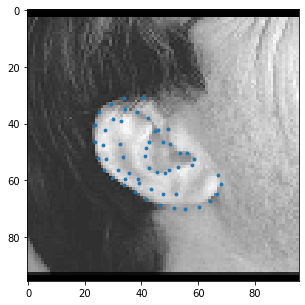

Y_tras: 186 - X_tras: 182
Id_image: 0255
csvfile: train_0255.csv


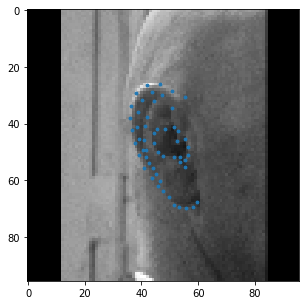

Y_tras: 372 - X_tras: 157
Id_image: 0256
csvfile: train_0256.csv


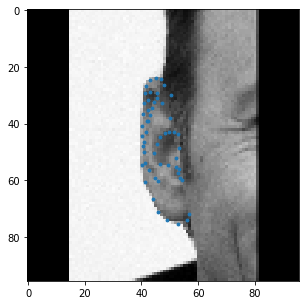

Y_tras: 329 - X_tras: 351
Id_image: 0257
csvfile: train_0257.csv


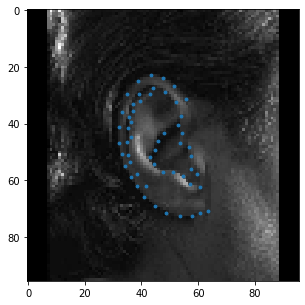

Y_tras: 91 - X_tras: 544
Id_image: 0258
csvfile: train_0258.csv


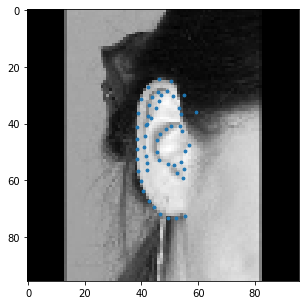

Y_tras: 308 - X_tras: 87
Id_image: 0259
csvfile: train_0259.csv


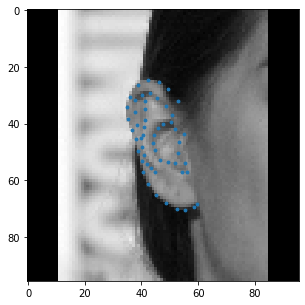

Y_tras: 344 - X_tras: 239
Id_image: 0260
csvfile: train_0260.csv


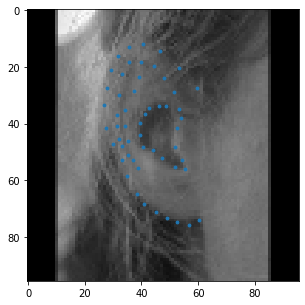

Y_tras: 20 - X_tras: 684
Id_image: 0261
csvfile: train_0261.csv


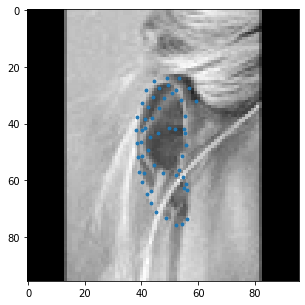

Y_tras: 356 - X_tras: 50
Id_image: 0262
csvfile: train_0262.csv


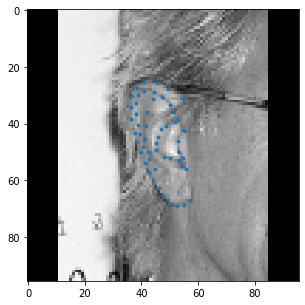

Y_tras: 70 - X_tras: 51
Id_image: 0263
csvfile: train_0263.csv


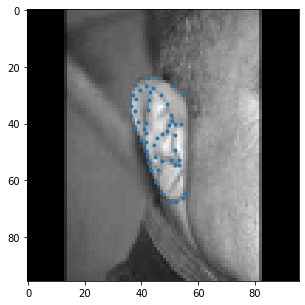

Y_tras: 274 - X_tras: 55
Id_image: 0264
csvfile: train_0264.csv


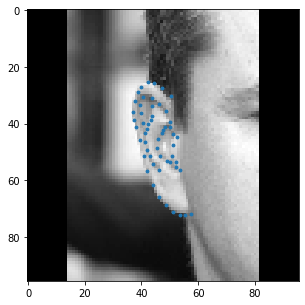

Y_tras: 282 - X_tras: 410
Id_image: 0265
csvfile: train_0265.csv


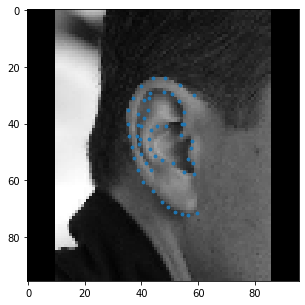

Y_tras: 114 - X_tras: 28
Id_image: 0266
csvfile: train_0266.csv


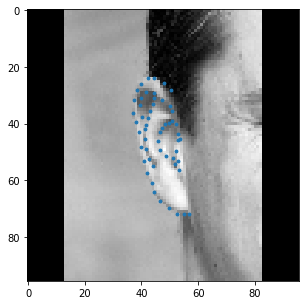

Y_tras: 195 - X_tras: 121
Id_image: 0267
csvfile: train_0267.csv


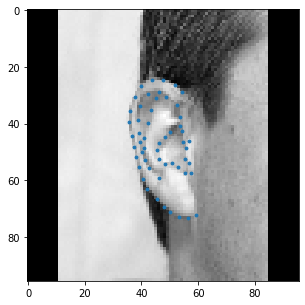

Y_tras: 176 - X_tras: 70
Id_image: 0268
csvfile: train_0268.csv


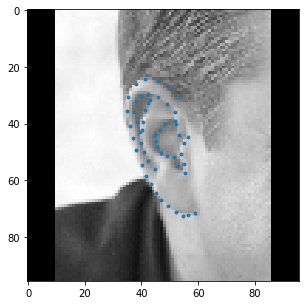

Y_tras: 321 - X_tras: 357
Id_image: 0269
csvfile: train_0269.csv


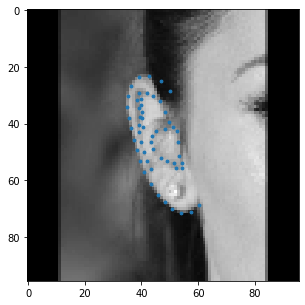

Y_tras: 148 - X_tras: 105
Id_image: 0270
csvfile: train_0270.csv


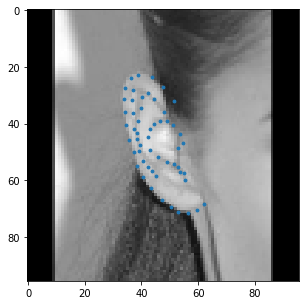

Y_tras: 295 - X_tras: 34
Id_image: 0271
csvfile: train_0271.csv


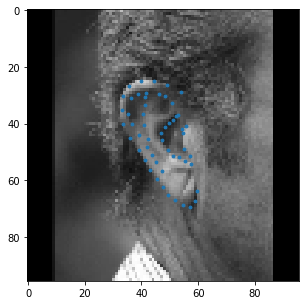

Y_tras: 165 - X_tras: 60
Id_image: 0272
csvfile: train_0272.csv


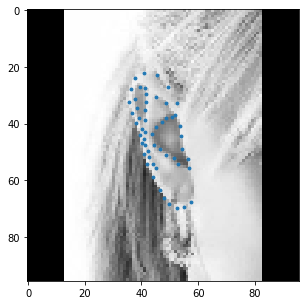

Y_tras: 139 - X_tras: 88
Id_image: 0273
csvfile: train_0273.csv


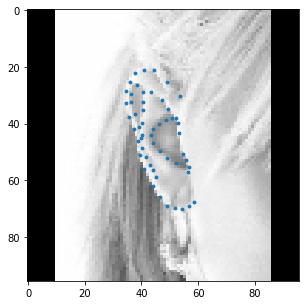

Y_tras: 196 - X_tras: 45
Id_image: 0274
csvfile: train_0274.csv


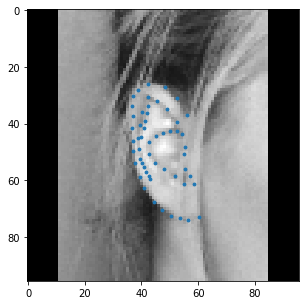

Y_tras: 155 - X_tras: 361
Id_image: 0275
csvfile: train_0275.csv


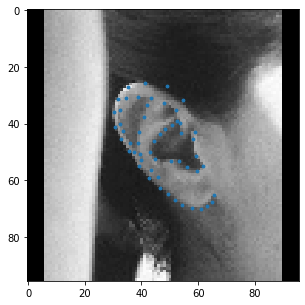

Y_tras: 118 - X_tras: 164
Id_image: 0276
csvfile: train_0276.csv


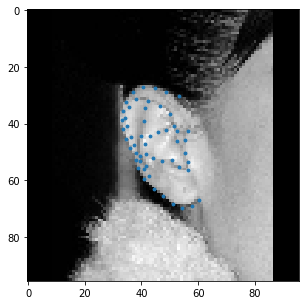

Y_tras: 231 - X_tras: 193
Id_image: 0277
csvfile: train_0277.csv


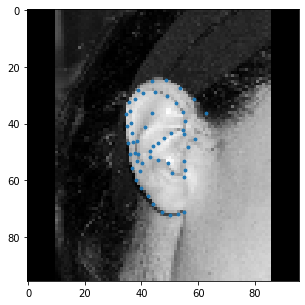

Y_tras: 436 - X_tras: 28
Id_image: 0278
csvfile: train_0278.csv


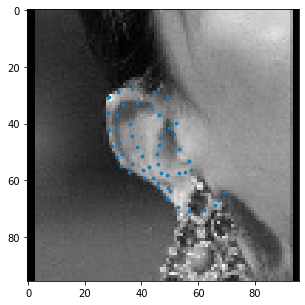

Y_tras: 922 - X_tras: 149
Id_image: 0279
csvfile: train_0279.csv


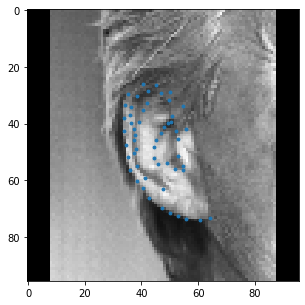

Y_tras: 1187 - X_tras: 42
Id_image: 0280
csvfile: train_0280.csv


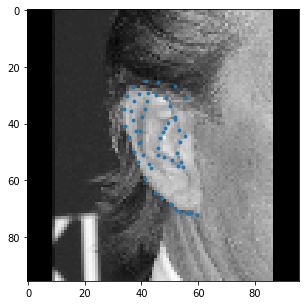

Y_tras: 1089 - X_tras: 34
Id_image: 0281
csvfile: train_0281.csv


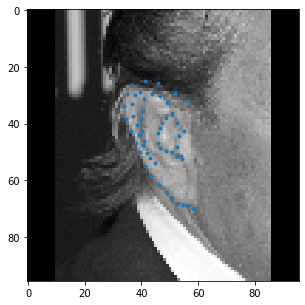

Y_tras: 206 - X_tras: 357
Id_image: 0282
csvfile: train_0282.csv


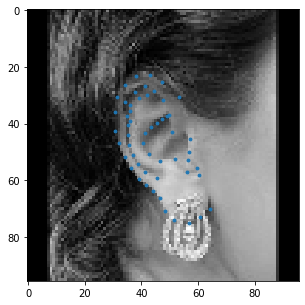

Y_tras: 416 - X_tras: 633
Id_image: 0283
csvfile: train_0283.csv


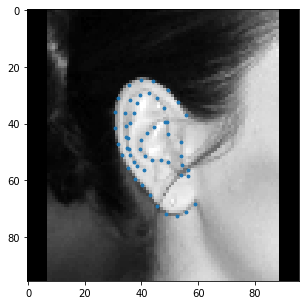

Y_tras: 0 - X_tras: 22
Id_image: 0284
file 0284 has no value translations
csvfile: train_0284.csv


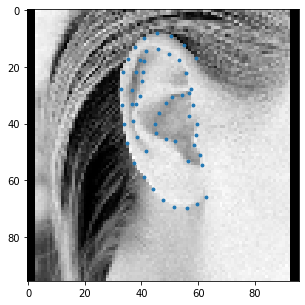

Y_tras: 313 - X_tras: 169
Id_image: 0285
csvfile: train_0285.csv


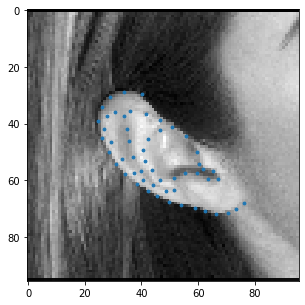

Y_tras: 317 - X_tras: 778
Id_image: 0286
csvfile: train_0286.csv


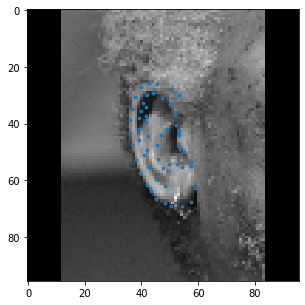

Y_tras: 237 - X_tras: 233
Id_image: 0287
csvfile: train_0287.csv


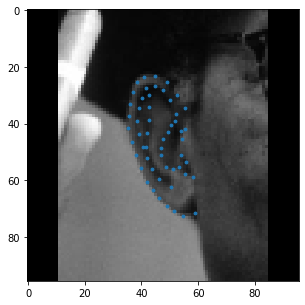

Y_tras: 235 - X_tras: 214
Id_image: 0288
csvfile: train_0288.csv


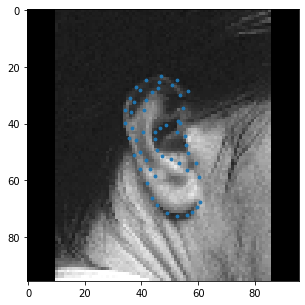

Y_tras: 220 - X_tras: 241
Id_image: 0289
csvfile: train_0289.csv


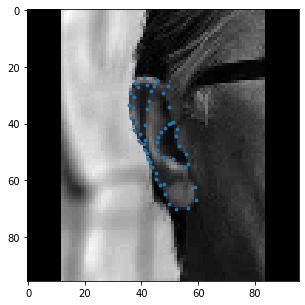

Y_tras: 231 - X_tras: 555
Id_image: 0290
csvfile: train_0290.csv


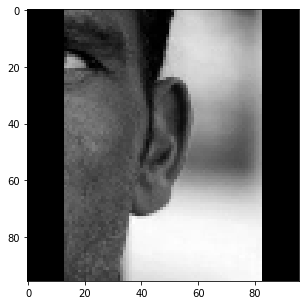

Y_tras: 180 - X_tras: 335
Id_image: 0291
csvfile: train_0291.csv


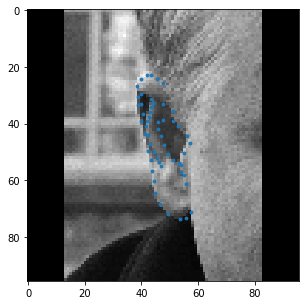

Y_tras: 307 - X_tras: 544
Id_image: 0292
csvfile: train_0292.csv


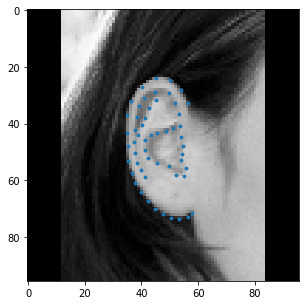

Y_tras: 569 - X_tras: 226
Id_image: 0293
csvfile: train_0293.csv


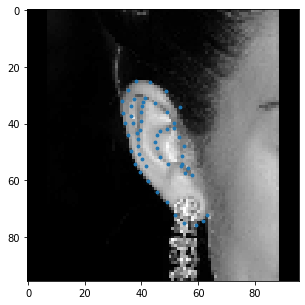

Y_tras: 222 - X_tras: 85
Id_image: 0294
csvfile: train_0294.csv


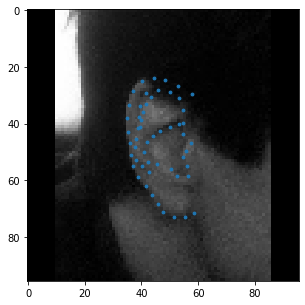

Y_tras: 253 - X_tras: 91
Id_image: 0295
csvfile: train_0295.csv


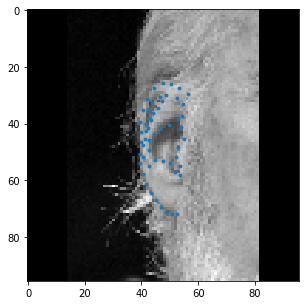

Y_tras: 0 - X_tras: 91
Id_image: 0296
file 0296 has no value translations
csvfile: train_0296.csv


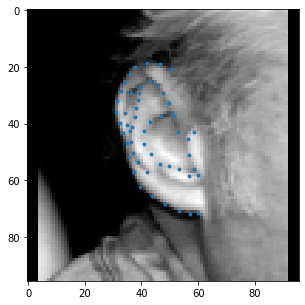

Y_tras: 174 - X_tras: 472
Id_image: 0297
csvfile: train_0297.csv


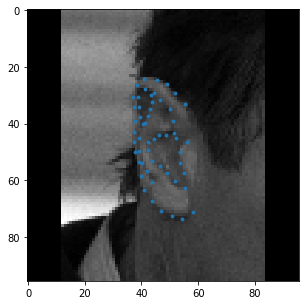

Y_tras: 310 - X_tras: 108
Id_image: 0298
csvfile: train_0298.csv


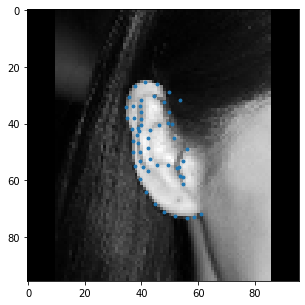

Y_tras: 97 - X_tras: 196
Id_image: 0299
csvfile: train_0299.csv


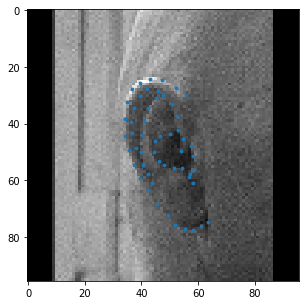

Y_tras: 200 - X_tras: 181
Id_image: 0300
csvfile: train_0300.csv


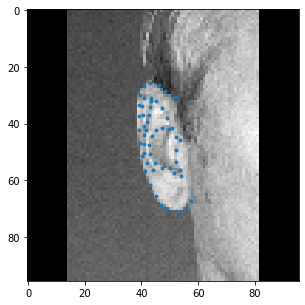

Y_tras: 310 - X_tras: 191
Id_image: 0301
csvfile: train_0301.csv


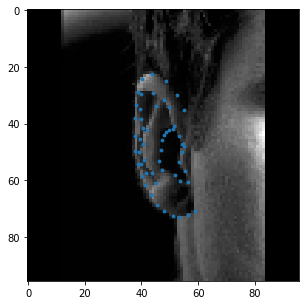

Y_tras: 216 - X_tras: 354
Id_image: 0302
csvfile: train_0302.csv


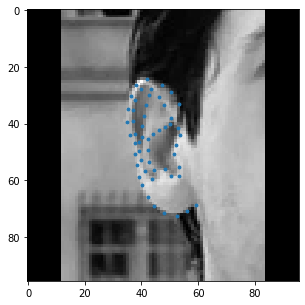

Y_tras: 257 - X_tras: 293
Id_image: 0303
csvfile: train_0303.csv


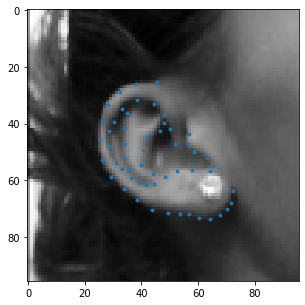

Y_tras: 324 - X_tras: 352
Id_image: 0304
csvfile: train_0304.csv


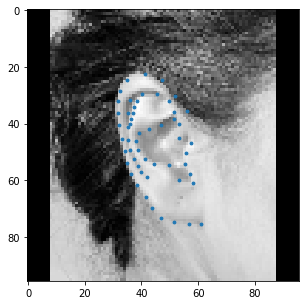

Y_tras: 260 - X_tras: 217
Id_image: 0305
csvfile: train_0305.csv


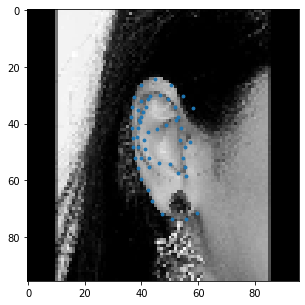

Y_tras: 437 - X_tras: 73
Id_image: 0306
csvfile: train_0306.csv


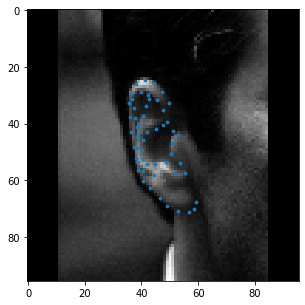

Y_tras: 148 - X_tras: 650
Id_image: 0307
csvfile: train_0307.csv


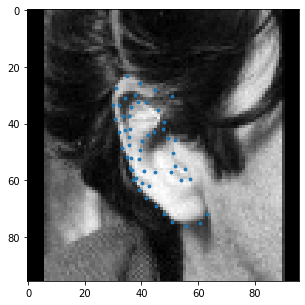

Y_tras: 138 - X_tras: 118
Id_image: 0308
csvfile: train_0308.csv


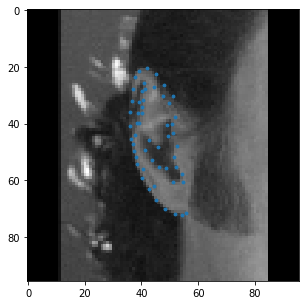

Y_tras: 261 - X_tras: 552
Id_image: 0309
csvfile: train_0309.csv


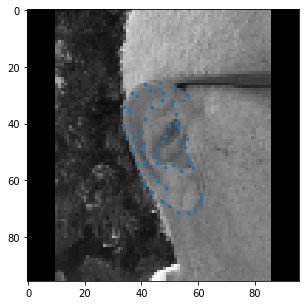

Y_tras: 419 - X_tras: 204
Id_image: 0310
csvfile: train_0310.csv


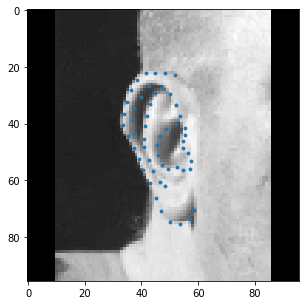

Y_tras: 250 - X_tras: 339
Id_image: 0311
csvfile: train_0311.csv


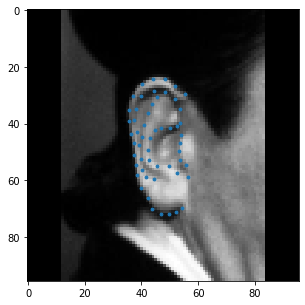

Y_tras: 21 - X_tras: 48
Id_image: 0312
csvfile: train_0312.csv


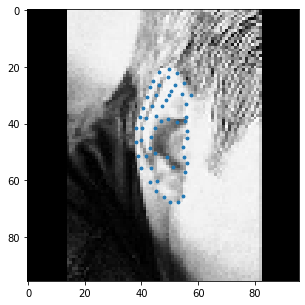

Y_tras: 266 - X_tras: 180
Id_image: 0313
csvfile: train_0313.csv


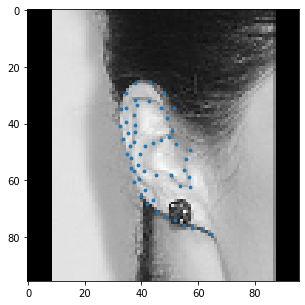

Y_tras: 401 - X_tras: 166
Id_image: 0314
csvfile: train_0314.csv


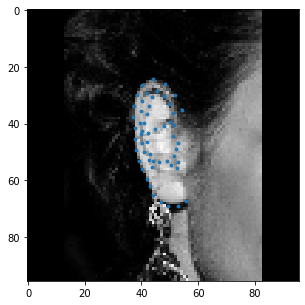

Y_tras: 460 - X_tras: 107
Id_image: 0315
csvfile: train_0315.csv


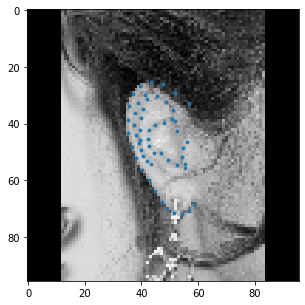

Y_tras: 223 - X_tras: 449
Id_image: 0316
csvfile: train_0316.csv


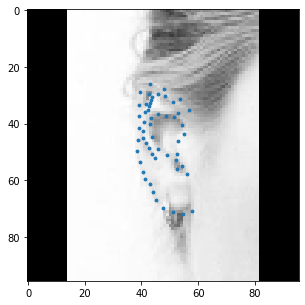

Y_tras: 106 - X_tras: 792
Id_image: 0317
csvfile: train_0317.csv


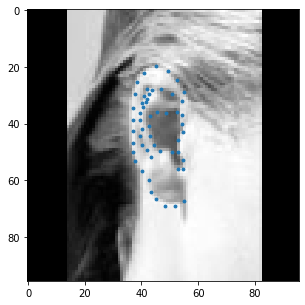

Y_tras: 172 - X_tras: 585
Id_image: 0318
csvfile: train_0318.csv


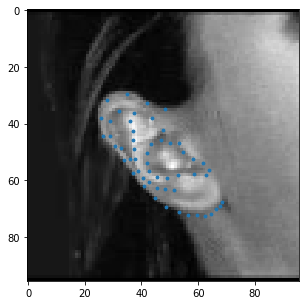

Y_tras: 93 - X_tras: 248
Id_image: 0320
csvfile: train_0320.csv


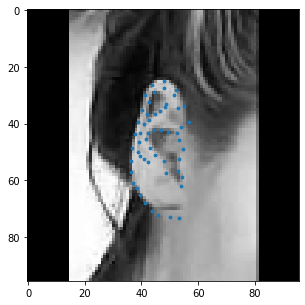

Y_tras: 268 - X_tras: 32
Id_image: 0321
csvfile: train_0321.csv


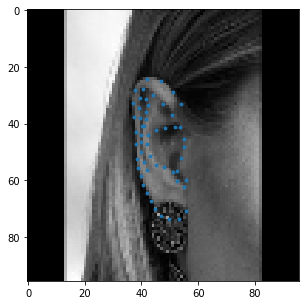

Y_tras: 323 - X_tras: 251
Id_image: 0322
csvfile: train_0322.csv


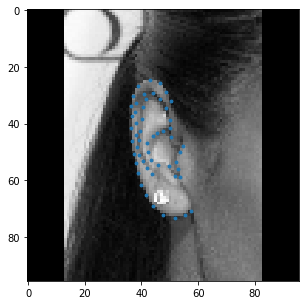

Y_tras: 316 - X_tras: 191
Id_image: 0323
csvfile: train_0323.csv


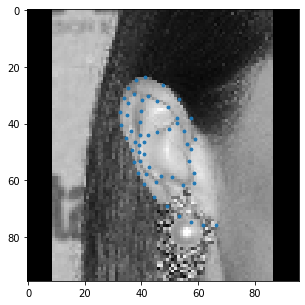

Y_tras: 169 - X_tras: 364
Id_image: 0324
csvfile: train_0324.csv


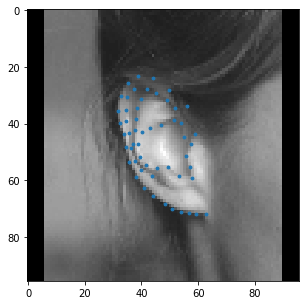

Y_tras: 229 - X_tras: 231
Id_image: 0325
csvfile: train_0325.csv


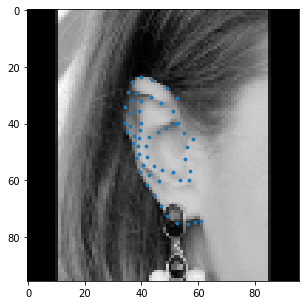

Y_tras: 273 - X_tras: 154
Id_image: 0326
csvfile: train_0326.csv


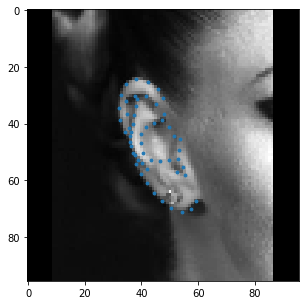

Y_tras: 455 - X_tras: 74
Id_image: 0327
csvfile: train_0327.csv


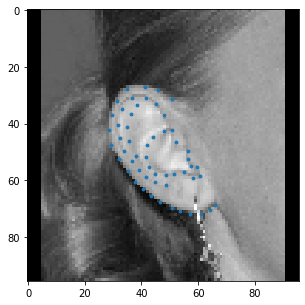

Y_tras: 185 - X_tras: 479
Id_image: 0328
csvfile: train_0328.csv


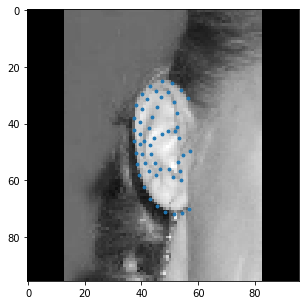

Y_tras: 269 - X_tras: 122
Id_image: 0330
csvfile: train_0330.csv


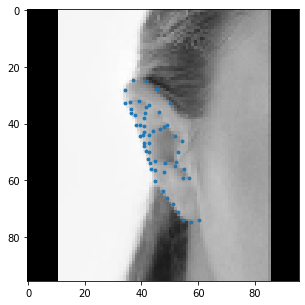

Y_tras: 532 - X_tras: 241
Id_image: 0331
csvfile: train_0331.csv


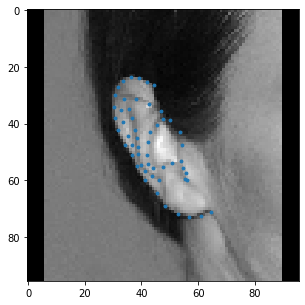

Y_tras: 873 - X_tras: 0
Id_image: 0333
file 0333 has no value translations
csvfile: train_0333.csv


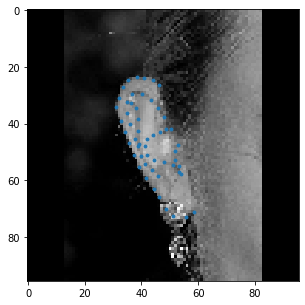

Y_tras: 237 - X_tras: 368
Id_image: 0334
csvfile: train_0334.csv


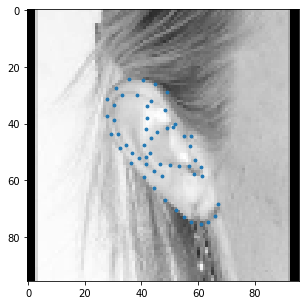

Y_tras: 400 - X_tras: 192
Id_image: 0335
csvfile: train_0335.csv


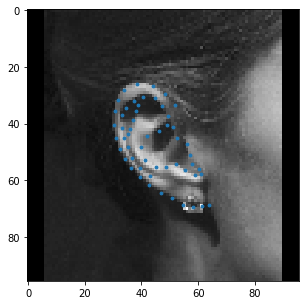

Y_tras: 158 - X_tras: 271
Id_image: 0336
csvfile: train_0336.csv


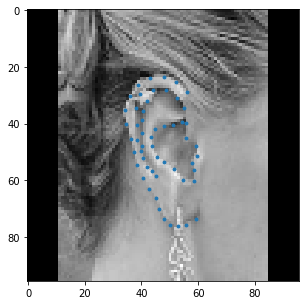

Y_tras: 160 - X_tras: 292
Id_image: 0337
csvfile: train_0337.csv


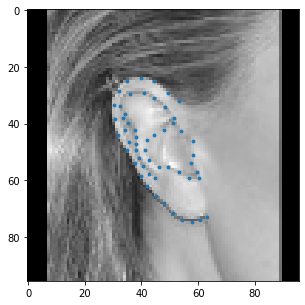

Y_tras: 271 - X_tras: 87
Id_image: 0338
csvfile: train_0338.csv


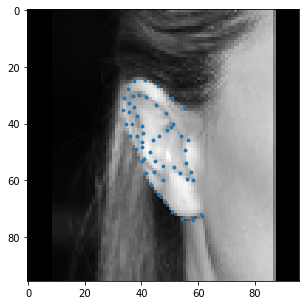

Y_tras: 456 - X_tras: 554
Id_image: 0339
csvfile: train_0339.csv


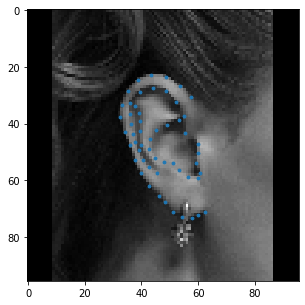

Y_tras: 308 - X_tras: 309
Id_image: 0340
csvfile: train_0340.csv


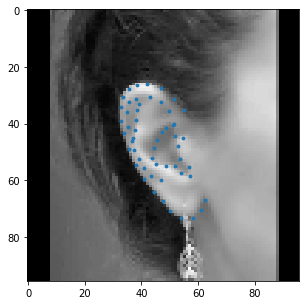

Y_tras: 97 - X_tras: 162
Id_image: 0341
csvfile: train_0341.csv


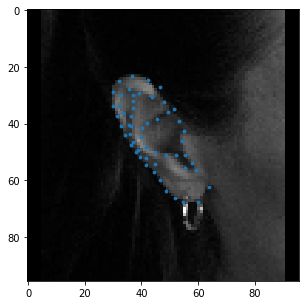

Y_tras: 319 - X_tras: 94
Id_image: 0342
csvfile: train_0342.csv


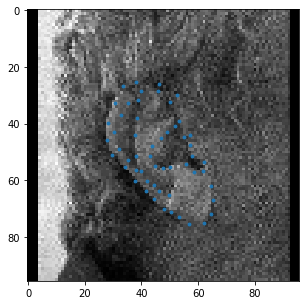

Y_tras: 1198 - X_tras: 505
Id_image: 0343
csvfile: train_0343.csv


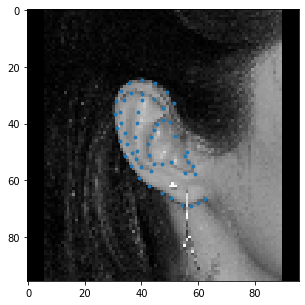

Y_tras: 209 - X_tras: 110
Id_image: 0344
csvfile: train_0344.csv


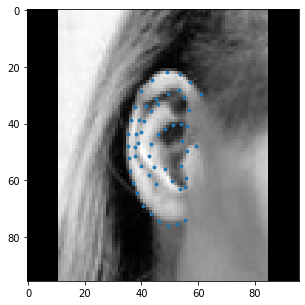

Y_tras: 398 - X_tras: 2439
Id_image: 0345
csvfile: train_0345.csv


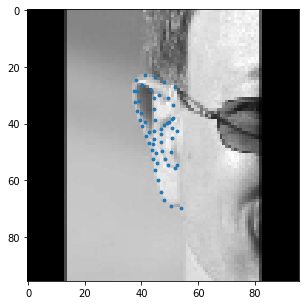

Y_tras: 278 - X_tras: 220
Id_image: 0346
csvfile: train_0346.csv


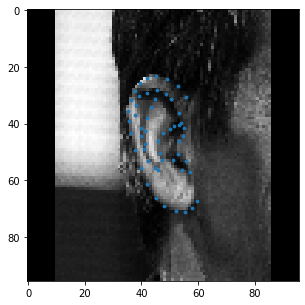

Y_tras: 169 - X_tras: 941
Id_image: 0347
csvfile: train_0347.csv


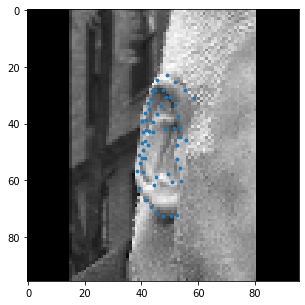

Y_tras: 218 - X_tras: 505
Id_image: 0348
csvfile: train_0348.csv


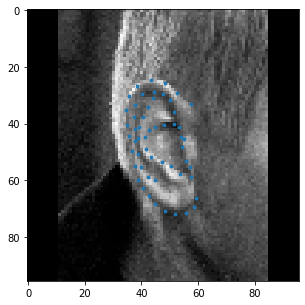

Y_tras: 173 - X_tras: 207
Id_image: 0349
csvfile: train_0349.csv


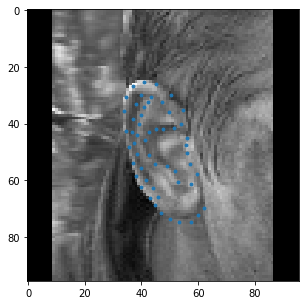

Y_tras: 324 - X_tras: 101
Id_image: 0350
csvfile: train_0350.csv


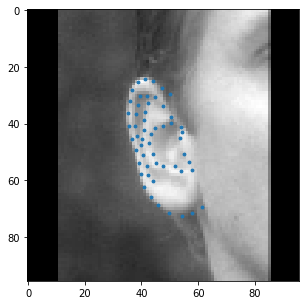

Y_tras: 61 - X_tras: 14
Id_image: 0351
csvfile: train_0351.csv


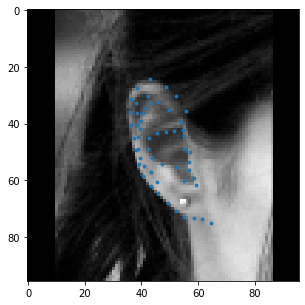

Y_tras: 175 - X_tras: 244
Id_image: 0352
csvfile: train_0352.csv


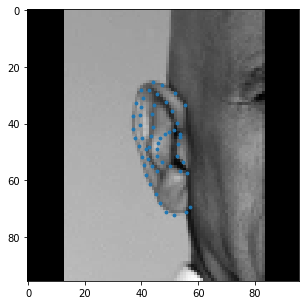

Y_tras: 313 - X_tras: 41
Id_image: 0353
csvfile: train_0353.csv


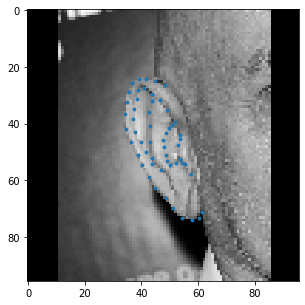

Y_tras: 260 - X_tras: 330
Id_image: 0354
csvfile: train_0354.csv


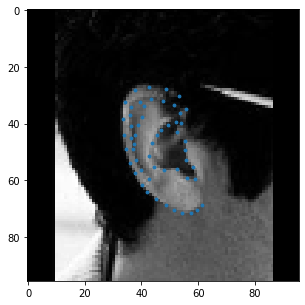

Y_tras: 196 - X_tras: 417
Id_image: 0355
csvfile: train_0355.csv


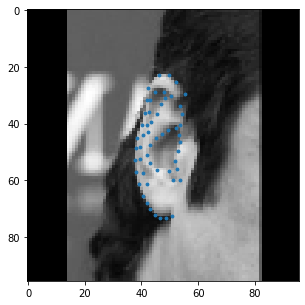

Y_tras: 255 - X_tras: 231
Id_image: 0356
csvfile: train_0356.csv


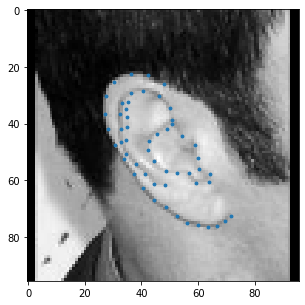

Y_tras: 246 - X_tras: 304
Id_image: 0357
csvfile: train_0357.csv


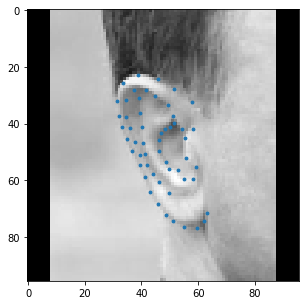

Y_tras: 134 - X_tras: 78
Id_image: 0358
csvfile: train_0358.csv


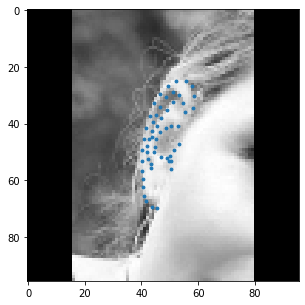

Y_tras: 308 - X_tras: 12
Id_image: 0360
csvfile: train_0360.csv


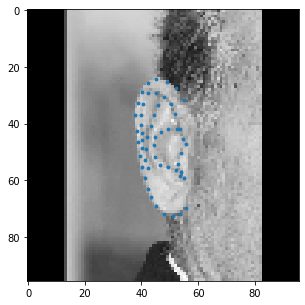

Y_tras: 361 - X_tras: 80
Id_image: 0361
csvfile: train_0361.csv


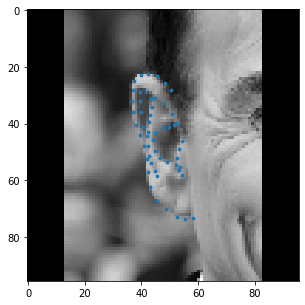

Y_tras: 171 - X_tras: 389
Id_image: 0362
csvfile: train_0362.csv


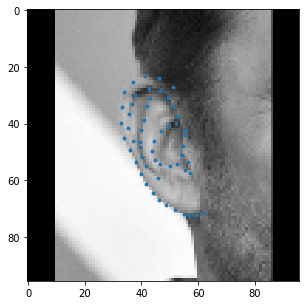

Y_tras: 591 - X_tras: 16
Id_image: 0363
csvfile: train_0363.csv


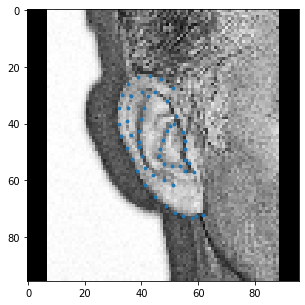

Y_tras: 463 - X_tras: 262
Id_image: 0364
csvfile: train_0364.csv


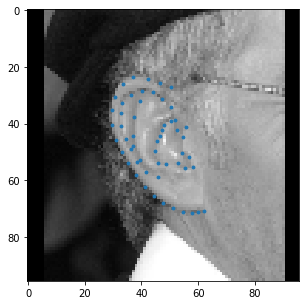

Y_tras: 224 - X_tras: 233
Id_image: 0365
csvfile: train_0365.csv


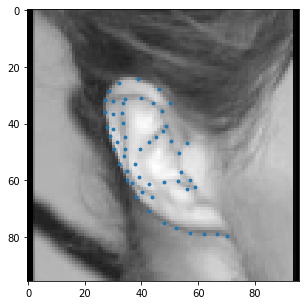

Y_tras: 51 - X_tras: 85
Id_image: 0366
csvfile: train_0366.csv


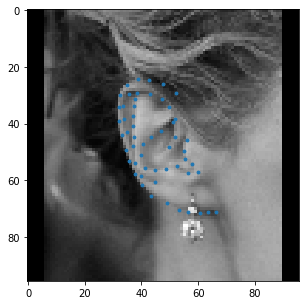

Y_tras: 60 - X_tras: 221
Id_image: 0367
csvfile: train_0367.csv


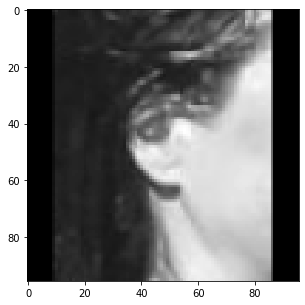

Y_tras: 320 - X_tras: 110
Id_image: 0368
csvfile: train_0368.csv


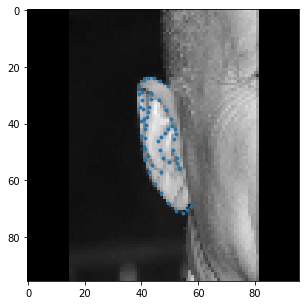

Y_tras: 310 - X_tras: 402
Id_image: 0369
csvfile: train_0369.csv


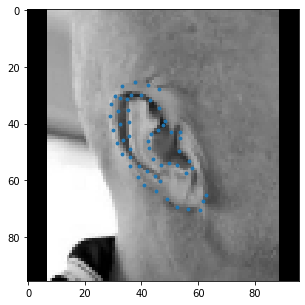

Y_tras: 720 - X_tras: 435
Id_image: 0370
csvfile: train_0370.csv


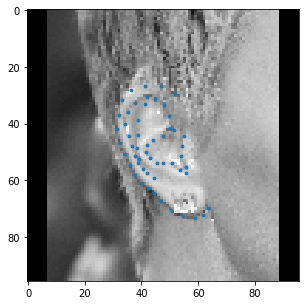

Y_tras: 197 - X_tras: 284
Id_image: 0371
csvfile: train_0371.csv


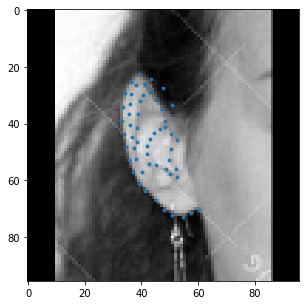

Y_tras: 291 - X_tras: 168
Id_image: 0372
csvfile: train_0372.csv


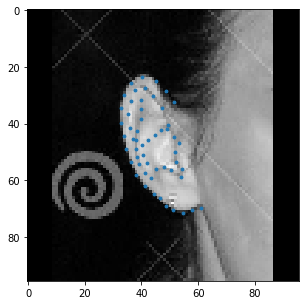

Y_tras: 455 - X_tras: 332
Id_image: 0373
csvfile: train_0373.csv


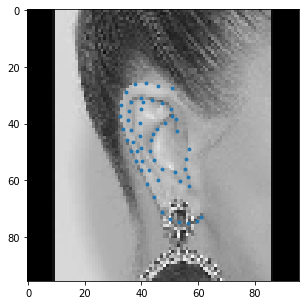

Y_tras: 267 - X_tras: 90
Id_image: 0374
csvfile: train_0374.csv


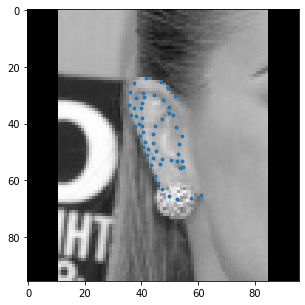

Y_tras: 292 - X_tras: 67
Id_image: 0375
csvfile: train_0375.csv


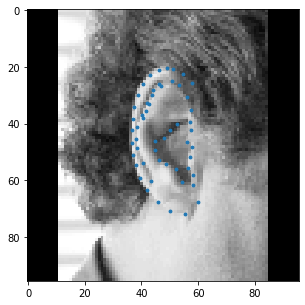

Y_tras: 413 - X_tras: 200
Id_image: 0376
csvfile: train_0376.csv


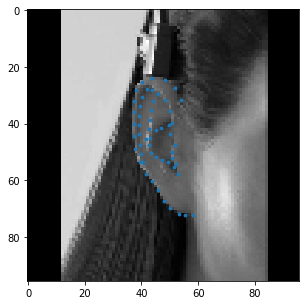

Y_tras: 0 - X_tras: 701
Id_image: 0377
file 0377 has no value translations
csvfile: train_0377.csv


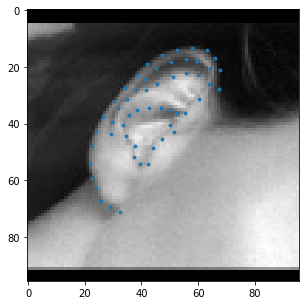

Y_tras: 41 - X_tras: 459
Id_image: 0378
csvfile: train_0378.csv


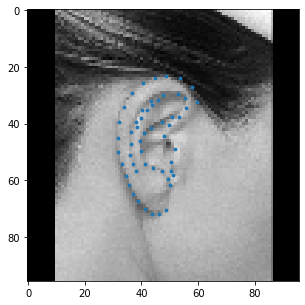

Y_tras: 536 - X_tras: 1174
Id_image: 0379
csvfile: train_0379.csv


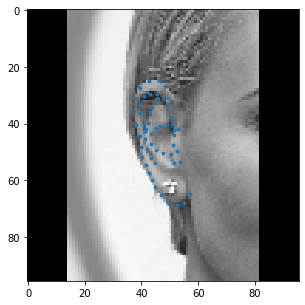

Y_tras: 57 - X_tras: 147
Id_image: 0380
csvfile: train_0380.csv


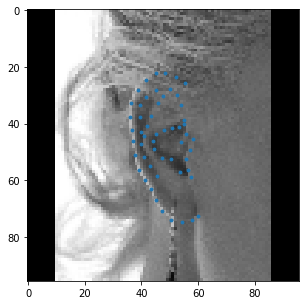

Y_tras: 195 - X_tras: 144
Id_image: 0381
csvfile: train_0381.csv


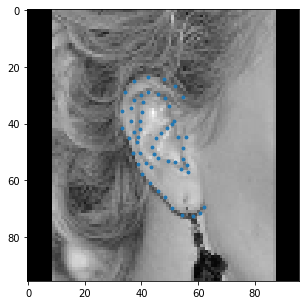

Y_tras: 77 - X_tras: 184
Id_image: 0382
csvfile: train_0382.csv


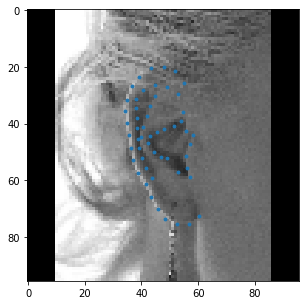

Y_tras: 297 - X_tras: 369
Id_image: 0383
csvfile: train_0383.csv


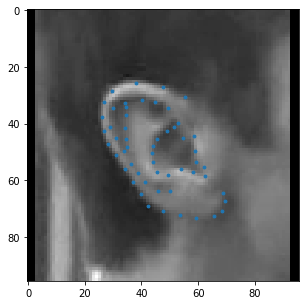

Y_tras: 192 - X_tras: 101
Id_image: 0384
csvfile: train_0384.csv


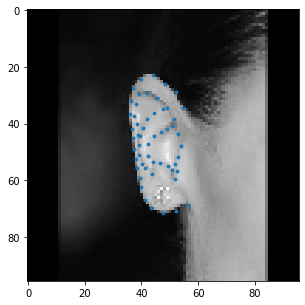

Y_tras: 378 - X_tras: 147
Id_image: 0385
csvfile: train_0385.csv


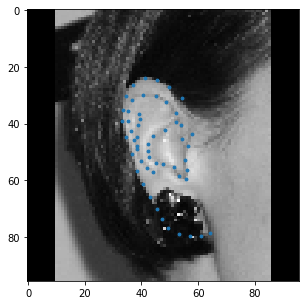

Y_tras: 129 - X_tras: 269
Id_image: 0386
csvfile: train_0386.csv


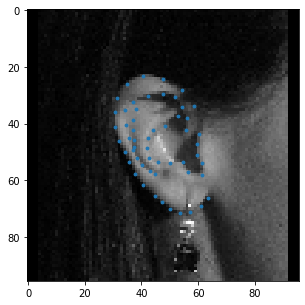

Y_tras: 211 - X_tras: 339
Id_image: 0387
csvfile: train_0387.csv


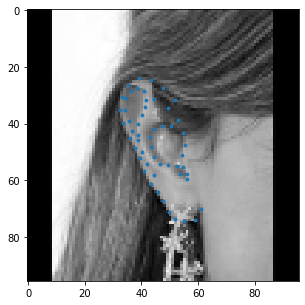

Y_tras: 348 - X_tras: 386
Id_image: 0388
csvfile: train_0388.csv


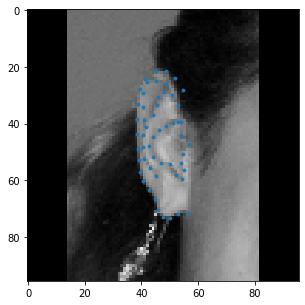

Y_tras: 138 - X_tras: 350
Id_image: 0389
csvfile: train_0389.csv


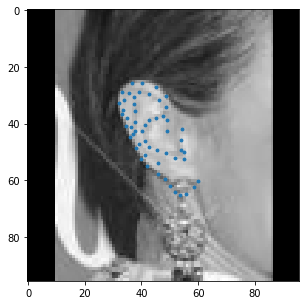

Y_tras: 168 - X_tras: 303
Id_image: 0390
csvfile: train_0390.csv


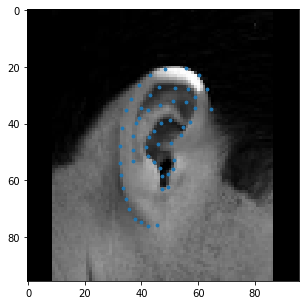

Y_tras: 230 - X_tras: 196
Id_image: 0391
csvfile: train_0391.csv


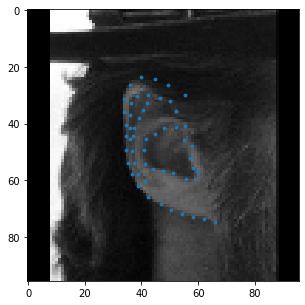

Y_tras: 355 - X_tras: 59
Id_image: 0392
csvfile: train_0392.csv


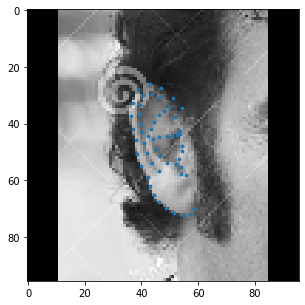

Y_tras: 210 - X_tras: 215
Id_image: 0393
csvfile: train_0393.csv


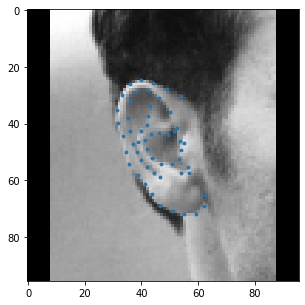

Y_tras: 269 - X_tras: 379
Id_image: 0394
csvfile: train_0394.csv


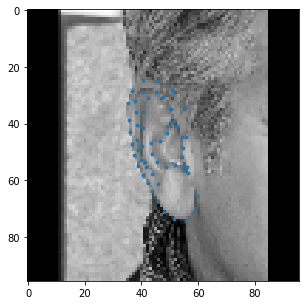

Y_tras: 177 - X_tras: 494
Id_image: 0395
csvfile: train_0395.csv


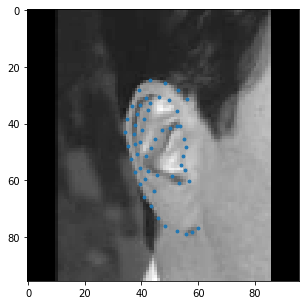

Y_tras: 281 - X_tras: 0
Id_image: 0396
file 0396 has no value translations
csvfile: train_0396.csv


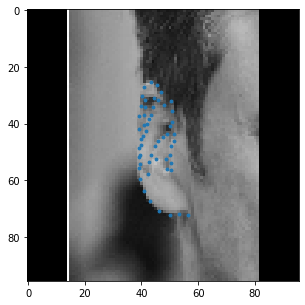

Y_tras: 565 - X_tras: 454
Id_image: 0397
csvfile: train_0397.csv


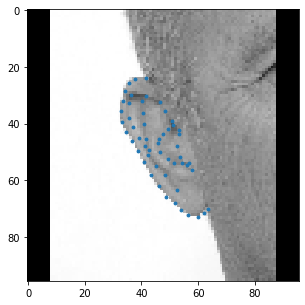

Y_tras: 243 - X_tras: 173
Id_image: 0398
csvfile: train_0398.csv


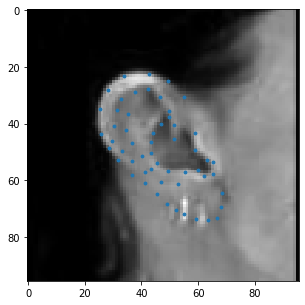

Y_tras: 234 - X_tras: 185
Id_image: 0399
csvfile: train_0399.csv


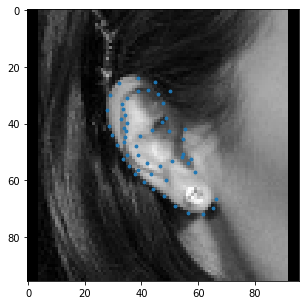

Y_tras: 298 - X_tras: 395
Id_image: 0400
csvfile: train_0400.csv


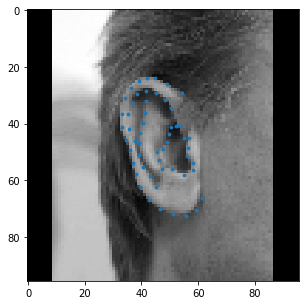

Y_tras: 72 - X_tras: 201
Id_image: 0401
csvfile: train_0401.csv


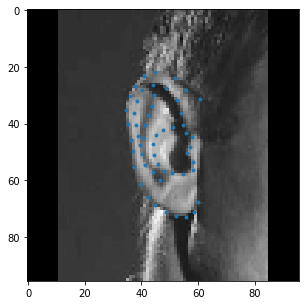

Y_tras: 157 - X_tras: 231
Id_image: 0402
csvfile: train_0402.csv


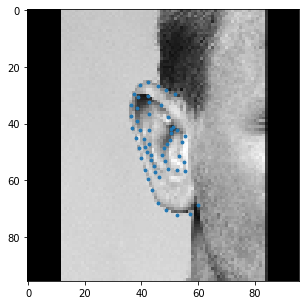

Y_tras: 204 - X_tras: 127
Id_image: 0403
csvfile: train_0403.csv


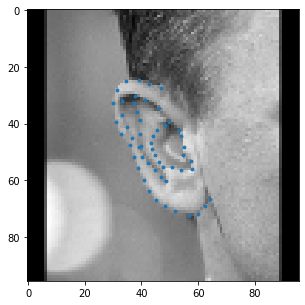

Y_tras: 149 - X_tras: 276
Id_image: 0404
csvfile: train_0404.csv


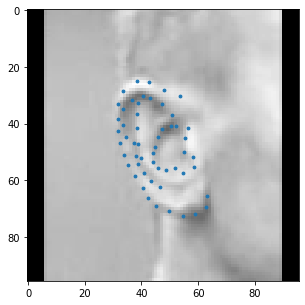

Y_tras: 666 - X_tras: 211
Id_image: 0405
csvfile: train_0405.csv


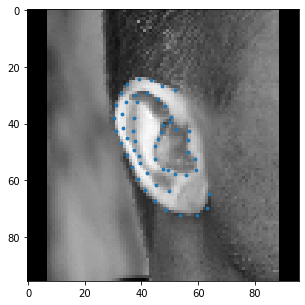

Y_tras: 87 - X_tras: 250
Id_image: 0406
csvfile: train_0406.csv


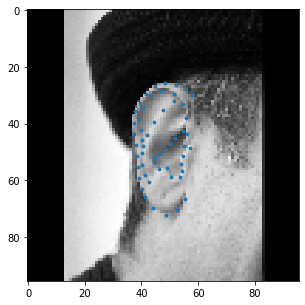

Y_tras: 77 - X_tras: 247
Id_image: 0407
csvfile: train_0407.csv


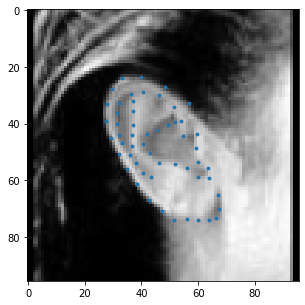

Y_tras: 103 - X_tras: 798
Id_image: 0408
csvfile: train_0408.csv


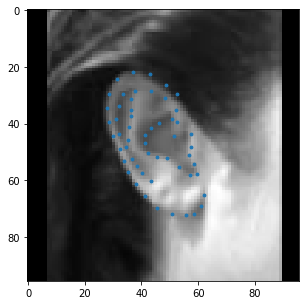

Y_tras: 274 - X_tras: 63
Id_image: 0409
csvfile: train_0409.csv


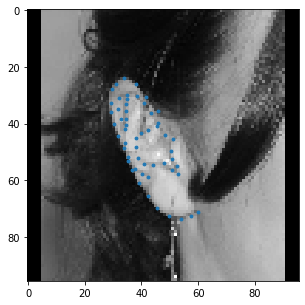

Y_tras: 227 - X_tras: 93
Id_image: 0410
csvfile: train_0410.csv


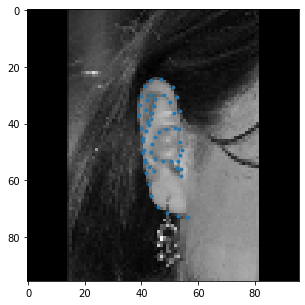

Y_tras: 298 - X_tras: 55
Id_image: 0411
csvfile: train_0411.csv


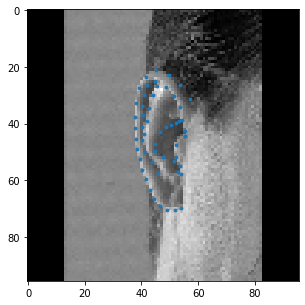

Y_tras: 189 - X_tras: 72
Id_image: 0412
csvfile: train_0412.csv


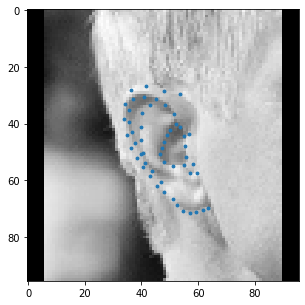

Y_tras: 101 - X_tras: 233
Id_image: 0413
csvfile: train_0413.csv


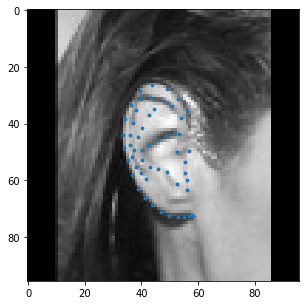

Y_tras: 579 - X_tras: 0
Id_image: 0414
file 0414 has no value translations
csvfile: train_0414.csv


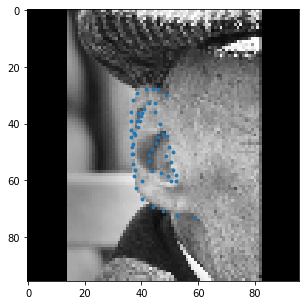

Y_tras: 189 - X_tras: 220
Id_image: 0415
csvfile: train_0415.csv


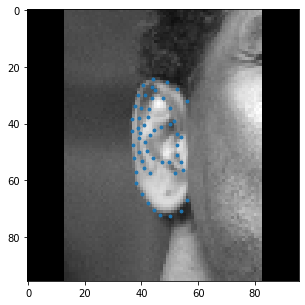

Y_tras: 244 - X_tras: 177
Id_image: 0416
csvfile: train_0416.csv


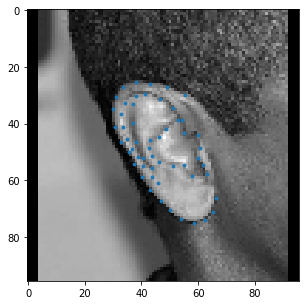

Y_tras: 196 - X_tras: 411
Id_image: 0417
csvfile: train_0417.csv


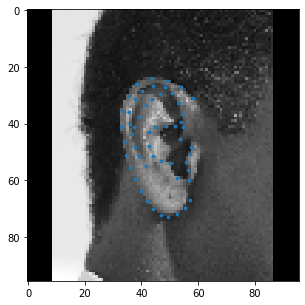

Y_tras: 78 - X_tras: 803
Id_image: 0418
csvfile: train_0418.csv


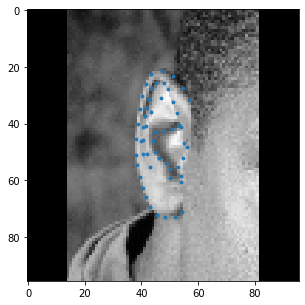

Y_tras: 251 - X_tras: 370
Id_image: 0419
csvfile: train_0419.csv


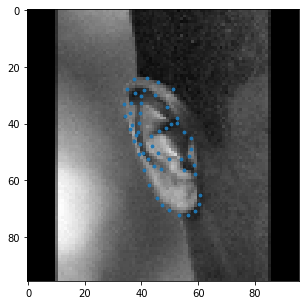

Y_tras: 247 - X_tras: 1013
Id_image: 0420
csvfile: train_0420.csv


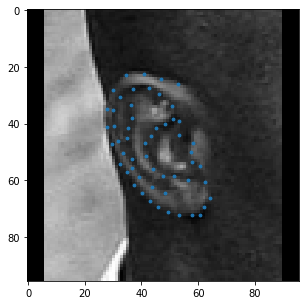

Y_tras: 523 - X_tras: 131
Id_image: 0421
csvfile: train_0421.csv


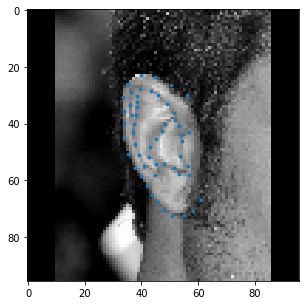

Y_tras: 177 - X_tras: 17
Id_image: 0422
csvfile: train_0422.csv


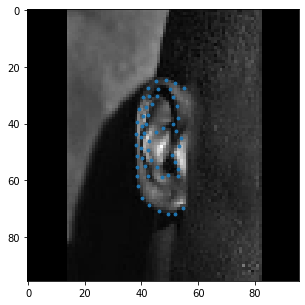

Y_tras: 81 - X_tras: 366
Id_image: 0423
csvfile: train_0423.csv


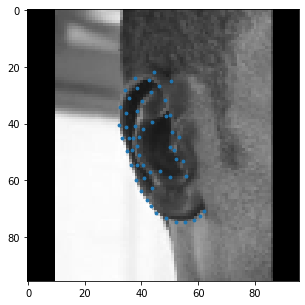

Y_tras: 213 - X_tras: 91
Id_image: 0424
csvfile: train_0424.csv


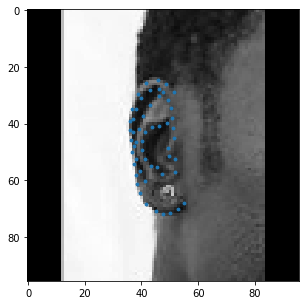

Y_tras: 309 - X_tras: 330
Id_image: 0425
csvfile: train_0425.csv


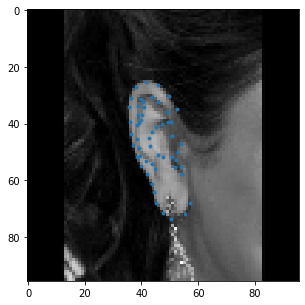

Y_tras: 194 - X_tras: 140
Id_image: 0426
csvfile: train_0426.csv


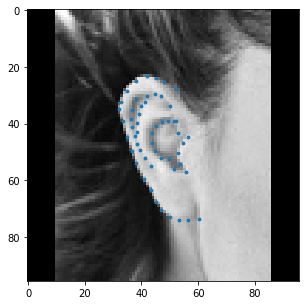

Y_tras: 122 - X_tras: 540
Id_image: 0427
csvfile: train_0427.csv


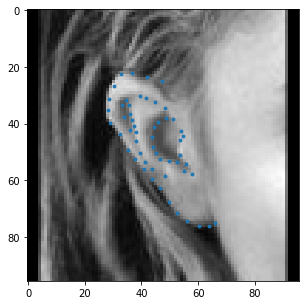

Y_tras: 244 - X_tras: 223
Id_image: 0428
csvfile: train_0428.csv


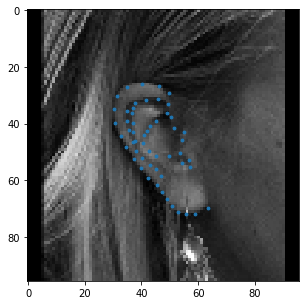

Y_tras: 207 - X_tras: 166
Id_image: 0429
csvfile: train_0429.csv


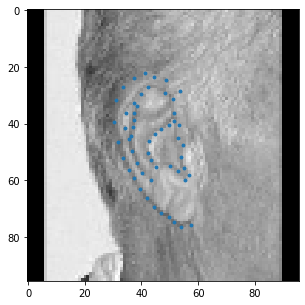

Y_tras: 399 - X_tras: 20
Id_image: 0430
csvfile: train_0430.csv


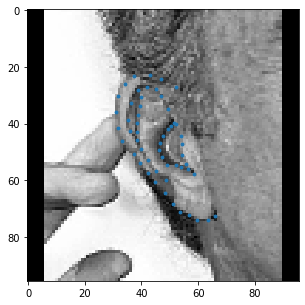

Y_tras: 321 - X_tras: 0
Id_image: 0431
file 0431 has no value translations
csvfile: train_0431.csv


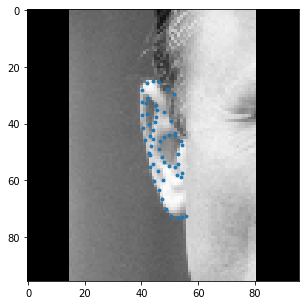

Y_tras: 467 - X_tras: 35
Id_image: 0432
csvfile: train_0432.csv


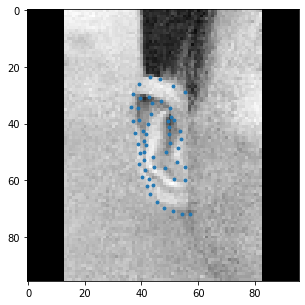

Y_tras: 171 - X_tras: 141
Id_image: 0433
csvfile: train_0433.csv


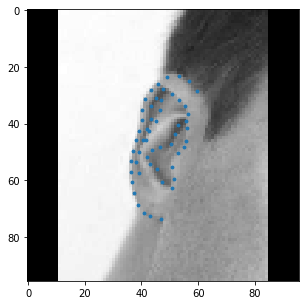

Y_tras: 231 - X_tras: 123
Id_image: 0434
csvfile: train_0434.csv


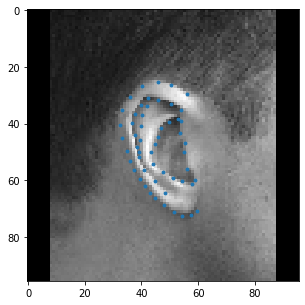

Y_tras: 1198 - X_tras: 491
Id_image: 0435
csvfile: train_0435.csv


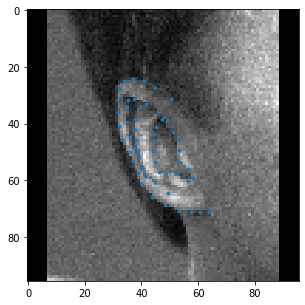

Y_tras: 241 - X_tras: 177
Id_image: 0436
csvfile: train_0436.csv


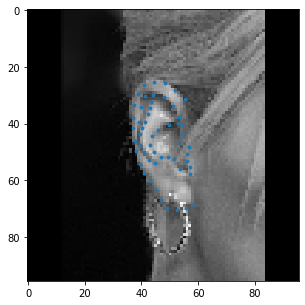

Y_tras: 348 - X_tras: 399
Id_image: 0437
csvfile: train_0437.csv


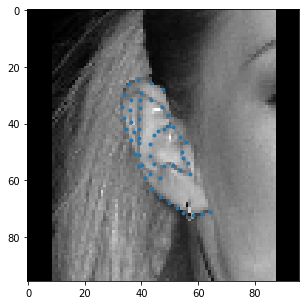

Y_tras: 271 - X_tras: 238
Id_image: 0438
csvfile: train_0438.csv


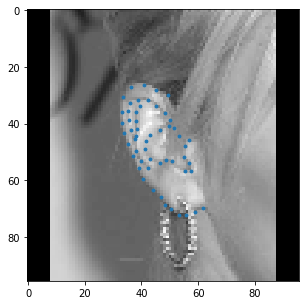

Y_tras: 335 - X_tras: 453
Id_image: 0439
csvfile: train_0439.csv


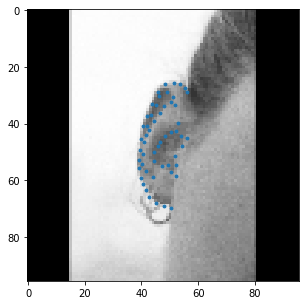

Y_tras: 804 - X_tras: 308
Id_image: 0440
csvfile: train_0440.csv


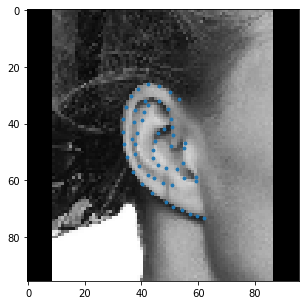

Y_tras: 398 - X_tras: 353
Id_image: 0441
csvfile: train_0441.csv


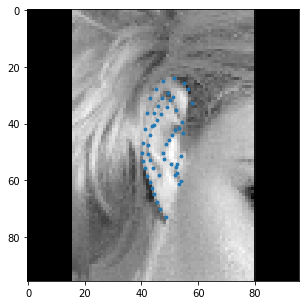

Y_tras: 278 - X_tras: 248
Id_image: 0442
csvfile: train_0442.csv


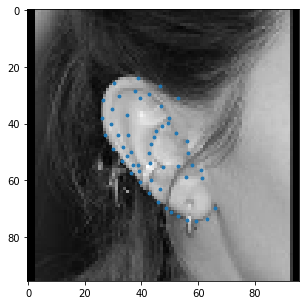

Y_tras: 162 - X_tras: 279
Id_image: 0443
csvfile: train_0443.csv


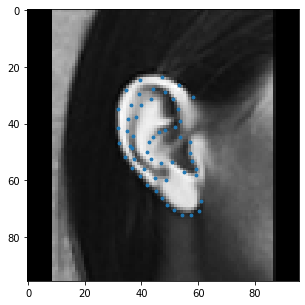

Y_tras: 186 - X_tras: 281
Id_image: 0444
csvfile: train_0444.csv


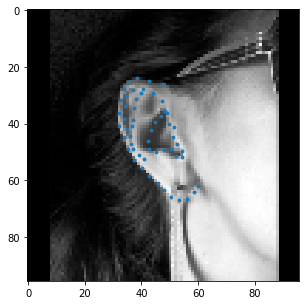

Y_tras: 240 - X_tras: 669
Id_image: 0445
csvfile: train_0445.csv


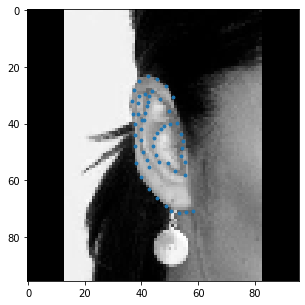

Y_tras: 98 - X_tras: 280
Id_image: 0446
csvfile: train_0446.csv


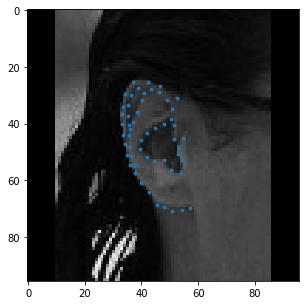

Y_tras: 194 - X_tras: 874
Id_image: 0447
csvfile: train_0447.csv


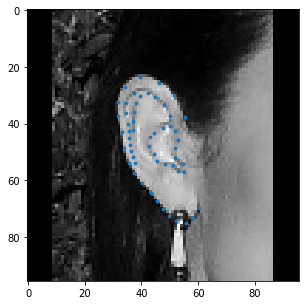

Y_tras: 480 - X_tras: 76
Id_image: 0448
csvfile: train_0448.csv


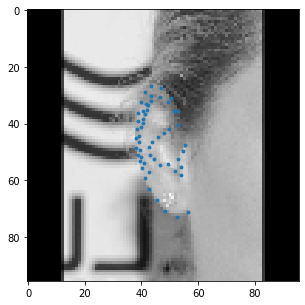

Y_tras: 206 - X_tras: 353
Id_image: 0449
csvfile: train_0449.csv


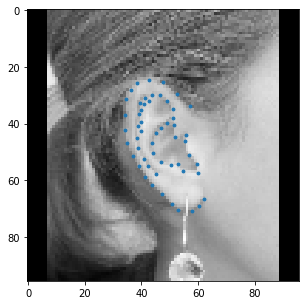

Y_tras: 117 - X_tras: 355
Id_image: 0450
csvfile: train_0450.csv


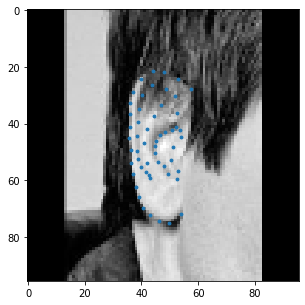

Y_tras: 126 - X_tras: 335
Id_image: 0451
csvfile: train_0451.csv


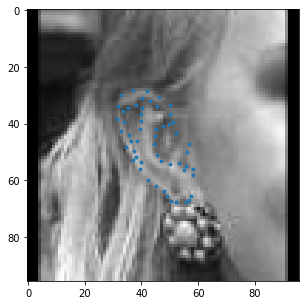

Y_tras: 111 - X_tras: 293
Id_image: 0452
csvfile: train_0452.csv


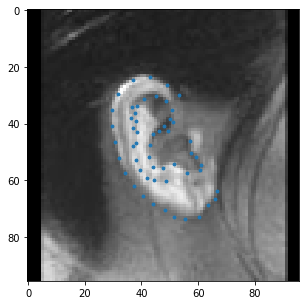

Y_tras: 277 - X_tras: 396
Id_image: 0453
csvfile: train_0453.csv


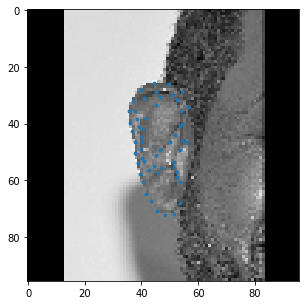

Y_tras: 137 - X_tras: 112
Id_image: 0454
csvfile: train_0454.csv


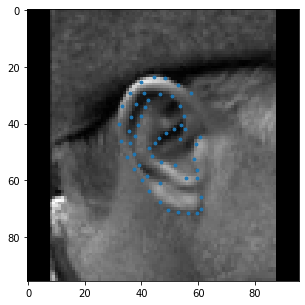

Y_tras: 116 - X_tras: 451
Id_image: 0455
csvfile: train_0455.csv


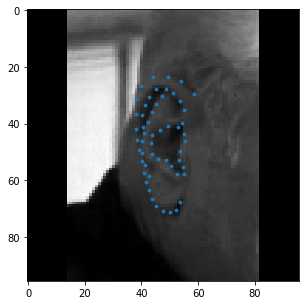

Y_tras: 0 - X_tras: 0
Id_image: 0456
file 0456 has no value translations
csvfile: train_0456.csv


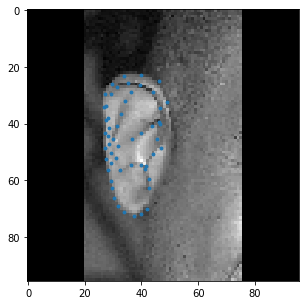

Y_tras: 214 - X_tras: 298
Id_image: 0457
csvfile: train_0457.csv


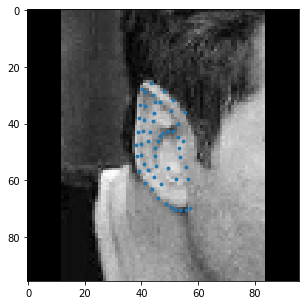

Y_tras: 277 - X_tras: 39
Id_image: 0458
csvfile: train_0458.csv


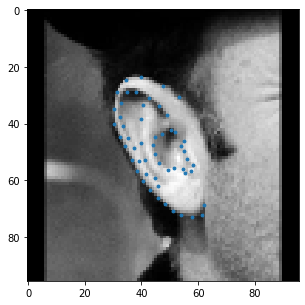

Y_tras: 329 - X_tras: 160
Id_image: 0459
csvfile: train_0459.csv


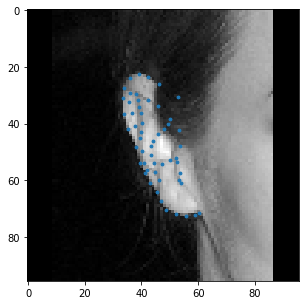

Y_tras: 159 - X_tras: 123
Id_image: 0460
csvfile: train_0460.csv


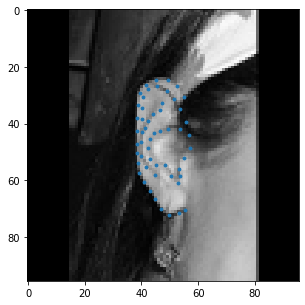

Y_tras: 602 - X_tras: 0
Id_image: 0461
file 0461 has no value translations
csvfile: train_0461.csv


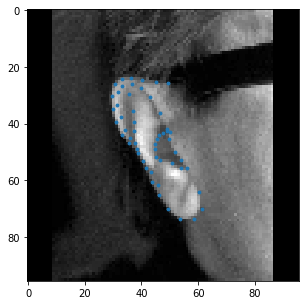

Y_tras: 177 - X_tras: 187
Id_image: 0462
csvfile: train_0462.csv


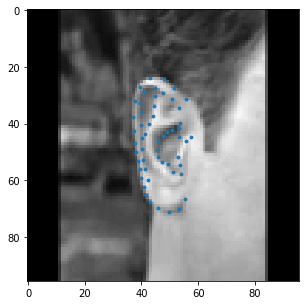

Y_tras: 97 - X_tras: 128
Id_image: 0463
csvfile: train_0463.csv


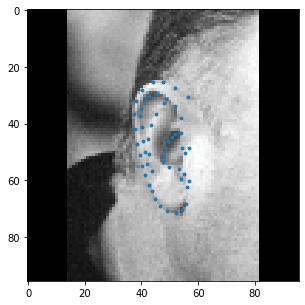

Y_tras: 447 - X_tras: 0
Id_image: 0464
file 0464 has no value translations
csvfile: train_0464.csv


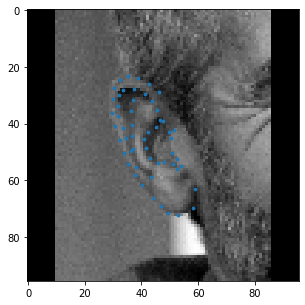

Y_tras: 181 - X_tras: 295
Id_image: 0465
csvfile: train_0465.csv


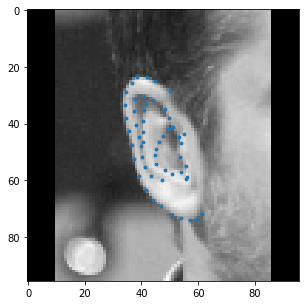

Y_tras: 201 - X_tras: 148
Id_image: 0466
csvfile: train_0466.csv


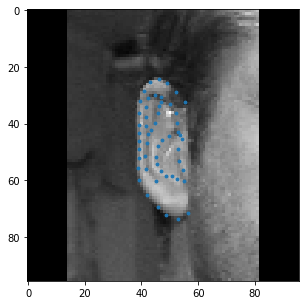

Y_tras: 229 - X_tras: 187
Id_image: 0467
csvfile: train_0467.csv


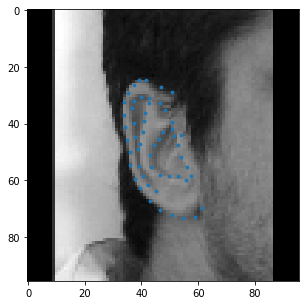

Y_tras: 234 - X_tras: 263
Id_image: 0468
csvfile: train_0468.csv


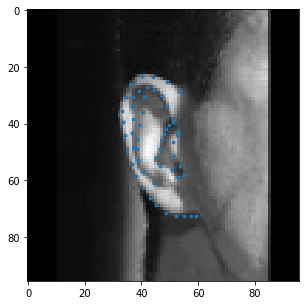

Y_tras: 194 - X_tras: 213
Id_image: 0469
csvfile: train_0469.csv


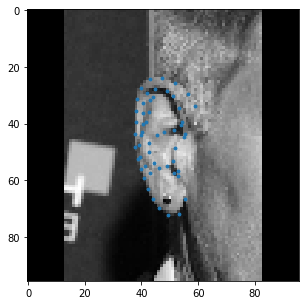

Y_tras: 43 - X_tras: 255
Id_image: 0470
csvfile: train_0470.csv


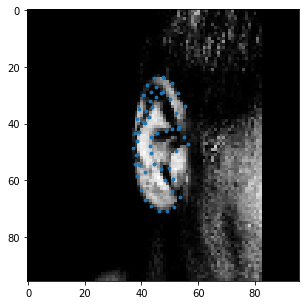

Y_tras: 184 - X_tras: 517
Id_image: 0472
csvfile: train_0472.csv


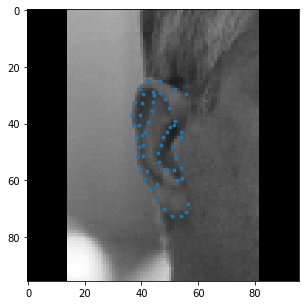

Y_tras: 209 - X_tras: 658
Id_image: 0473
csvfile: train_0473.csv


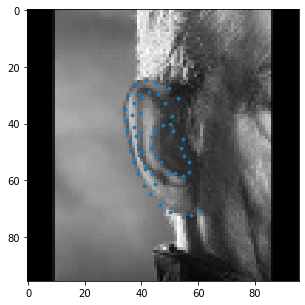

Y_tras: 206 - X_tras: 31
Id_image: 0474
csvfile: train_0474.csv


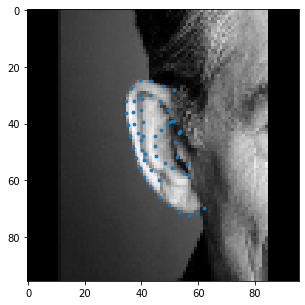

Y_tras: 422 - X_tras: 970
Id_image: 0475
csvfile: train_0475.csv


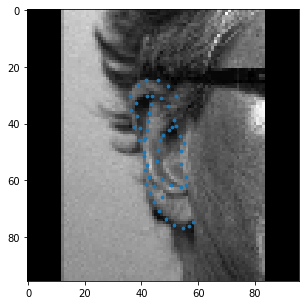

Y_tras: 0 - X_tras: 0
Id_image: 0476
file 0476 has no value translations
csvfile: train_0476.csv


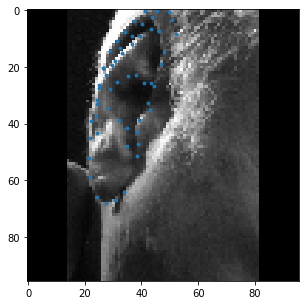

Y_tras: 481 - X_tras: 408
Id_image: 0477
csvfile: train_0477.csv


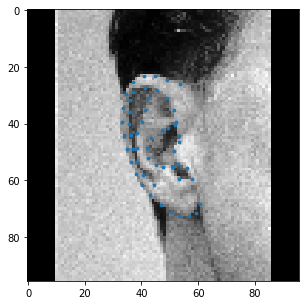

Y_tras: 521 - X_tras: 946
Id_image: 0478
csvfile: train_0478.csv


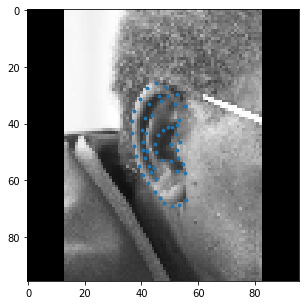

Y_tras: 171 - X_tras: 228
Id_image: 0479
csvfile: train_0479.csv


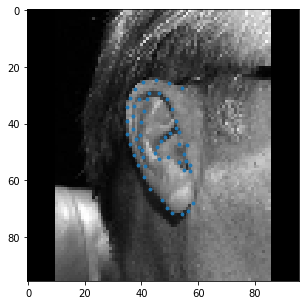

Y_tras: 204 - X_tras: 151
Id_image: 0480
csvfile: train_0480.csv


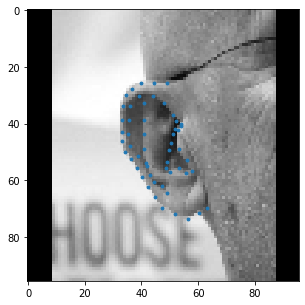

Y_tras: 337 - X_tras: 64
Id_image: 0481
csvfile: train_0481.csv


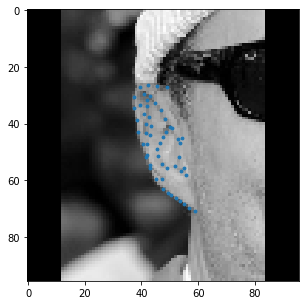

Y_tras: 319 - X_tras: 70
Id_image: 0482
csvfile: train_0482.csv


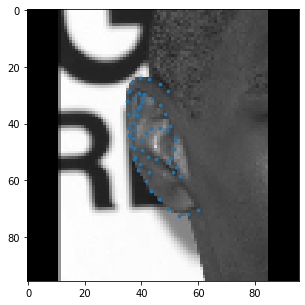

Y_tras: 267 - X_tras: 68
Id_image: 0483
csvfile: train_0483.csv


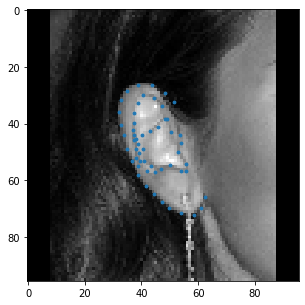

Y_tras: 765 - X_tras: 401
Id_image: 0484
csvfile: train_0484.csv


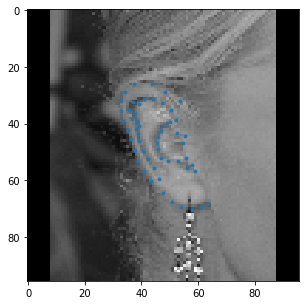

Y_tras: 190 - X_tras: 58
Id_image: 0485
csvfile: train_0485.csv


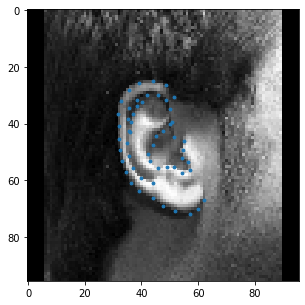

Y_tras: 299 - X_tras: 202
Id_image: 0486
csvfile: train_0486.csv


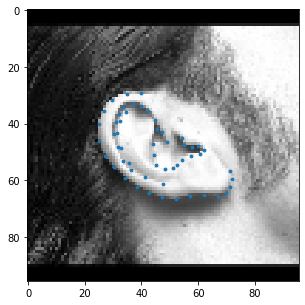

Y_tras: 58 - X_tras: 279
Id_image: 0487
csvfile: train_0487.csv


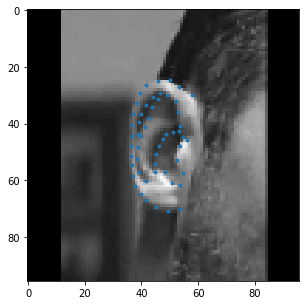

Y_tras: 74 - X_tras: 0
Id_image: 0488
file 0488 has no value translations
csvfile: train_0488.csv


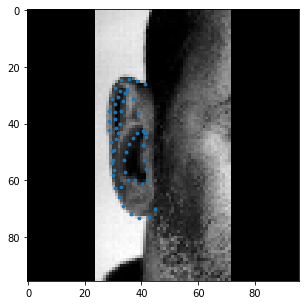

Y_tras: 219 - X_tras: 425
Id_image: 0489
csvfile: train_0489.csv


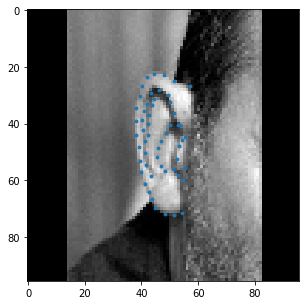

Y_tras: 238 - X_tras: 165
Id_image: 0490
csvfile: train_0490.csv


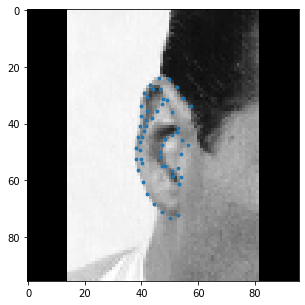

Y_tras: 221 - X_tras: 426
Id_image: 0491
csvfile: train_0491.csv


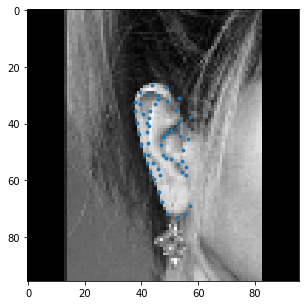

Y_tras: 277 - X_tras: 307
Id_image: 0492
csvfile: train_0492.csv


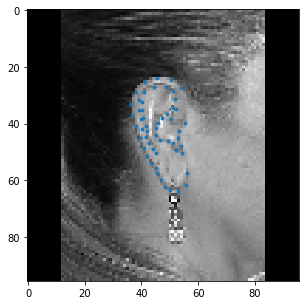

Y_tras: 0 - X_tras: 344
Id_image: 0493
file 0493 has no value translations
csvfile: train_0493.csv


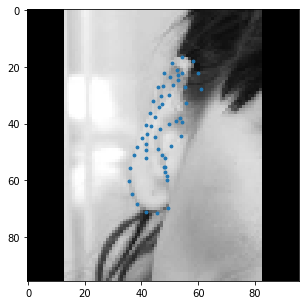

Y_tras: 567 - X_tras: 843
Id_image: 0494
csvfile: train_0494.csv


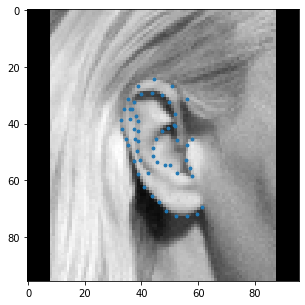

Y_tras: 169 - X_tras: 528
Id_image: 0495
csvfile: train_0495.csv


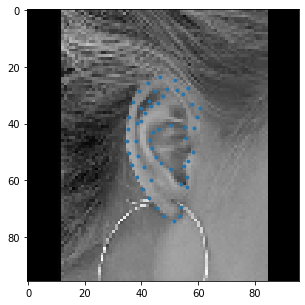

Y_tras: 259 - X_tras: 842
Id_image: 0496
csvfile: train_0496.csv


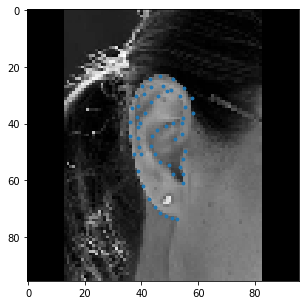

Y_tras: 257 - X_tras: 96
Id_image: 0497
csvfile: train_0497.csv


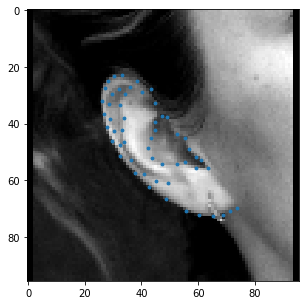

Y_tras: 278 - X_tras: 361
Id_image: 0498
csvfile: train_0498.csv


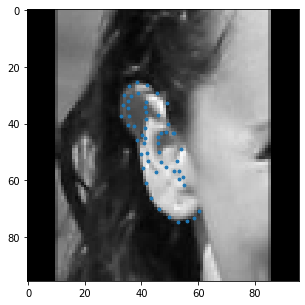

Y_tras: 264 - X_tras: 256
Id_image: 0499
csvfile: train_0499.csv


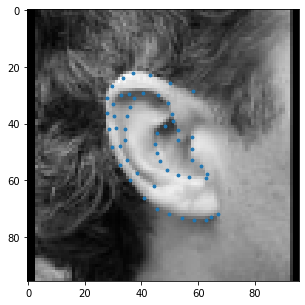

In [4]:
preprocessrois("train_", 96)

## Fail Detection and landmark matching

train: 0003,0010,0055,0142,0290

## Data Augmentation

### Traslation

In [1]:
import os
import skimage
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt

from random import randint, getrandbits
from skimage import io
from glob import glob

ROOT_DIR = os.path.abspath("../../../")
TEST_DIR = os.path.join(ROOT_DIR, "AllDatasets/InTheWildDataset/ROI/train/output/") # test or train files path


In [5]:
def augTranslations (percentage=30, factor = 10):
    #img_size = 96     
    u_files = glob(TEST_DIR+'/*.png') 
    files = sorted(u_files)
    for j in range (0,len(files)):
        #file name should be like this -> 0000.png             
        idimage = files[j][-8:-4]    # get id image from file name
        print("Id_image: {}".format(idimage))
        
        img = io.imread(files[j], as_gray=True) # load image as gray    
        rangeTransX = np.floor(img.shape[1] * percentage/100)
        rangeTransY = np.floor(img.shape[0] * percentage/100)
            
        for i in range (0,factor):                        
            transX = randint(0, rangeTransX) # X translation value
            transY = randint(0, rangeTransY) # Y translation value 
            print("Y_tras: {} - X_tras: {}".format(transY, transX))
                        
            csvfile = files[j][:-4] + '.csv'   
            #print("csvfile: {}".format(csvfile))            
            marks = pd.read_csv(csvfile, sep=',')
            xs = marks['X'].values
            ys = marks['Y'].values
            
            pos_neg = bool(getrandbits(1))
            pos_neg2 = bool(getrandbits(1))
            new_img = np.zeros((img.shape[0], img.shape[1]), dtype=img.dtype)
            new_img2 = np.zeros((img.shape[0], img.shape[1]), dtype=img.dtype)
            if pos_neg: # left trans 
                new_img[:,:img.shape[0]-transX] = img[:, transX:img.shape[0]]
                xs = xs - transX
            else: # right trans
                new_img[:,transX:img.shape[0]] = img[:, :img.shape[0]-transX]
                xs = xs + transX
            if pos_neg2:
                new_img2[:img.shape[1]-transY,:] = new_img[transY:new_img.shape[1],:]
                ys = ys - transY
            else:
                new_img2[transY:img.shape[1],:] = new_img[:new_img.shape[1]-transY,:]
                ys = ys + transY
            
            # Save new image        
            newpngfilename = str(idimage) + "_"+ str(i) + ".png"
            newpngfilename = os.path.join(TEST_DIR, newpngfilename)
            #print("New image: {}".format(newpngfilename))
            plt.imsave(newpngfilename, new_img2, cmap = plt.cm.gray)
            
            newcsvfilename = str(idimage) + "_"+ str(i) + ".csv"
            newcsvfilename = os.path.join(TEST_DIR, newcsvfilename)        
            with open(newcsvfilename, 'w') as csvFile:
                writer = csv.writer(csvFile)
                writer.writerows([['X','Y']])
                for i in range(0,len(xs)):                
                    writer.writerows([[str(xs[i]),str(ys[i])]])
            csvFile.close()

            # Show image  
            if i < 4:
                fig = plt.figure(figsize=(5, 5))
                plt.scatter(xs, ys, s=8)
                imgplot = plt.imshow(new_img2, cmap = plt.cm.gray)
                plt.show()    
           
      

In [6]:
augTranslations(35, 20)

Id_image: 0000
Y_tras: 23 - X_tras: 26
Y_tras: 14 - X_tras: 23
Y_tras: 25 - X_tras: 33
Y_tras: 23 - X_tras: 0
Y_tras: 8 - X_tras: 17
Y_tras: 3 - X_tras: 27
Y_tras: 32 - X_tras: 12
Y_tras: 28 - X_tras: 5
Y_tras: 30 - X_tras: 27
Y_tras: 20 - X_tras: 29
Y_tras: 16 - X_tras: 31
Y_tras: 26 - X_tras: 19
Y_tras: 20 - X_tras: 6
Y_tras: 33 - X_tras: 7
Y_tras: 17 - X_tras: 7
Y_tras: 11 - X_tras: 22
Y_tras: 30 - X_tras: 13
Y_tras: 27 - X_tras: 26
Y_tras: 31 - X_tras: 18
Y_tras: 17 - X_tras: 12
Id_image: 0001
Y_tras: 30 - X_tras: 9
Y_tras: 27 - X_tras: 9
Y_tras: 3 - X_tras: 25
Y_tras: 25 - X_tras: 13
Y_tras: 21 - X_tras: 2
Y_tras: 22 - X_tras: 18
Y_tras: 25 - X_tras: 31
Y_tras: 1 - X_tras: 30
Y_tras: 25 - X_tras: 27
Y_tras: 28 - X_tras: 25
Y_tras: 1 - X_tras: 9
Y_tras: 5 - X_tras: 28
Y_tras: 9 - X_tras: 18
Y_tras: 33 - X_tras: 22
Y_tras: 29 - X_tras: 6
Y_tras: 22 - X_tras: 32
Y_tras: 33 - X_tras: 6
Y_tras: 23 - X_tras: 13
Y_tras: 28 - X_tras: 1
Y_tras: 12 - X_tras: 4
Id_image: 0002
Y_tras: 24 - X_

Y_tras: 13 - X_tras: 20
Y_tras: 27 - X_tras: 16
Y_tras: 8 - X_tras: 29
Y_tras: 5 - X_tras: 18
Y_tras: 5 - X_tras: 7
Y_tras: 31 - X_tras: 0
Y_tras: 0 - X_tras: 2
Y_tras: 27 - X_tras: 8
Y_tras: 5 - X_tras: 31
Y_tras: 29 - X_tras: 7
Y_tras: 18 - X_tras: 29
Id_image: 0020
Y_tras: 11 - X_tras: 28
Y_tras: 7 - X_tras: 29
Y_tras: 18 - X_tras: 12
Y_tras: 26 - X_tras: 18
Y_tras: 14 - X_tras: 4
Y_tras: 5 - X_tras: 13
Y_tras: 22 - X_tras: 4
Y_tras: 22 - X_tras: 17
Y_tras: 16 - X_tras: 21
Y_tras: 19 - X_tras: 4
Y_tras: 31 - X_tras: 16
Y_tras: 9 - X_tras: 11
Y_tras: 24 - X_tras: 21
Y_tras: 25 - X_tras: 3
Y_tras: 1 - X_tras: 32
Y_tras: 32 - X_tras: 14
Y_tras: 13 - X_tras: 18
Y_tras: 27 - X_tras: 14
Y_tras: 26 - X_tras: 14
Y_tras: 13 - X_tras: 22
Id_image: 0021
Y_tras: 28 - X_tras: 8
Y_tras: 24 - X_tras: 6
Y_tras: 6 - X_tras: 22
Y_tras: 7 - X_tras: 0
Y_tras: 8 - X_tras: 4
Y_tras: 14 - X_tras: 31
Y_tras: 21 - X_tras: 12
Y_tras: 8 - X_tras: 29
Y_tras: 19 - X_tras: 14
Y_tras: 27 - X_tras: 23
Y_tras: 4 - 

Y_tras: 19 - X_tras: 28
Y_tras: 0 - X_tras: 20
Y_tras: 5 - X_tras: 20
Y_tras: 17 - X_tras: 7
Y_tras: 1 - X_tras: 24
Y_tras: 8 - X_tras: 4
Y_tras: 29 - X_tras: 18
Y_tras: 14 - X_tras: 21
Y_tras: 16 - X_tras: 3
Y_tras: 7 - X_tras: 10
Y_tras: 14 - X_tras: 10
Y_tras: 30 - X_tras: 28
Y_tras: 17 - X_tras: 18
Y_tras: 11 - X_tras: 9
Y_tras: 12 - X_tras: 0
Y_tras: 1 - X_tras: 10
Y_tras: 17 - X_tras: 28
Y_tras: 18 - X_tras: 0
Id_image: 0038
Y_tras: 33 - X_tras: 25
Y_tras: 4 - X_tras: 9
Y_tras: 22 - X_tras: 2
Y_tras: 11 - X_tras: 29
Y_tras: 0 - X_tras: 21
Y_tras: 11 - X_tras: 6
Y_tras: 23 - X_tras: 1
Y_tras: 6 - X_tras: 4
Y_tras: 6 - X_tras: 8
Y_tras: 4 - X_tras: 2
Y_tras: 12 - X_tras: 3
Y_tras: 22 - X_tras: 19
Y_tras: 29 - X_tras: 27
Y_tras: 17 - X_tras: 0
Y_tras: 33 - X_tras: 28
Y_tras: 29 - X_tras: 23
Y_tras: 28 - X_tras: 32
Y_tras: 5 - X_tras: 12
Y_tras: 3 - X_tras: 23
Y_tras: 26 - X_tras: 26
Id_image: 0039
Y_tras: 30 - X_tras: 33
Y_tras: 30 - X_tras: 6
Y_tras: 13 - X_tras: 14
Y_tras: 1 - X_t

Y_tras: 26 - X_tras: 10
Y_tras: 18 - X_tras: 3
Y_tras: 17 - X_tras: 0
Y_tras: 10 - X_tras: 31
Y_tras: 26 - X_tras: 29
Y_tras: 28 - X_tras: 20
Y_tras: 15 - X_tras: 5
Y_tras: 14 - X_tras: 15
Y_tras: 14 - X_tras: 10
Id_image: 0057
Y_tras: 0 - X_tras: 23
Y_tras: 22 - X_tras: 17
Y_tras: 19 - X_tras: 6
Y_tras: 29 - X_tras: 10
Y_tras: 27 - X_tras: 3
Y_tras: 4 - X_tras: 33
Y_tras: 8 - X_tras: 28
Y_tras: 15 - X_tras: 2
Y_tras: 17 - X_tras: 6
Y_tras: 11 - X_tras: 8
Y_tras: 24 - X_tras: 0
Y_tras: 16 - X_tras: 9
Y_tras: 18 - X_tras: 27
Y_tras: 30 - X_tras: 7
Y_tras: 13 - X_tras: 18
Y_tras: 30 - X_tras: 12
Y_tras: 32 - X_tras: 22
Y_tras: 33 - X_tras: 6
Y_tras: 24 - X_tras: 20
Y_tras: 9 - X_tras: 29
Id_image: 0058
Y_tras: 11 - X_tras: 3
Y_tras: 30 - X_tras: 0
Y_tras: 26 - X_tras: 12
Y_tras: 0 - X_tras: 15
Y_tras: 19 - X_tras: 13
Y_tras: 26 - X_tras: 21
Y_tras: 22 - X_tras: 32
Y_tras: 23 - X_tras: 0
Y_tras: 26 - X_tras: 10
Y_tras: 12 - X_tras: 15
Y_tras: 3 - X_tras: 13
Y_tras: 19 - X_tras: 25
Y_tras:

Y_tras: 16 - X_tras: 26
Y_tras: 12 - X_tras: 29
Y_tras: 8 - X_tras: 5
Y_tras: 7 - X_tras: 14
Y_tras: 2 - X_tras: 7
Y_tras: 7 - X_tras: 10
Y_tras: 25 - X_tras: 6
Y_tras: 25 - X_tras: 21
Y_tras: 28 - X_tras: 25
Y_tras: 30 - X_tras: 13
Id_image: 0076
Y_tras: 14 - X_tras: 27
Y_tras: 30 - X_tras: 13
Y_tras: 28 - X_tras: 25
Y_tras: 6 - X_tras: 16
Y_tras: 32 - X_tras: 8
Y_tras: 6 - X_tras: 16
Y_tras: 3 - X_tras: 25
Y_tras: 17 - X_tras: 1
Y_tras: 16 - X_tras: 8
Y_tras: 9 - X_tras: 4
Y_tras: 8 - X_tras: 4
Y_tras: 14 - X_tras: 22
Y_tras: 11 - X_tras: 20
Y_tras: 32 - X_tras: 8
Y_tras: 25 - X_tras: 15
Y_tras: 18 - X_tras: 26
Y_tras: 2 - X_tras: 29
Y_tras: 15 - X_tras: 5
Y_tras: 18 - X_tras: 7
Y_tras: 12 - X_tras: 6
Id_image: 0077
Y_tras: 27 - X_tras: 9
Y_tras: 21 - X_tras: 18
Y_tras: 13 - X_tras: 13
Y_tras: 6 - X_tras: 31
Y_tras: 22 - X_tras: 4
Y_tras: 32 - X_tras: 24
Y_tras: 30 - X_tras: 14
Y_tras: 20 - X_tras: 33
Y_tras: 25 - X_tras: 8
Y_tras: 13 - X_tras: 21
Y_tras: 15 - X_tras: 0
Y_tras: 32 - 

Y_tras: 17 - X_tras: 25
Y_tras: 2 - X_tras: 29
Y_tras: 16 - X_tras: 12
Y_tras: 5 - X_tras: 25
Y_tras: 33 - X_tras: 17
Y_tras: 2 - X_tras: 10
Y_tras: 23 - X_tras: 16
Y_tras: 1 - X_tras: 9
Y_tras: 7 - X_tras: 32
Id_image: 0095
Y_tras: 2 - X_tras: 29
Y_tras: 27 - X_tras: 15
Y_tras: 33 - X_tras: 0
Y_tras: 28 - X_tras: 13
Y_tras: 18 - X_tras: 16
Y_tras: 15 - X_tras: 29
Y_tras: 4 - X_tras: 8
Y_tras: 18 - X_tras: 13
Y_tras: 0 - X_tras: 24
Y_tras: 14 - X_tras: 8
Y_tras: 18 - X_tras: 20
Y_tras: 6 - X_tras: 33
Y_tras: 24 - X_tras: 10
Y_tras: 24 - X_tras: 13
Y_tras: 3 - X_tras: 10
Y_tras: 26 - X_tras: 28
Y_tras: 30 - X_tras: 25
Y_tras: 21 - X_tras: 30
Y_tras: 7 - X_tras: 10
Y_tras: 24 - X_tras: 19
Id_image: 0096
Y_tras: 2 - X_tras: 1
Y_tras: 32 - X_tras: 9
Y_tras: 8 - X_tras: 16
Y_tras: 3 - X_tras: 16
Y_tras: 32 - X_tras: 25
Y_tras: 33 - X_tras: 30
Y_tras: 26 - X_tras: 1
Y_tras: 28 - X_tras: 25
Y_tras: 18 - X_tras: 25
Y_tras: 21 - X_tras: 28
Y_tras: 11 - X_tras: 16
Y_tras: 29 - X_tras: 26
Y_tras:

Y_tras: 15 - X_tras: 27
Y_tras: 8 - X_tras: 0
Y_tras: 28 - X_tras: 0
Y_tras: 25 - X_tras: 12
Id_image: 0113
Y_tras: 15 - X_tras: 6
Y_tras: 32 - X_tras: 21
Y_tras: 28 - X_tras: 0
Y_tras: 31 - X_tras: 28
Y_tras: 5 - X_tras: 25
Y_tras: 6 - X_tras: 26
Y_tras: 21 - X_tras: 1
Y_tras: 26 - X_tras: 15
Y_tras: 33 - X_tras: 16
Y_tras: 2 - X_tras: 28
Y_tras: 10 - X_tras: 20
Y_tras: 20 - X_tras: 32
Y_tras: 1 - X_tras: 26
Y_tras: 24 - X_tras: 5
Y_tras: 19 - X_tras: 17
Y_tras: 29 - X_tras: 25
Y_tras: 3 - X_tras: 20
Y_tras: 27 - X_tras: 19
Y_tras: 6 - X_tras: 4
Y_tras: 32 - X_tras: 32
Id_image: 0114
Y_tras: 11 - X_tras: 24
Y_tras: 31 - X_tras: 3
Y_tras: 4 - X_tras: 5
Y_tras: 22 - X_tras: 13
Y_tras: 31 - X_tras: 25
Y_tras: 5 - X_tras: 17
Y_tras: 25 - X_tras: 14
Y_tras: 1 - X_tras: 22
Y_tras: 15 - X_tras: 29
Y_tras: 1 - X_tras: 27
Y_tras: 9 - X_tras: 20
Y_tras: 8 - X_tras: 2
Y_tras: 19 - X_tras: 2
Y_tras: 12 - X_tras: 25
Y_tras: 26 - X_tras: 13
Y_tras: 3 - X_tras: 23
Y_tras: 9 - X_tras: 20
Y_tras: 1 - 

Y_tras: 32 - X_tras: 21
Y_tras: 27 - X_tras: 15
Y_tras: 25 - X_tras: 28
Y_tras: 13 - X_tras: 16
Y_tras: 6 - X_tras: 20
Y_tras: 20 - X_tras: 25
Y_tras: 6 - X_tras: 33
Y_tras: 21 - X_tras: 30
Id_image: 0131
Y_tras: 25 - X_tras: 24
Y_tras: 33 - X_tras: 33
Y_tras: 19 - X_tras: 18
Y_tras: 31 - X_tras: 10
Y_tras: 28 - X_tras: 13
Y_tras: 19 - X_tras: 17
Y_tras: 25 - X_tras: 11
Y_tras: 1 - X_tras: 8
Y_tras: 27 - X_tras: 2
Y_tras: 1 - X_tras: 22
Y_tras: 25 - X_tras: 29
Y_tras: 8 - X_tras: 10
Y_tras: 27 - X_tras: 25
Y_tras: 27 - X_tras: 26
Y_tras: 32 - X_tras: 27
Y_tras: 6 - X_tras: 33
Y_tras: 23 - X_tras: 5
Y_tras: 5 - X_tras: 31
Y_tras: 25 - X_tras: 11
Y_tras: 26 - X_tras: 7
Id_image: 0132
Y_tras: 9 - X_tras: 33
Y_tras: 7 - X_tras: 16
Y_tras: 21 - X_tras: 10
Y_tras: 17 - X_tras: 28
Y_tras: 23 - X_tras: 29
Y_tras: 21 - X_tras: 8
Y_tras: 15 - X_tras: 32
Y_tras: 16 - X_tras: 0
Y_tras: 14 - X_tras: 27
Y_tras: 14 - X_tras: 32
Y_tras: 18 - X_tras: 33
Y_tras: 19 - X_tras: 8
Y_tras: 17 - X_tras: 7
Y_t

Y_tras: 20 - X_tras: 27
Y_tras: 11 - X_tras: 13
Y_tras: 17 - X_tras: 8
Y_tras: 2 - X_tras: 26
Y_tras: 14 - X_tras: 5
Y_tras: 19 - X_tras: 15
Y_tras: 14 - X_tras: 7
Y_tras: 21 - X_tras: 18
Y_tras: 10 - X_tras: 27
Y_tras: 7 - X_tras: 30
Y_tras: 25 - X_tras: 15
Y_tras: 24 - X_tras: 10
Y_tras: 1 - X_tras: 20
Y_tras: 24 - X_tras: 33
Id_image: 0151
Y_tras: 19 - X_tras: 24
Y_tras: 0 - X_tras: 26
Y_tras: 22 - X_tras: 32
Y_tras: 5 - X_tras: 14
Y_tras: 12 - X_tras: 26
Y_tras: 30 - X_tras: 26
Y_tras: 5 - X_tras: 18
Y_tras: 18 - X_tras: 28
Y_tras: 30 - X_tras: 10
Y_tras: 14 - X_tras: 6
Y_tras: 5 - X_tras: 13
Y_tras: 32 - X_tras: 23
Y_tras: 14 - X_tras: 8
Y_tras: 17 - X_tras: 26
Y_tras: 13 - X_tras: 29
Y_tras: 22 - X_tras: 26
Y_tras: 23 - X_tras: 25
Y_tras: 26 - X_tras: 21
Y_tras: 20 - X_tras: 29
Y_tras: 22 - X_tras: 5
Id_image: 0152
Y_tras: 18 - X_tras: 3
Y_tras: 8 - X_tras: 33
Y_tras: 26 - X_tras: 22
Y_tras: 11 - X_tras: 7
Y_tras: 5 - X_tras: 6
Y_tras: 10 - X_tras: 6
Y_tras: 20 - X_tras: 23
Y_tra

Y_tras: 19 - X_tras: 16
Y_tras: 5 - X_tras: 15
Y_tras: 28 - X_tras: 13
Y_tras: 24 - X_tras: 29
Id_image: 0168
Y_tras: 15 - X_tras: 11
Y_tras: 21 - X_tras: 2
Y_tras: 26 - X_tras: 23
Y_tras: 6 - X_tras: 10
Y_tras: 5 - X_tras: 26
Y_tras: 29 - X_tras: 23
Y_tras: 3 - X_tras: 21
Y_tras: 22 - X_tras: 20
Y_tras: 33 - X_tras: 21
Y_tras: 12 - X_tras: 15
Y_tras: 1 - X_tras: 7
Y_tras: 31 - X_tras: 20
Y_tras: 28 - X_tras: 26
Y_tras: 2 - X_tras: 19
Y_tras: 27 - X_tras: 7
Y_tras: 19 - X_tras: 27
Y_tras: 23 - X_tras: 30
Y_tras: 14 - X_tras: 33
Y_tras: 9 - X_tras: 22
Y_tras: 0 - X_tras: 4
Id_image: 0169
Y_tras: 21 - X_tras: 13
Y_tras: 17 - X_tras: 18
Y_tras: 11 - X_tras: 8
Y_tras: 23 - X_tras: 3
Y_tras: 21 - X_tras: 24
Y_tras: 18 - X_tras: 2
Y_tras: 31 - X_tras: 14
Y_tras: 1 - X_tras: 2
Y_tras: 2 - X_tras: 0
Y_tras: 27 - X_tras: 23
Y_tras: 15 - X_tras: 27
Y_tras: 4 - X_tras: 16
Y_tras: 6 - X_tras: 4
Y_tras: 27 - X_tras: 11
Y_tras: 11 - X_tras: 22
Y_tras: 10 - X_tras: 26
Y_tras: 31 - X_tras: 33
Y_tras: 

Y_tras: 16 - X_tras: 31
Y_tras: 8 - X_tras: 26
Y_tras: 15 - X_tras: 20
Y_tras: 33 - X_tras: 20
Y_tras: 9 - X_tras: 23
Y_tras: 29 - X_tras: 0
Y_tras: 14 - X_tras: 24
Y_tras: 27 - X_tras: 19
Y_tras: 23 - X_tras: 19
Y_tras: 12 - X_tras: 5
Y_tras: 10 - X_tras: 0
Y_tras: 9 - X_tras: 18
Y_tras: 32 - X_tras: 31
Y_tras: 23 - X_tras: 18
Y_tras: 29 - X_tras: 1
Y_tras: 23 - X_tras: 10
Y_tras: 16 - X_tras: 32
Id_image: 0188
Y_tras: 5 - X_tras: 26
Y_tras: 22 - X_tras: 5
Y_tras: 1 - X_tras: 26
Y_tras: 1 - X_tras: 19
Y_tras: 3 - X_tras: 23
Y_tras: 12 - X_tras: 21
Y_tras: 29 - X_tras: 1
Y_tras: 2 - X_tras: 29
Y_tras: 15 - X_tras: 19
Y_tras: 29 - X_tras: 28
Y_tras: 17 - X_tras: 9
Y_tras: 1 - X_tras: 1
Y_tras: 10 - X_tras: 0
Y_tras: 3 - X_tras: 30
Y_tras: 27 - X_tras: 27
Y_tras: 31 - X_tras: 28
Y_tras: 31 - X_tras: 16
Y_tras: 33 - X_tras: 24
Y_tras: 33 - X_tras: 20
Y_tras: 29 - X_tras: 11
Id_image: 0189
Y_tras: 5 - X_tras: 30
Y_tras: 30 - X_tras: 21
Y_tras: 28 - X_tras: 5
Y_tras: 6 - X_tras: 9
Y_tras: 1

Y_tras: 19 - X_tras: 25
Y_tras: 16 - X_tras: 32
Y_tras: 19 - X_tras: 19
Y_tras: 18 - X_tras: 33
Y_tras: 14 - X_tras: 17
Y_tras: 32 - X_tras: 26
Y_tras: 31 - X_tras: 26
Id_image: 0206
Y_tras: 20 - X_tras: 27
Y_tras: 2 - X_tras: 8
Y_tras: 2 - X_tras: 8
Y_tras: 18 - X_tras: 1
Y_tras: 2 - X_tras: 22
Y_tras: 25 - X_tras: 26
Y_tras: 20 - X_tras: 12
Y_tras: 23 - X_tras: 23
Y_tras: 28 - X_tras: 18
Y_tras: 32 - X_tras: 17
Y_tras: 22 - X_tras: 6
Y_tras: 5 - X_tras: 22
Y_tras: 27 - X_tras: 1
Y_tras: 4 - X_tras: 26
Y_tras: 4 - X_tras: 12
Y_tras: 9 - X_tras: 10
Y_tras: 27 - X_tras: 14
Y_tras: 29 - X_tras: 32
Y_tras: 13 - X_tras: 2
Y_tras: 18 - X_tras: 3
Id_image: 0207
Y_tras: 2 - X_tras: 32
Y_tras: 4 - X_tras: 6
Y_tras: 1 - X_tras: 8
Y_tras: 27 - X_tras: 25
Y_tras: 24 - X_tras: 31
Y_tras: 33 - X_tras: 22
Y_tras: 4 - X_tras: 33
Y_tras: 21 - X_tras: 10
Y_tras: 31 - X_tras: 10
Y_tras: 15 - X_tras: 9
Y_tras: 7 - X_tras: 19
Y_tras: 18 - X_tras: 22
Y_tras: 0 - X_tras: 15
Y_tras: 25 - X_tras: 25
Y_tras: 3

Y_tras: 19 - X_tras: 3
Y_tras: 16 - X_tras: 24
Y_tras: 6 - X_tras: 21
Y_tras: 33 - X_tras: 10
Y_tras: 32 - X_tras: 30
Y_tras: 4 - X_tras: 5
Y_tras: 28 - X_tras: 27
Y_tras: 0 - X_tras: 19
Y_tras: 14 - X_tras: 2
Y_tras: 32 - X_tras: 9
Y_tras: 17 - X_tras: 26
Id_image: 0225
Y_tras: 6 - X_tras: 20
Y_tras: 11 - X_tras: 11
Y_tras: 17 - X_tras: 29
Y_tras: 14 - X_tras: 3
Y_tras: 20 - X_tras: 28
Y_tras: 33 - X_tras: 14
Y_tras: 6 - X_tras: 15
Y_tras: 16 - X_tras: 14
Y_tras: 30 - X_tras: 3
Y_tras: 18 - X_tras: 4
Y_tras: 25 - X_tras: 0
Y_tras: 24 - X_tras: 20
Y_tras: 33 - X_tras: 31
Y_tras: 24 - X_tras: 4
Y_tras: 15 - X_tras: 2
Y_tras: 5 - X_tras: 8
Y_tras: 32 - X_tras: 21
Y_tras: 27 - X_tras: 16
Y_tras: 6 - X_tras: 10
Y_tras: 15 - X_tras: 32
Id_image: 0226
Y_tras: 5 - X_tras: 29
Y_tras: 29 - X_tras: 32
Y_tras: 6 - X_tras: 17
Y_tras: 30 - X_tras: 18
Y_tras: 22 - X_tras: 25
Y_tras: 19 - X_tras: 32
Y_tras: 27 - X_tras: 29
Y_tras: 28 - X_tras: 14
Y_tras: 27 - X_tras: 28
Y_tras: 31 - X_tras: 28
Y_tras

Y_tras: 19 - X_tras: 11
Y_tras: 5 - X_tras: 6
Y_tras: 16 - X_tras: 17
Y_tras: 17 - X_tras: 13
Y_tras: 20 - X_tras: 6
Y_tras: 19 - X_tras: 16
Id_image: 0243
Y_tras: 13 - X_tras: 7
Y_tras: 0 - X_tras: 1
Y_tras: 14 - X_tras: 22
Y_tras: 29 - X_tras: 18
Y_tras: 12 - X_tras: 23
Y_tras: 26 - X_tras: 4
Y_tras: 28 - X_tras: 13
Y_tras: 29 - X_tras: 18
Y_tras: 19 - X_tras: 11
Y_tras: 32 - X_tras: 3
Y_tras: 8 - X_tras: 21
Y_tras: 4 - X_tras: 18
Y_tras: 6 - X_tras: 6
Y_tras: 9 - X_tras: 0
Y_tras: 14 - X_tras: 21
Y_tras: 21 - X_tras: 19
Y_tras: 26 - X_tras: 5
Y_tras: 11 - X_tras: 12
Y_tras: 16 - X_tras: 30
Y_tras: 7 - X_tras: 9
Id_image: 0244
Y_tras: 16 - X_tras: 30
Y_tras: 17 - X_tras: 19
Y_tras: 23 - X_tras: 0
Y_tras: 25 - X_tras: 2
Y_tras: 17 - X_tras: 13
Y_tras: 11 - X_tras: 0
Y_tras: 13 - X_tras: 19
Y_tras: 9 - X_tras: 8
Y_tras: 1 - X_tras: 24
Y_tras: 11 - X_tras: 7
Y_tras: 19 - X_tras: 22
Y_tras: 11 - X_tras: 18
Y_tras: 29 - X_tras: 11
Y_tras: 9 - X_tras: 29
Y_tras: 3 - X_tras: 24
Y_tras: 32 -

Y_tras: 25 - X_tras: 25
Y_tras: 29 - X_tras: 26
Y_tras: 18 - X_tras: 3
Y_tras: 2 - X_tras: 4
Y_tras: 10 - X_tras: 2
Y_tras: 17 - X_tras: 8
Y_tras: 20 - X_tras: 3
Y_tras: 32 - X_tras: 14
Y_tras: 21 - X_tras: 27
Y_tras: 8 - X_tras: 21
Y_tras: 9 - X_tras: 18
Id_image: 0261
Y_tras: 8 - X_tras: 22
Y_tras: 11 - X_tras: 28
Y_tras: 30 - X_tras: 27
Y_tras: 6 - X_tras: 33
Y_tras: 5 - X_tras: 17
Y_tras: 20 - X_tras: 1
Y_tras: 11 - X_tras: 5
Y_tras: 2 - X_tras: 30
Y_tras: 32 - X_tras: 30
Y_tras: 15 - X_tras: 22
Y_tras: 20 - X_tras: 10
Y_tras: 3 - X_tras: 27
Y_tras: 18 - X_tras: 17
Y_tras: 10 - X_tras: 7
Y_tras: 27 - X_tras: 2
Y_tras: 7 - X_tras: 14
Y_tras: 11 - X_tras: 11
Y_tras: 2 - X_tras: 2
Y_tras: 19 - X_tras: 23
Y_tras: 8 - X_tras: 14
Id_image: 0262
Y_tras: 2 - X_tras: 15
Y_tras: 2 - X_tras: 10
Y_tras: 13 - X_tras: 26
Y_tras: 16 - X_tras: 13
Y_tras: 15 - X_tras: 0
Y_tras: 3 - X_tras: 25
Y_tras: 30 - X_tras: 19
Y_tras: 17 - X_tras: 14
Y_tras: 22 - X_tras: 5
Y_tras: 26 - X_tras: 10
Y_tras: 1 - 

Y_tras: 10 - X_tras: 25
Y_tras: 32 - X_tras: 28
Y_tras: 26 - X_tras: 7
Y_tras: 11 - X_tras: 2
Y_tras: 21 - X_tras: 2
Y_tras: 9 - X_tras: 27
Id_image: 0279
Y_tras: 0 - X_tras: 33
Y_tras: 23 - X_tras: 18
Y_tras: 31 - X_tras: 0
Y_tras: 15 - X_tras: 10
Y_tras: 9 - X_tras: 33
Y_tras: 8 - X_tras: 22
Y_tras: 6 - X_tras: 29
Y_tras: 12 - X_tras: 14
Y_tras: 23 - X_tras: 4
Y_tras: 27 - X_tras: 30
Y_tras: 7 - X_tras: 8
Y_tras: 14 - X_tras: 1
Y_tras: 3 - X_tras: 25
Y_tras: 15 - X_tras: 0
Y_tras: 14 - X_tras: 10
Y_tras: 19 - X_tras: 32
Y_tras: 7 - X_tras: 33
Y_tras: 9 - X_tras: 16
Y_tras: 19 - X_tras: 23
Y_tras: 3 - X_tras: 7
Id_image: 0280
Y_tras: 33 - X_tras: 2
Y_tras: 14 - X_tras: 2
Y_tras: 10 - X_tras: 9
Y_tras: 24 - X_tras: 24
Y_tras: 24 - X_tras: 32
Y_tras: 1 - X_tras: 8
Y_tras: 31 - X_tras: 28
Y_tras: 20 - X_tras: 1
Y_tras: 3 - X_tras: 26
Y_tras: 0 - X_tras: 27
Y_tras: 30 - X_tras: 32
Y_tras: 8 - X_tras: 28
Y_tras: 21 - X_tras: 25
Y_tras: 13 - X_tras: 5
Y_tras: 22 - X_tras: 22
Y_tras: 32 - X_

Y_tras: 6 - X_tras: 22
Id_image: 0298
Y_tras: 13 - X_tras: 4
Y_tras: 10 - X_tras: 14
Y_tras: 23 - X_tras: 1
Y_tras: 7 - X_tras: 7
Y_tras: 8 - X_tras: 18
Y_tras: 3 - X_tras: 7
Y_tras: 10 - X_tras: 8
Y_tras: 31 - X_tras: 15
Y_tras: 30 - X_tras: 28
Y_tras: 29 - X_tras: 27
Y_tras: 27 - X_tras: 14
Y_tras: 32 - X_tras: 5
Y_tras: 20 - X_tras: 5
Y_tras: 14 - X_tras: 15
Y_tras: 23 - X_tras: 0
Y_tras: 28 - X_tras: 2
Y_tras: 24 - X_tras: 26
Y_tras: 27 - X_tras: 31
Y_tras: 32 - X_tras: 19
Y_tras: 29 - X_tras: 6
Id_image: 0299
Y_tras: 17 - X_tras: 24
Y_tras: 2 - X_tras: 10
Y_tras: 28 - X_tras: 25
Y_tras: 2 - X_tras: 0
Y_tras: 7 - X_tras: 5
Y_tras: 13 - X_tras: 30
Y_tras: 25 - X_tras: 33
Y_tras: 6 - X_tras: 27
Y_tras: 28 - X_tras: 2
Y_tras: 19 - X_tras: 12
Y_tras: 19 - X_tras: 22
Y_tras: 29 - X_tras: 24
Y_tras: 11 - X_tras: 21
Y_tras: 13 - X_tras: 9
Y_tras: 17 - X_tras: 28
Y_tras: 22 - X_tras: 17
Y_tras: 13 - X_tras: 10
Y_tras: 17 - X_tras: 1
Y_tras: 11 - X_tras: 3
Y_tras: 6 - X_tras: 14
Id_image: 0

Y_tras: 24 - X_tras: 14
Y_tras: 2 - X_tras: 33
Y_tras: 11 - X_tras: 15
Y_tras: 6 - X_tras: 30
Y_tras: 9 - X_tras: 20
Id_image: 0316
Y_tras: 32 - X_tras: 16
Y_tras: 8 - X_tras: 28
Y_tras: 16 - X_tras: 8
Y_tras: 2 - X_tras: 30
Y_tras: 25 - X_tras: 16
Y_tras: 28 - X_tras: 25
Y_tras: 32 - X_tras: 1
Y_tras: 18 - X_tras: 8
Y_tras: 31 - X_tras: 6
Y_tras: 18 - X_tras: 18
Y_tras: 18 - X_tras: 2
Y_tras: 26 - X_tras: 22
Y_tras: 5 - X_tras: 0
Y_tras: 23 - X_tras: 2
Y_tras: 24 - X_tras: 26
Y_tras: 0 - X_tras: 7
Y_tras: 1 - X_tras: 26
Y_tras: 7 - X_tras: 25
Y_tras: 10 - X_tras: 16
Y_tras: 5 - X_tras: 20
Id_image: 0317
Y_tras: 7 - X_tras: 17
Y_tras: 18 - X_tras: 1
Y_tras: 2 - X_tras: 14
Y_tras: 8 - X_tras: 11
Y_tras: 27 - X_tras: 32
Y_tras: 25 - X_tras: 24
Y_tras: 32 - X_tras: 24
Y_tras: 25 - X_tras: 22
Y_tras: 18 - X_tras: 11
Y_tras: 4 - X_tras: 17
Y_tras: 31 - X_tras: 20
Y_tras: 6 - X_tras: 1
Y_tras: 7 - X_tras: 10
Y_tras: 24 - X_tras: 7
Y_tras: 9 - X_tras: 18
Y_tras: 18 - X_tras: 30
Y_tras: 2 - X_

Y_tras: 24 - X_tras: 31
Y_tras: 28 - X_tras: 1
Y_tras: 21 - X_tras: 16
Id_image: 0337
Y_tras: 12 - X_tras: 25
Y_tras: 17 - X_tras: 1
Y_tras: 9 - X_tras: 2
Y_tras: 31 - X_tras: 8
Y_tras: 16 - X_tras: 23
Y_tras: 6 - X_tras: 7
Y_tras: 30 - X_tras: 19
Y_tras: 12 - X_tras: 33
Y_tras: 11 - X_tras: 1
Y_tras: 28 - X_tras: 3
Y_tras: 29 - X_tras: 21
Y_tras: 30 - X_tras: 10
Y_tras: 0 - X_tras: 9
Y_tras: 3 - X_tras: 15
Y_tras: 11 - X_tras: 22
Y_tras: 22 - X_tras: 32
Y_tras: 32 - X_tras: 12
Y_tras: 21 - X_tras: 16
Y_tras: 32 - X_tras: 22
Y_tras: 19 - X_tras: 22
Id_image: 0338
Y_tras: 28 - X_tras: 15
Y_tras: 32 - X_tras: 16
Y_tras: 7 - X_tras: 4
Y_tras: 10 - X_tras: 16
Y_tras: 1 - X_tras: 11
Y_tras: 20 - X_tras: 27
Y_tras: 26 - X_tras: 18
Y_tras: 33 - X_tras: 7
Y_tras: 14 - X_tras: 5
Y_tras: 3 - X_tras: 10
Y_tras: 13 - X_tras: 32
Y_tras: 26 - X_tras: 17
Y_tras: 17 - X_tras: 1
Y_tras: 6 - X_tras: 31
Y_tras: 33 - X_tras: 7
Y_tras: 25 - X_tras: 10
Y_tras: 23 - X_tras: 8
Y_tras: 31 - X_tras: 6
Y_tras: 1

Id_image: 0356
Y_tras: 16 - X_tras: 6
Y_tras: 20 - X_tras: 17
Y_tras: 6 - X_tras: 15
Y_tras: 24 - X_tras: 0
Y_tras: 14 - X_tras: 27
Y_tras: 27 - X_tras: 5
Y_tras: 28 - X_tras: 18
Y_tras: 20 - X_tras: 5
Y_tras: 2 - X_tras: 30
Y_tras: 10 - X_tras: 8
Y_tras: 8 - X_tras: 29
Y_tras: 10 - X_tras: 8
Y_tras: 14 - X_tras: 20
Y_tras: 13 - X_tras: 5
Y_tras: 23 - X_tras: 18
Y_tras: 19 - X_tras: 26
Y_tras: 4 - X_tras: 14
Y_tras: 33 - X_tras: 24
Y_tras: 3 - X_tras: 26
Y_tras: 1 - X_tras: 18
Id_image: 0357
Y_tras: 5 - X_tras: 17
Y_tras: 7 - X_tras: 16
Y_tras: 19 - X_tras: 12
Y_tras: 12 - X_tras: 24
Y_tras: 1 - X_tras: 1
Y_tras: 13 - X_tras: 5
Y_tras: 33 - X_tras: 1
Y_tras: 4 - X_tras: 14
Y_tras: 21 - X_tras: 7
Y_tras: 33 - X_tras: 14
Y_tras: 5 - X_tras: 23
Y_tras: 2 - X_tras: 0
Y_tras: 12 - X_tras: 11
Y_tras: 10 - X_tras: 25
Y_tras: 24 - X_tras: 20
Y_tras: 15 - X_tras: 13
Y_tras: 24 - X_tras: 20
Y_tras: 22 - X_tras: 33
Y_tras: 11 - X_tras: 13
Y_tras: 0 - X_tras: 12
Id_image: 0358
Y_tras: 22 - X_tras:

Y_tras: 5 - X_tras: 25
Y_tras: 28 - X_tras: 28
Y_tras: 33 - X_tras: 27
Y_tras: 25 - X_tras: 30
Y_tras: 7 - X_tras: 1
Y_tras: 4 - X_tras: 8
Y_tras: 2 - X_tras: 28
Y_tras: 3 - X_tras: 1
Y_tras: 21 - X_tras: 14
Y_tras: 5 - X_tras: 32
Y_tras: 11 - X_tras: 9
Y_tras: 9 - X_tras: 14
Y_tras: 11 - X_tras: 28
Y_tras: 31 - X_tras: 3
Y_tras: 2 - X_tras: 16
Y_tras: 7 - X_tras: 27
Y_tras: 4 - X_tras: 8
Y_tras: 18 - X_tras: 33
Y_tras: 3 - X_tras: 8
Y_tras: 10 - X_tras: 19
Id_image: 0377
Y_tras: 5 - X_tras: 10
Y_tras: 9 - X_tras: 19
Y_tras: 30 - X_tras: 21
Y_tras: 26 - X_tras: 27
Y_tras: 19 - X_tras: 15
Y_tras: 2 - X_tras: 22
Y_tras: 2 - X_tras: 14
Y_tras: 29 - X_tras: 5
Y_tras: 20 - X_tras: 16
Y_tras: 1 - X_tras: 24
Y_tras: 18 - X_tras: 26
Y_tras: 22 - X_tras: 22
Y_tras: 4 - X_tras: 5
Y_tras: 27 - X_tras: 17
Y_tras: 12 - X_tras: 14
Y_tras: 1 - X_tras: 4
Y_tras: 15 - X_tras: 27
Y_tras: 18 - X_tras: 20
Y_tras: 0 - X_tras: 22
Y_tras: 4 - X_tras: 1
Id_image: 0378
Y_tras: 28 - X_tras: 15
Y_tras: 22 - X_tr

Y_tras: 9 - X_tras: 1
Y_tras: 20 - X_tras: 14
Y_tras: 33 - X_tras: 4
Y_tras: 22 - X_tras: 19
Y_tras: 0 - X_tras: 21
Y_tras: 3 - X_tras: 16
Y_tras: 9 - X_tras: 27
Y_tras: 27 - X_tras: 4
Y_tras: 26 - X_tras: 10
Y_tras: 3 - X_tras: 11
Y_tras: 27 - X_tras: 22
Y_tras: 1 - X_tras: 31
Y_tras: 15 - X_tras: 30
Y_tras: 4 - X_tras: 22
Y_tras: 21 - X_tras: 19
Id_image: 0394
Y_tras: 24 - X_tras: 30
Y_tras: 8 - X_tras: 14
Y_tras: 12 - X_tras: 1
Y_tras: 17 - X_tras: 20
Y_tras: 18 - X_tras: 27
Y_tras: 5 - X_tras: 2
Y_tras: 5 - X_tras: 21
Y_tras: 14 - X_tras: 25
Y_tras: 24 - X_tras: 30
Y_tras: 31 - X_tras: 1
Y_tras: 23 - X_tras: 26
Y_tras: 16 - X_tras: 18
Y_tras: 9 - X_tras: 25
Y_tras: 10 - X_tras: 16
Y_tras: 24 - X_tras: 22
Y_tras: 5 - X_tras: 2
Y_tras: 31 - X_tras: 15
Y_tras: 13 - X_tras: 12
Y_tras: 15 - X_tras: 16
Y_tras: 4 - X_tras: 27
Id_image: 0395
Y_tras: 22 - X_tras: 1
Y_tras: 22 - X_tras: 29
Y_tras: 23 - X_tras: 8
Y_tras: 5 - X_tras: 0
Y_tras: 15 - X_tras: 21
Y_tras: 22 - X_tras: 21
Y_tras: 23

Y_tras: 10 - X_tras: 14
Y_tras: 2 - X_tras: 24
Y_tras: 6 - X_tras: 32
Y_tras: 12 - X_tras: 32
Y_tras: 24 - X_tras: 31
Y_tras: 22 - X_tras: 8
Id_image: 0411
Y_tras: 27 - X_tras: 0
Y_tras: 18 - X_tras: 11
Y_tras: 20 - X_tras: 14
Y_tras: 18 - X_tras: 13
Y_tras: 0 - X_tras: 30
Y_tras: 25 - X_tras: 25
Y_tras: 12 - X_tras: 16
Y_tras: 13 - X_tras: 10
Y_tras: 17 - X_tras: 23
Y_tras: 14 - X_tras: 18
Y_tras: 23 - X_tras: 4
Y_tras: 2 - X_tras: 26
Y_tras: 23 - X_tras: 28
Y_tras: 5 - X_tras: 4
Y_tras: 24 - X_tras: 28
Y_tras: 23 - X_tras: 0
Y_tras: 1 - X_tras: 26
Y_tras: 5 - X_tras: 12
Y_tras: 18 - X_tras: 1
Y_tras: 33 - X_tras: 27
Id_image: 0412
Y_tras: 18 - X_tras: 8
Y_tras: 4 - X_tras: 0
Y_tras: 17 - X_tras: 23
Y_tras: 3 - X_tras: 30
Y_tras: 12 - X_tras: 30
Y_tras: 1 - X_tras: 15
Y_tras: 6 - X_tras: 17
Y_tras: 1 - X_tras: 11
Y_tras: 16 - X_tras: 4
Y_tras: 24 - X_tras: 16
Y_tras: 12 - X_tras: 33
Y_tras: 12 - X_tras: 24
Y_tras: 14 - X_tras: 2
Y_tras: 7 - X_tras: 16
Y_tras: 30 - X_tras: 4
Y_tras: 3 

Y_tras: 4 - X_tras: 1
Y_tras: 15 - X_tras: 15
Y_tras: 12 - X_tras: 31
Y_tras: 11 - X_tras: 1
Y_tras: 33 - X_tras: 19
Y_tras: 27 - X_tras: 6
Y_tras: 10 - X_tras: 28
Y_tras: 27 - X_tras: 14
Y_tras: 9 - X_tras: 0
Y_tras: 13 - X_tras: 18
Y_tras: 9 - X_tras: 24
Y_tras: 29 - X_tras: 0
Y_tras: 29 - X_tras: 8
Y_tras: 24 - X_tras: 29
Y_tras: 1 - X_tras: 21
Y_tras: 22 - X_tras: 22
Id_image: 0429
Y_tras: 1 - X_tras: 4
Y_tras: 26 - X_tras: 13
Y_tras: 29 - X_tras: 14
Y_tras: 14 - X_tras: 10
Y_tras: 0 - X_tras: 23
Y_tras: 30 - X_tras: 15
Y_tras: 1 - X_tras: 13
Y_tras: 33 - X_tras: 31
Y_tras: 7 - X_tras: 19
Y_tras: 11 - X_tras: 28
Y_tras: 3 - X_tras: 23
Y_tras: 7 - X_tras: 2
Y_tras: 20 - X_tras: 25
Y_tras: 5 - X_tras: 24
Y_tras: 17 - X_tras: 18
Y_tras: 21 - X_tras: 2
Y_tras: 6 - X_tras: 17
Y_tras: 17 - X_tras: 26
Y_tras: 26 - X_tras: 16
Y_tras: 33 - X_tras: 24
Id_image: 0430
Y_tras: 33 - X_tras: 20
Y_tras: 7 - X_tras: 14
Y_tras: 6 - X_tras: 25
Y_tras: 17 - X_tras: 11
Y_tras: 30 - X_tras: 7
Y_tras: 16

Y_tras: 23 - X_tras: 5
Y_tras: 8 - X_tras: 28
Y_tras: 20 - X_tras: 6
Y_tras: 19 - X_tras: 22
Y_tras: 0 - X_tras: 22
Id_image: 0446
Y_tras: 10 - X_tras: 2
Y_tras: 29 - X_tras: 19
Y_tras: 31 - X_tras: 18
Y_tras: 5 - X_tras: 31
Y_tras: 32 - X_tras: 0
Y_tras: 1 - X_tras: 2
Y_tras: 19 - X_tras: 17
Y_tras: 8 - X_tras: 27
Y_tras: 24 - X_tras: 11
Y_tras: 7 - X_tras: 8
Y_tras: 1 - X_tras: 20
Y_tras: 7 - X_tras: 13
Y_tras: 5 - X_tras: 6
Y_tras: 9 - X_tras: 3
Y_tras: 12 - X_tras: 4
Y_tras: 11 - X_tras: 21
Y_tras: 9 - X_tras: 12
Y_tras: 27 - X_tras: 15
Y_tras: 28 - X_tras: 13
Y_tras: 3 - X_tras: 20
Id_image: 0447
Y_tras: 26 - X_tras: 17
Y_tras: 5 - X_tras: 17
Y_tras: 17 - X_tras: 30
Y_tras: 29 - X_tras: 20
Y_tras: 16 - X_tras: 6
Y_tras: 29 - X_tras: 25
Y_tras: 1 - X_tras: 10
Y_tras: 27 - X_tras: 29
Y_tras: 3 - X_tras: 30
Y_tras: 19 - X_tras: 2
Y_tras: 7 - X_tras: 27
Y_tras: 6 - X_tras: 28
Y_tras: 4 - X_tras: 12
Y_tras: 19 - X_tras: 18
Y_tras: 22 - X_tras: 2
Y_tras: 2 - X_tras: 12
Y_tras: 8 - X_tra

Y_tras: 4 - X_tras: 0
Y_tras: 15 - X_tras: 11
Y_tras: 17 - X_tras: 25
Id_image: 0463
Y_tras: 0 - X_tras: 13
Y_tras: 14 - X_tras: 2
Y_tras: 1 - X_tras: 33
Y_tras: 7 - X_tras: 22
Y_tras: 12 - X_tras: 6
Y_tras: 8 - X_tras: 8
Y_tras: 1 - X_tras: 24
Y_tras: 26 - X_tras: 29
Y_tras: 21 - X_tras: 6
Y_tras: 2 - X_tras: 25
Y_tras: 18 - X_tras: 25
Y_tras: 1 - X_tras: 24
Y_tras: 33 - X_tras: 30
Y_tras: 19 - X_tras: 0
Y_tras: 19 - X_tras: 12
Y_tras: 2 - X_tras: 4
Y_tras: 11 - X_tras: 7
Y_tras: 21 - X_tras: 16
Y_tras: 0 - X_tras: 5
Y_tras: 11 - X_tras: 19
Id_image: 0464
Y_tras: 20 - X_tras: 28
Y_tras: 6 - X_tras: 9
Y_tras: 19 - X_tras: 19
Y_tras: 26 - X_tras: 5
Y_tras: 21 - X_tras: 15
Y_tras: 28 - X_tras: 22
Y_tras: 11 - X_tras: 14
Y_tras: 29 - X_tras: 18
Y_tras: 25 - X_tras: 4
Y_tras: 13 - X_tras: 32
Y_tras: 7 - X_tras: 9
Y_tras: 29 - X_tras: 9
Y_tras: 26 - X_tras: 5
Y_tras: 33 - X_tras: 23
Y_tras: 24 - X_tras: 33
Y_tras: 0 - X_tras: 17
Y_tras: 20 - X_tras: 15
Y_tras: 22 - X_tras: 13
Y_tras: 6 - X_

Y_tras: 1 - X_tras: 18
Y_tras: 11 - X_tras: 12
Y_tras: 17 - X_tras: 18
Y_tras: 16 - X_tras: 30
Y_tras: 1 - X_tras: 1
Y_tras: 14 - X_tras: 18
Y_tras: 25 - X_tras: 5
Y_tras: 28 - X_tras: 16
Y_tras: 30 - X_tras: 6
Y_tras: 2 - X_tras: 20
Y_tras: 23 - X_tras: 5
Y_tras: 30 - X_tras: 6
Y_tras: 33 - X_tras: 1
Y_tras: 23 - X_tras: 25
Y_tras: 4 - X_tras: 26
Y_tras: 18 - X_tras: 9
Y_tras: 17 - X_tras: 9
Y_tras: 18 - X_tras: 19
Id_image: 0482
Y_tras: 13 - X_tras: 21
Y_tras: 33 - X_tras: 26
Y_tras: 20 - X_tras: 13
Y_tras: 18 - X_tras: 23
Y_tras: 24 - X_tras: 1
Y_tras: 16 - X_tras: 32
Y_tras: 32 - X_tras: 2
Y_tras: 22 - X_tras: 7
Y_tras: 25 - X_tras: 12
Y_tras: 23 - X_tras: 18
Y_tras: 10 - X_tras: 17
Y_tras: 30 - X_tras: 8
Y_tras: 20 - X_tras: 27
Y_tras: 31 - X_tras: 30
Y_tras: 4 - X_tras: 27
Y_tras: 1 - X_tras: 16
Y_tras: 19 - X_tras: 15
Y_tras: 0 - X_tras: 24
Y_tras: 31 - X_tras: 25
Y_tras: 1 - X_tras: 26
Id_image: 0483
Y_tras: 30 - X_tras: 32
Y_tras: 28 - X_tras: 2
Y_tras: 31 - X_tras: 15
Y_tras:

Id_image: 0499
Y_tras: 28 - X_tras: 2
Y_tras: 33 - X_tras: 8
Y_tras: 12 - X_tras: 0
Y_tras: 14 - X_tras: 28
Y_tras: 18 - X_tras: 5
Y_tras: 11 - X_tras: 10
Y_tras: 7 - X_tras: 13
Y_tras: 28 - X_tras: 20
Y_tras: 33 - X_tras: 31
Y_tras: 17 - X_tras: 18
Y_tras: 6 - X_tras: 30
Y_tras: 12 - X_tras: 1
Y_tras: 12 - X_tras: 13
Y_tras: 19 - X_tras: 0
Y_tras: 23 - X_tras: 9
Y_tras: 2 - X_tras: 20
Y_tras: 14 - X_tras: 27
Y_tras: 4 - X_tras: 22
Y_tras: 8 - X_tras: 11
Y_tras: 2 - X_tras: 1


In [2]:
import numpy as np
np.floor(5.5)

5.0

In [3]:
aa = "ws_/0000.png"
print(aa[-8:-4])

0000


## Convert from .pts to .csv format files

In [59]:
import csv
import os
from glob import glob

ROOT_DIR = os.path.abspath("../../")
TEST_DIR = os.path.join(ROOT_DIR, "Datasets/InTheWild_ROI/landmarks/train/") # test or train files path

u_files = glob(TEST_DIR+'/*.pts') 
files = sorted(u_files)
for f in files:
    with open(f, newline='') as csvfile:
        myreader = csv.reader(csvfile, delimiter=' ')
        data = []    
        for r in myreader:
            data.append(r)        
    csvfile.close()

    newname = f[:-3] + 'csv'
    data = data[3:-1] # get rid off headings and last line
    with open(newname, 'w', newline='') as csvfile:
        mywriter = csv.writer(csvfile)
        mywriter.writerows([['X','Y']])
        mywriter.writerows(data)
    csvfile.close()
print(str(len(files)) + ' done!')



500 done!


## Inspect Final data

## Fail Detections

Using MaskRCNN detection over InTheWild Dataset

Train: 0170, 0319, 0329, 0359, 0471